# run all neccessary functionalities

In [3]:
# %pip install -r requirements.txt

In [4]:


def extract_stock_data(df, tdickers, start, end):
    """
    Extract stock data for specific tickers between the start and end dates.

    Parameters:
    - df: pandas DataFrame with rows as dates (monthly) and columns as stock tickers.
    - tickers: list of tickers to extract data for.
    - start: start date (YYYY-MM-DD) for the data extraction.
    - end: end date (YYYY-MM-DD) for the data extraction.

    Returns:
    - pandas DataFrame with the specified tickers and date range.
    """
    # Ensure the date column is in datetime format
    df.index = pd.to_datetime(df.index)
    df.index=df.index.to_period('M').to_timestamp('D')
    # Filter the DataFrame for the date range
    df_filtered = df.loc[start:end]

    # Select the tickers from the DataFrame
    df_selected = df_filtered[tdickers]
    df_selected=df_selected.loc[:, df_selected.isna().sum() <= 0].dropna()
    # df_selected.interpolate(method='linear',inplace=True)
    df_selected.index = pd.to_datetime(df_selected.index)
    df_selected = df_selected.tz_localize(None)
    columns = sorted([col for col in df_selected.columns if col != 'Date'])
    df_selected=df_selected[columns]
    for col in df_selected.columns:
        try:
            df_selected[col] = df_selected[col].astype(float)
        except ValueError:
            print(f"Column '{col}' could not be converted to float.")
    df_selected.index=df_selected.index.to_period('M').to_timestamp('D')
    df_selected.replace('C', np.nan, inplace=True)
    for col in df_selected.columns:
            try:
                df_selected[col] = df_selected[col].astype(float)
            except ValueError:
                print(f"Column '{col}' could not be converted to float.")
    df_selected.interpolate(method='linear',inplace=True)
    df_selected = df_selected.fillna(method='ffill')
    df_selected = df_selected.fillna(method='bfill')
    return df_selected



In [5]:


def extract_spy_data(df, start, end):
    df.index = pd.to_datetime(df.index)
    df.index=df.index.to_period('M').to_timestamp('D')
    df_filtered = df.loc[start:end]
    return df_filtered



In [6]:
# Creates tickers ([]), monthly_data (DF), and base_w ([])
def get_spy2(start,end):
    ### Get tickers + setup
    global tickers,spy
    requests.packages.urllib3.disable_warnings()
    # Fetch HTML content
    response = requests.get('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies', verify=False)
    html_content = response.content
    # Read HTML content into pandas DataFrame
    list_of_dfs = pd.read_html(html_content)
    wikitable_sp_500 = list_of_dfs[0]
    sp500_symbols = wikitable_sp_500['Symbol']
    tickers = sp500_symbols.to_list() # Converting SP_500 tickers into list 
    # Remove some tickers as they create an error for the yfinance api
    # print('\namogus\n',tickers,'amogus\n')
    # tickers[65] = 'BRK-B'
    # tickers[81] = 'BF-B'
    try:
        tickers.remove('BF-B')
        tickers.remove('BRK-B')
    except:
        print('\n')
    try:
        tickers.remove('BRK.B')
        tickers.remove('BF.B')
    except:
        print('\n')

    ### Import the monthly data
    global monthly_data
    global base_w
    monthly_data = extract_stock_data(new_monthly_data,tickers,start=start,end=end)
    if 'GEN' in monthly_data.columns:
        monthly_data.drop(columns={'GEN'},inplace=True)
    if 'COR' in monthly_data.columns:
        monthly_data.drop(columns={'COR'},inplace=True)
    if 'FI' in monthly_data.columns:
        monthly_data.drop(columns={'FI'},inplace=True) 
    if 'KEYS' in monthly_data.columns:
        monthly_data.drop(columns={'KEYS'},inplace=True) 
    if 'MS' in monthly_data.columns:
        monthly_data.drop(columns={'MS'},inplace=True) 
    if 'AXON' in monthly_data.columns:
        monthly_data.drop(columns={'AXON'},inplace=True) 
        # AXON
   
 
     # Reformat Date Index 
    # # monthly_data = monthly_data['Adj Close'].pct_change() # Turn Adj Close prices into pct returns
    # monthly_data = monthly_data.drop(monthly_data.index[0]) #Drop First row NaN values
    # monthly_data = monthly_data.dropna(axis=1) # Drop if stock doesnt have data starting from the first index date
    
    

    '''
    Structure of monthly_data:
    rows: new date
    columns: various tickers drawn from the S&P 500
    '''

    # Assign equal weight as base weights
    base_w = {k: 1/len(monthly_data.columns) for k in monthly_data.columns}
    base_w = pd.DataFrame.from_dict(base_w, orient='index', columns=['Weight'])
    # Getting SP_500 data
    # spy = pd.DataFrame(yf.download('^GSPC',start=start,end=end,interval='1mo')['Adj Close'].pct_change())#Dropping First Row(NaN) and formatting index to match monthly_data 
    # spy = spy.drop(spy.index[0]).tz_localize(None)
    # monthly_data['SP_500'] = spy['Adj Close'] # Adding SP_500 data to monthly_data
    # for col in monthly_data.columns:
    #     monthly_data[col]=monthly_data[col].astype(float)
    # monthly_data.index=monthly_data.index.to_period('M').to_timestamp('D')
    spy=extract_spy_data(indexgspc,start,end)
    print(monthly_data.index.equals(spy.index))
    if monthly_data.index.equals(spy.index)==True:
        for i,j in monthly_data.iterrows():
            monthly_data.loc[i,'SP_500']=spy.loc[i,'SP_500']
    # spy = pd.DataFrame(yf.download('^GSPC',start=start,end=end,interval='1mo')['Adj Close'].pct_change())#Dropping First Row(NaN) and formatting index to match monthly_data 
    # spy = spy.drop(spy.index[0]).tz_localize(None)#Adding SP_500 data to monthly_data
    # Adjusting tickers list as some tickers will not be included in the monthly_data if there is no data for test date range
    tickers = list(monthly_data.columns[:-1]) 
    tick_index = tickers + ['SP_500']
    # return spy

In [7]:



def download_with_retry(tickers, start, end, retries=3, delay=5):
    for attempt in range(retries):
        try:
            return extract_stock_data(new_monthly_data,tickers, start=start, end=end)
        except Exception as e:
            print(f"Attempt {attempt + 1} failed: {e}")
            time.sleep(delay)
    raise Exception(f"Failed to download data after {retries} attempts.")




In [8]:
def get_spy(beta1,beta2,beta3,start,end):
  
    global tickers
    requests.packages.urllib3.disable_warnings() 
    # Fetch HTML content
    response = requests.get('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies', verify=False)
    html_content = response.content
    # Read HTML content into pandas DataFrame
    list_of_dfs = pd.read_html(html_content)
    wikitable_sp_500 = list_of_dfs[0]
    sp500_symbols = wikitable_sp_500['Symbol']#Converting SP_500 tickers into list 
    tickers = sp500_symbols.to_list()#Remove some tickers as they create an error for the yfinance api
    tickers[65] = 'BRK-B'
    tickers[81] = 'BF-B'
    tickers.remove('BF-B')
    tickers.remove('BRK-B')#Start Date for In Sample Historical Data
    global monthly_data
    global base_w
    monthly_data = extract_stock_data(new_monthly_data,tickers,start=start,end=end)#Reformat Date Index 
    monthly_data.index = pd.to_datetime(monthly_data.index)
    monthly_data = monthly_data.tz_localize(None)#Turn Adj Close prices into pct returns
    monthly_data.index=monthly_data.index.to_period('M').to_timestamp('D')
    # monthly_data = monthly_data['Adj Close'].pct_change()#Drop First row NaN values
    # monthly_data = monthly_data.drop(monthly_data.index[0])#Drop if stock doesnt have data starting from the first index date
    # monthly_data = monthly_data.dropna(axis=1)#Assign equal weight as base weights
    
    base_w = {k: 1/len(monthly_data.columns) for k in monthly_data.columns}
    base_w = pd.DataFrame.from_dict(base_w, orient='index', columns=['Weight'])#Getting SP_500 data
    spy=extract_spy_data(indexgspc,start,end)
    # spy = pd.DataFrame(yf.download('^GSPC',start=start,end=end,interval='1mo')['Adj Close'].pct_change())#Dropping First Row(NaN) and formatting index to match monthly_data 
    # spy = spy.drop(spy.index[0]).tz_localize(None)#Adding SP_500 data to monthly_data
    monthly_data['SP_500'] = spy['SP_500']
    #Adjusting tickers list as some tickers will not be included in the monthly_data if there is no data for test date range
    
    tickers = list(monthly_data.columns[:-1])
    tick_index = tickers + ['SP_500']

    

In [9]:
def famafrenchreturns():
    global ff3_monthly
    # Fama French Monthly Returns Data using getFamaFrenchFactors module
    ff3_monthly = gff.famaFrench3Factor(frequency='m')
    ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
    ff3_monthly.set_index('Date', inplace=True)
    ff3_monthly.index = ff3_monthly.index.to_period('M').to_timestamp('D')
    # Keeping Only the Dates in the monthly_data
    ff3_monthly = ff3_monthly.loc[monthly_data.index]
    

In [10]:
def to__cal_stock_betas():
    global stock_betas
    stock_betas = pd.DataFrame()
    # Iterate over the tickers list
    for col in monthly_data.columns:
        # Set the dependent variable (Return of stock i)
        y = monthly_data[col]
        # Set the independent variables (Fama French 3 Factors)
        X = ff3_monthly[['Mkt-RF','SMB','HML']]
        # Fit the multiple linear regression model
        model = LinearRegression()
        model.fit(X, y)
        # Store the results in the DataFrame
        stock_betas[col] = [model.intercept_] + list(model.coef_)
    stock_betas = stock_betas.T
    stock_betas.columns = ['Intercept','Mkt-RF','SMB','HML']

In [11]:
def to_cal_stock_price(startt,endd):
    global stock_price
    global s_price
    global s_keys
    global s_values
    #Stock Prices on the Day of Optimization(Rebalancing)
    stock_price = extract_stock_data(price_monthly_data,tickers,start=startt,end=endd)
    stock_price = stock_price[-1:]
    stock_price.index = pd.to_datetime(stock_price.index).tz_localize(None)
    s_price = {}
    s_keys = list(tickers)
    s_values =  list(stock_price.iloc[0])
    for key,value in zip(s_keys,s_values):
        s_price[key] = value

In [12]:
def Transaction_Costs(initialize=False):
    if initialize:
        random.seed(1)  # Set seed only during initialization
    global t_cost
    t_cost = {}
    global keys
    keys = list(tickers)
    values = list(random.uniform(.01, .02) for i in range(len(tickers)))
    for key, value in zip(keys, values):
        t_cost[key] = value


In [13]:
def optimization():
# OPTIMIZATION MODEL
    global index
    global wei
    global aux
    global err
    global binary
    global tr_cost
    global shares
    index = LpProblem('Index', LpMinimize) 
    # Decision Variables
    wei = LpVariable.dicts('Weight',tickers,lowBound=0)                           # Weights for stock i in the optimal portfolio
    aux = LpVariable.dicts('Y',tickers,lowBound=0)                                # Absolute value of change for stock i from base weights
    err = LpVariable.dicts('Error', monthly_data.index, lowBound=0)               # Error term for portfolio
    binary = LpVariable.dicts('bin',tickers,cat=LpBinary)                         # Used if we want to limit the # of stocks we want to have in optimal portfolio
    tr_cost = LpVariable.dicts('Transaction_Cost',tickers,lowBound=0)             # Total Transaction cost for stock i in the optimal portfolio
    shares = LpVariable.dicts('shares',tickers,lowBound=0)                        # Total Transaction cost for stock i in the optimal portfolio
    #Objective Function - Minimize the error term 
    index +=  lpSum(err[t] for t in monthly_data.index) # Constraint: Weights sum to 1 
    index += lpSum(wei[i] for i in tickers) == 1
    # Constraint: Absolute value of change in weights from base weigths
    for i in tickers:
        index += aux[i] >= base_weights[i]  - wei[i]
        index += aux[i] >= wei[i] - base_weights[i]
    index += lpSum(aux[i] for i in tickers) <= 1 
    # Constraint: Error term
    for t in monthly_data.index:
        index += lpSum(wei[i]*(monthly_data.loc[t,i]-ff3_monthly.loc[t,'RF']) for i in tickers) - err[t] <= (mkt_opt*ff3_monthly.loc[t,'Mkt-RF']+smb_opt*ff3_monthly.loc[t,'SMB']+hml_opt*ff3_monthly.loc[t,'HML'])
        index += lpSum(wei[i]*(monthly_data.loc[t,i]-ff3_monthly.loc[t,'RF']) for i in tickers) + err[t] >= (mkt_opt*ff3_monthly.loc[t,'Mkt-RF']+smb_opt*ff3_monthly.loc[t,'SMB']+hml_opt*ff3_monthly.loc[t,'HML'])
    # Shares
    for i in tickers:
        index += shares[i] == (aux[i]*B/s_price[i])
    # Transaction Costs
    for i in tickers:
        index += lpSum(aux[i] *B*t_cost[i]/s_price[i]) == tr_cost[i]
    index += lpSum(tr_cost[i] for i in tickers) <= 2000
    # Limit # of stocks in Optimal Portfolio
    for i in tickers: # Forces weight of stock i to be less than binary value of stock i. If stock is not selected binary variable is 0 which then forces weight of stock i to be in the optimal portfolio to be 0.
        index += wei[i] <= binary[i]
    index += lpSum(binary[i] for i in tickers) <= q
    index.solve()
    

In [14]:
def others():
    global sharess
    #Change in number of shares
    sharess = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 's'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 's'] , columns = ['Optimal'])
    sharess
    global tr_cost
    #Transaction Costs
    tr_cost = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 'T'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 'T'] , columns = ['Optimal'])
    tr_cost.sum()
    global weii
    #Optimal weights
    weii = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 'W'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 'W'] , columns = ['Optimal'])
    weii.sum()
    global auxx
    #Change of weights
    auxx = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 'Y'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 'Y'] , columns = ['Optimal'])
    auxx.sum()
    global errr
    #Error terms
    errr = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 'E'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 'E'] , columns = ['Optimal'])
    errr.sum()
    global binary_v
    # Check if Binary Values Constraint works
    binary_v = pd.DataFrame([v.varValue for v in index.variables() if v.varValue != 0 and str(v.name)[0] == 'b'], index = [str(v.name) for v in index.variables() if v.varValue != 0 and str(v.name)[0] == 'b'] , columns = ['Optimal'])
    binary_v.sum()
    global opt_weights 
    # Weights in Optimal Portfolio
    opt_weights = pd.DataFrame([v.varValue for v in index.variables() if v.varValue != 0 and str(v.name)[0] == 'W'], index = [str(v.name) for v in index.variables() if v.varValue != 0 and str(v.name)[0] == 'W'] , columns = ['Optimal'])
    opt_weights.style.format('{:,.2%}'.format)
    global weights_new
    weights_new = pd.DataFrame([v.varValue for v in index.variables() if str(v.name[0]) == 'W'], index = [str(v.name).split('_')[1] for v in index.variables() if str(v.name[0]) == 'W'] , columns = ['New Weights'])
    global weights
    weights = pd.DataFrame(np.zeros((len(monthly_data.columns[:-1]),3)), index=monthly_data.columns[:-1], columns=['PORTFOLIO Weights','Difference','New Weights'])
    for t in monthly_data.columns[:-1]:
        weights.loc[t][0] = base_w.loc[t]
        weights.loc[t][1] = weights_new.loc[t][0]-base_w.loc[t][0]
        weights.loc[t][2] = weights_new.loc[t]
    weights
    columns_to_remove = ['PORTFOLIO Weights', 'Difference']
    # Specify the column to filter non-zero values
    column_to_filter = 'New Weights'
    # Create a new DataFrame with selected columns and rows where New Weights is not equal to 0
    global opt_portf_weights
    opt_portf_weights = weights.drop(columns=columns_to_remove)[weights[column_to_filter] != 0]




In [15]:
def portfolio_betas():
    # CHECK PORTFOLIO BETAS
   
    global port_betas
    port_returns = pd.DataFrame(np.zeros((len(monthly_data.index),2)), index=monthly_data.index, columns=["SP_500","Optimization"])
    for j in port_returns.index:
        port_returns.loc[j]["SP_500"] = monthly_data.loc[j]['SP_500']
        port_returns.loc[j]['Optimization'] = monthly_data.loc[j,:monthly_data.columns[-2]].dot(weights['New Weights'])
    port_returns = port_returns.merge(ff3_monthly[['Mkt-RF','SMB','HML']], left_index=True, right_index=True)
    # Create an empty DataFrame to store the Portfolio Beta
    port_betas = pd.DataFrame(np.zeros((3,4)), index=ff3_monthly.columns[0:3], columns=["SP_500", "Target", "Optimization", "Abs. Diff"])
    port_betas["Target"] = [mkt_opt, smb_opt, hml_opt]# Set the independent variables (Fama French 3 Factors)
    X = port_returns[['Mkt-RF','SMB','HML']]
    # Set the dependent variable (Return of Portfolio)
    Y = port_returns['SP_500']# Fit the multiple linear regression model
    regr = LinearRegression()
    regr.fit(X,Y)
    port_betas['SP_500'] = regr.coef_
    # Set the dependent variable (Return of Portfolio)
    Y = port_returns['Optimization']
    # Fit the multiple linear regression model
    regr = LinearRegression()
    regr.fit(X,Y)
    port_betas['Optimization'] = regr.coef_
    # Abs Difference between Target Betas & Optimal Portfolio Betas
    port_betas["Abs. Diff"] = round(abs(port_betas['Optimization'] - port_betas["Target"]),4)
    port_betas
    return port_betas
    

In [16]:
def simulator(beta1,beta2,beta3,begin,final,budget,number,universe):
    global start
    global end
    start=begin
    end=final
    
    # get_spy2(start,end)
    get_spy2(start,end,universe)
    #Adjusting tickers list as some tickers will not be included in the monthly_data if there is no data for test date range
    global tickers
    tickers = list(monthly_data.columns[:-1])
    tick_index = tickers + ['SP_500']
    

    # TARGET FACTOR BETAS 
    global base_weights
    global mkt_opt
    global smb_opt
    global hml_opt
    global B
    global q
    
    mkt_opt = beta1                          # TARGET MKT BETA - EXPOSURE OF THE NEW PORTFOLIO TO MARKET FACTOR 
    smb_opt = beta2                           # TARGET SMB BETA - EXPOSURE OF THE NEW PORTFOLIO TO SIZE FACTOR 
    hml_opt = beta3                           # TARGET HML BETA - EXPOSURE OF THE NEW PORTFOLIO TO VALUE FACTOR 
    B = budget                             # BUDGET
    q = number                                # NUMBER OF STOCKS IN THE NEW PORTFOLIO
    base_weights = base_w.T*0               # ONLY HAVE THIS LINE OF CODE WHEN YOU ARE CONSTRUCTING THE PORTFOLIO FROM SCRATCH 
    
    famafrenchreturns()
    to__cal_stock_betas()
    to_cal_stock_price(start,end)
    Transaction_Costs()
    optimization()
    others()
    portfolio_betas()
    opt_portf_weights
    global port_betas
    opt_portf_weights


In [17]:
def out_of_sampless(cccc,dddd):
    global oos1_daily_data
    global oos1_spy_d
    global oos1_new_performance
    global o1_end_d
    global o1_start_d
    o1_start_d = cccc
    o1_end_d   = dddd
    oos1_daily_data = extract_stock_data(new_monthly_data,opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d)
    # oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    oos1_spy_d=extract_spy_data(indexgspc,cccc,dddd)
    # oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    # oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['SP_500']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data=oos1_daily_data.dropna()
    init = 1        #Initial Common Value (Can be thought of Initial Investment of $1 USD in each stock)
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [18]:
def out_of_sample():
    global oos1_daily_data
    global oos1_spy_d
    global oos1_new_performance
    global o1_end_d
    global o1_start_d
    o1_start_d = os_start
    o1_end_d   = os_end
    oos1_daily_data = extract_stock_data(new_monthly_data,opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d)
    # oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    # oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    # oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_spy_d=extract_spy_data(indexgspc,os_start,os_end)
    oos1_daily_data['SP_500'] = oos1_spy_d['SP_500']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data=oos1_daily_data.dropna()
    init = 1        #Initial Common Value (Can be thought of Initial Investment of $1 USD in each stock)
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [19]:
def out_of_sample():
    global oos1_daily_data,oos1_new_returns
    global oos1_new_performance
    global o1_end_d
    global o1_start_d
    o1_start_d = os_start
    o1_end_d   = os_end
    oos1_daily_data = extract_stock_data(new_monthly_data,opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d)
    # oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    # oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    # oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_spy_d=extract_spy_data(indexgspc,os_start,os_end)
    oos1_daily_data['SP_500'] = oos1_spy_d['SP_500']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data=oos1_daily_data.dropna()
    init = 1        #Initial Common Value (Can be thought of Initial Investment of $1 USD in each stock)
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [20]:
def new_mod_out_of_sample1(hsahs,hsahs2):
    global oos1_daily_data
    global oos1_spy_d
    global oos1_new_performance
    global o1_start_d
    global o1_end_d
    o1_start_d = hsahs
    # last_key = list(out_of_sample_year_end.keys())[-1]
    o1_end_d   = hsahs2
    oos1_daily_data = extract_stock_data(new_monthly_data,opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d)
    # oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    # oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d=extract_spy_data(indexgspc,o1_start_d,o1_end_d)
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['SP_500']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data
    oos1_daily_data=oos1_daily_data.dropna()
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [21]:
def mod_out_of_sample1():
    global oos1_daily_data
    global oos1_spy_d
    global oos1_new_performance
    global o1_start_d
    global o1_end_d
    o1_start_d = out_of_sample_year_start[1]
    last_key = list(out_of_sample_year_end.keys())[-1]
    o1_end_d   = out_of_sample_year_end[last_key]
    oos1_daily_data = extract_stock_data(new_monthly_data,opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d)
    # oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    oos1_spy_d=extract_spy_data(indexgspc,o1_start_d,o1_end_d)
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['SP_500']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data
    oos1_daily_data=oos1_daily_data.dropna()
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [22]:
def mod_out_of_sample():
    global oos1_daily_data
    global oos1_new_performance
    o1_start_d = os_start
    o1_end_d   = os_end
    oos1_daily_data = extract_stock_data(new_monthly_data,opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d)
    # oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    # oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d=extract_spy_data(indexgspc,o1_start_d,o1_end_d)
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['SP_500']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data
    oos1_daily_data=oos1_daily_data.dropna()
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [23]:
def run_with_backtest(nyears):
    
    global n_years
    n_years=nyears
    current_date()
    simulator(1,0,0,n_year_before,n_year_after,1000000,50) 
    out_of_sample()
  
    return oos1_new_performance
    
    


In [24]:
def current_date():
    global today
    global os_start
    global os_end
    global n_year_before
    global n_year_after
    from datetime import datetime, timedelta
    today = datetime.today()
    one_year_before = today - timedelta(days=365)
    os_start = today - timedelta(days=365)
    two_months_before = os_start - timedelta(days=2*30)
    os_start = two_months_before.replace(day=1)
    one_month_before = today - timedelta(days=30)
    os_end = one_month_before.replace(day=1)
    
    n_year_before = os_start - timedelta(days=(365*n_years))
    n_year_after=n_year_before+timedelta(days=(365*n_years))                           
    os_start=os_start.strftime("%Y-%m-%d")
    os_end=os_end.strftime("%Y-%m-%d")
    n_year_before=n_year_before.strftime("%Y-%m-%d")
    n_year_after=n_year_after.strftime("%Y-%m-%d")
    from datetime import date

    today = date.today()
    formatted_date = today.strftime("%Y-%m-%d")
    today = formatted_date


In [25]:
def new_date_calculation():
    from datetime import datetime, timedelta
    from datetime import date
    today = datetime.now()
    global out_of_sample_year_start
    global out_of_sample_year_end
    out_of_sample_year_start={}
    out_of_sample_year_end={}
    for year in range(os_years):
        out_of_sample_year_start[(year+1)] = today - timedelta(days=(365 * (os_years - year)))
        two_months_before = out_of_sample_year_start[(year+1)] - timedelta(days=2 * 30)
        out_of_sample_year_start[(year+1)] = two_months_before.replace(day=1)
        years=out_of_sample_year_start[(year+1)].year
        if (years % 4 == 0 and years % 100 != 0) or (years % 400 == 0):
            is_leap_year = True
            no_days_in_year = 366
        else:
            is_leap_year = False
            no_days_in_year = 365
        out_of_sample_year_end[(year+1)]=out_of_sample_year_start[(year+1)]+ timedelta(days=no_days_in_year-1)
        out_of_sample_year_start[(year+1)]=out_of_sample_year_start[(year+1)].strftime("%Y-%m-%d")
        out_of_sample_year_end[(year+1)]=out_of_sample_year_end[(year+1)].strftime("%Y-%m-%d")                        
    
    global in_of_sample_year_start
    in_of_sample_year_start={}
    global in_of_sample_year_end
    in_of_sample_year_end={}
    for year in range(in_years):
        in_of_sample_year_start[(year+1)] = today - timedelta(days=(365 * ((in_years+os_years) - year)))
        two_months_before = in_of_sample_year_start[(year+1)] - timedelta(days=2 * 30)
        in_of_sample_year_start[(year+1)] = two_months_before.replace(day=1)
        years=in_of_sample_year_start[(year+1)].year
        if (years % 4 == 0 and years % 100 != 0) or (years % 400 == 0):
            is_leap_year = True
            no_days_in_year = 366
        else:
            is_leap_year = False
            no_days_in_year = 365
        in_of_sample_year_end[(year+1)]=in_of_sample_year_start[(year+1)]+ timedelta(days=no_days_in_year-1)
        in_of_sample_year_start[(year+1)]=in_of_sample_year_start[(year+1)].strftime("%Y-%m-%d")
        in_of_sample_year_end[(year+1)]=in_of_sample_year_end[(year+1)].strftime("%Y-%m-%d")
    
    inner_in_of_sample_year_start={}
    for year in range(in_years+os_years):
        inner_in_of_sample_year_start[(year+1)] = today - timedelta(days=(365 * (in_years+os_years - year)))
        two_months_before = inner_in_of_sample_year_start[(year+1)] - timedelta(days=2 * 30)
        inner_in_of_sample_year_start[(year+1)] = two_months_before.replace(day=1)
        years=inner_in_of_sample_year_start[(year+1)].year
        if (years % 4 == 0 and years % 100 != 0) or (years % 400 == 0):
            is_leap_year = True
            no_days_in_year = 366
        else:
            is_leap_year = False
            no_days_in_year = 365
        inner_in_of_sample_year_start[(year+1)]=inner_in_of_sample_year_start[(year+1)].strftime("%Y-%m-%d")
        

    today = date.today()
    formatted_date = today.strftime("%Y-%m-%d")
    today = formatted_date
    return inner_in_of_sample_year_start

In [26]:
def new_run_with_backtest_rebalance(inyears,outyears,betaA,betaB,betaC,universee):
    
    global os_years,tostorelist,nchecklist
    global in_years
    os_years=outyears
    in_years=inyears
    global performances
    performances={}
    global spy_performances
    spy_performances={}
    global new_performances
    new_performances={}
    global new_spy_performances
    new_spy_performances={}
    inner_n_year_before_cal=new_date_calculation()
    global n_year_before
    global n_year_after
    n_year_before=in_of_sample_year_start[1]
    n_year_after=in_of_sample_year_end[in_years]
    simulator(betaA,betaB,betaC,n_year_before,n_year_after,1000000,50,universee)
    global checklist
    checklist=[]
    nchecklist=[]
    tostorelist=[]
    noos1_new_performance=pd.DataFrame()
    for k in range(os_years): 
        global os_start
        global os_end
        global oos1_new_performances
        oos1_new_performances={}
        global init
        os_start=out_of_sample_year_start[1+k]
        os_end=out_of_sample_year_end[1+k]
        out_of_sample()
        checking=out_of_sample()
        tostorelist.append(checking)
        # mod_out_of_sample()
        
        checklist.append(oos1_new_performance)
        nchecklist.append(oos1_new_performance)
        if k == 0:
            performances[k + 1] = oos1_new_performance["Optimized Portfolio"].iloc[-1]
            spy_performances[k + 1] = oos1_new_performance["SP_500"].iloc[-1]
            
            # multiplier=oos1_new_performance['Optimized Portfolio'][-1]
        else:
            performances[k + 1] = oos1_new_performance["Optimized Portfolio"].iloc[-1] * performances[k]
            spy_performances[k + 1] = oos1_new_performance["SP_500"].iloc[-1] * spy_performances[k]
            
            # oos1_new_performance['Optimized Portfolio']=oos1_new_performance['Optimized Portfolio']*multiplier
            # noos1_new_performance=pd.concat([noos1_new_performance, oos1_new_performance], ignore_index=False)
            # multiplier=noos1_new_performance['Optimized Portfolio'][-1]
        newbudget=1000000*oos1_new_performance['Optimized Portfolio'][-1]
        inner_n_year_before=inner_n_year_before_cal[k+2]
        inner_n_year_after=out_of_sample_year_end[1+k]
        simulator(betaA,betaB,betaC,inner_n_year_before,inner_n_year_after,newbudget,50,universee)
      
    checklist=extract_performance(checklist)
    noos1_new_performance=pd.concat(checklist, ignore_index=False)
    for kk in range(os_years): 
        placeholder=noos1_new_performance.index[0]
        # performances[k + 1] = oos1_new_performance.loc[placeholder,"SP_500"]
        # performances[k + 1] = oos1_new_performance.loc[placeholder,"Optimized Portfolio"]
        placeholder=placeholder.replace(year=placeholder.year+(kk+1))
        if placeholder in noos1_new_performance.index:
            new_spy_performances[kk + 1] = noos1_new_performance.loc[placeholder,"SP_500"]
            new_performances[kk + 1] = noos1_new_performance.loc[placeholder,"Optimized Portfolio"]
    
    new_spy_performances[os_years] = noos1_new_performance.iloc[-1].loc["SP_500"]
    new_performances[os_years] = noos1_new_performance.iloc[-1].loc["Optimized Portfolio"]
    return noos1_new_performance 
    
            
            
        

In [27]:
def yearly_index(averaged_dff,indexname):
    nddew_spy_performances={}
    for kk in range(5): 
        pplaceholder=averaged_dff.index[0]
        pplaceholder=pplaceholder.replace(year=pplaceholder.year+(kk+1))
        if pplaceholder in averaged_dff.index:
            nddew_spy_performances[kk + 1] = averaged_dff.loc[pplaceholder,indexname]
    nddew_spy_performances[kk + 1] = averaged_dff.loc[averaged_dff.index[-1],indexname]
    return nddew_spy_performances

In [28]:
def extract_performance(dflist):
    size=len(dflist)
    for i in range(size):
        eoy_performance=dflist[i]['Optimized Portfolio'][-1]
        eoy_spy=dflist[i]['SP_500'][-1]
        if i<(size-1):
            dflist[i+1]['Optimized Portfolio']=dflist[i+1]['Optimized Portfolio']*eoy_performance
            dflist[i+1]['SP_500']=dflist[i+1]['SP_500']*eoy_spy
    dflist[1]=dflist[1].iloc[1:]
    return dflist
            

In [29]:
def new_run_with_backtest(inyears,outyears,betaA,betaB,betaC,universee):
    
    global os_years
    global in_years
    os_years=outyears
    in_years=inyears
    global performances
    performances={}
    global spy_performances
    spy_performances={}
    global new_performances
    new_performances={}
    global new_spy_performances
    new_spy_performances={}
    new_date_calculation()
    global n_year_before
    global n_year_after
    n_year_before= in_of_sample_year_start[1]
    n_year_after= in_of_sample_year_end[in_years]
    
    simulator(betaA,betaB,betaC,n_year_before,n_year_after,1000000,50,universee)
    global checklist
    checklist=[]
    for k in range(os_years): 
        global os_start
        global os_end
        global oos1_new_performances
        oos1_new_performances={}
        global init
        os_start=out_of_sample_year_start[1+k]
        os_end=out_of_sample_year_end[1+k]
        out_of_sample()
        # mod_out_of_sample()
        
        checklist.append(oos1_new_performance)
        if k == 0:
            performances[k + 1] = oos1_new_performance["Optimized Portfolio"].iloc[-1]
            spy_performances[k + 1] = oos1_new_performance["SP_500"].iloc[-1]
        else:
            performances[k + 1] = oos1_new_performance["Optimized Portfolio"].iloc[-1] * performances[k]
            spy_performances[k + 1] = oos1_new_performance["SP_500"].iloc[-1] * spy_performances[k]
    mod_out_of_sample1()
    for kk in range(os_years): 
        placeholder=oos1_new_performance.index[0]
        # performances[k + 1] = oos1_new_performance.loc[placeholder,"SP_500"]
        # performances[k + 1] = oos1_new_performance.loc[placeholder,"Optimized Portfolio"]
        placeholder=placeholder.replace(year=placeholder.year+(kk+1))
        if placeholder in oos1_new_performance.index:
            new_spy_performances[kk + 1] = oos1_new_performance.loc[placeholder,"SP_500"]
            new_performances[kk + 1] = oos1_new_performance.loc[placeholder,"Optimized Portfolio"]
    
    new_spy_performances[os_years] = oos1_new_performance.iloc[-1].loc["SP_500"]
    new_performances[os_years] = oos1_new_performance.iloc[-1].loc["Optimized Portfolio"]
    return oos1_new_performance

In [30]:
def list_sharpe_ratio(dflist):
    i=0
    sharpe_list=[]
    for df in dflist:
        if i==0:
            checkff3_monthly = gff.famaFrench3Factor(frequency='m')
            checkff3_monthly
            checkff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
            checkff3_monthly.set_index('Date', inplace=True)
            checkff3_monthly.index = checkff3_monthly.index.to_period('M').to_timestamp('D')
            checkff3_monthly=checkff3_monthly[checkff3_monthly.index >= df.index[0]]
            checkff3_monthly=checkff3_monthly[checkff3_monthly.index <= df.index[-1]]
            checkff3_monthly.drop(columns={'Mkt-RF','SMB','HML'},inplace=True)
            some_df2=df.copy()
            some_df2.drop(columns={'Optimized Portfolio'},inplace=True)
            sp500_sharpe_ratio=calculate_sharpe_ratio(some_df2,checkff3_monthly,'SP_500')
        i+=1
        some_df=df.copy()
        some_df.drop(columns={'SP_500'},inplace=True)
        df_sharpe_ratio=calculate_sharpe_ratio(some_df,checkff3_monthly,'Optimized Portfolio')
        sharpe_list.append(df_sharpe_ratio.copy())
    sharpe_list = pd.DataFrame(sharpe_list)
    sharpe_average=sharpe_list.mean()
    return sharpe_average,sharpe_list,sp500_sharpe_ratio
        

In [31]:
def calculate_sharpe_ratio(portfolio_cumulative_df, risk_free_rate_df, column_name):
    portfolio_monthly_returns = portfolio_cumulative_df[column_name].pct_change().dropna()
    aligned_risk_free_rate = risk_free_rate_df.loc[portfolio_monthly_returns.index, 'RF']
    excess_returns = portfolio_monthly_returns - aligned_risk_free_rate
    avg_excess_return = excess_returns.mean()
    std_dev_return = portfolio_monthly_returns.std()
    sharpe_ratio = avg_excess_return / std_dev_return *3.3974184469680715

    return sharpe_ratio


In [32]:

def final_visual1():

    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(oos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, num_lines))  # Varying from light to dark blue
    
    # Plot each optimized portfolio with varying shades of blue
    for i, (df, blue) in enumerate(zip(oos1_list, blues)):
        ax.plot(df['Optimized Portfolio'], color=blue,linestyle='--')  # Use the corresponding blue shade
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    


In [33]:

def final_visual():
    fig, ax = plt.subplots(figsize=(12, 8))
    for i, df in enumerate(oos1_list):
        ax.plot(df['Optimized Portfolio'])
    ax.plot(oos1_list[-1]['SP_500'], label='SP_500', linestyle='--',  marker='o',color='brown')
    last_df_index = oos1_list[-1].index
    concatenated_df = pd.concat(oos1_list, axis=1)
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='expectation', marker='o', color='black')
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average for every 1 dollar invested')
    ax.legend()
    plt.show()
    return averaged_df



In [34]:

def sp_final_visual(oos1_list2):
    oos1_list=oos1_list2.copy()
    # fig, ax = plt.subplots(figsize=(12, 8))
    # for i, df in enumerate(oos1_list):
    #     ax.plot(df['Optimized Portfolio'])
    # ax.plot(oos1_list[-1]['SP_500'], label='SP_500', linestyle='--',  marker='o',color='brown')
    last_df_index = oos1_list[-1].index
    concatenated_df = pd.concat(oos1_list, axis=1)
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    # ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='expectation', marker='o', color='black')
    # ax.set_xlabel('Months')
    # ax.set_ylabel('ROI')
    # ax.set_title('Optimized Portfolio Comparison with SP_500 and Average for every 1 dollar invested')
    # ax.legend()
    # plt.show()
    return averaged_df



In [35]:

def final_visuala(ddfs):
    fig, ax = plt.subplots(figsize=(12, 8))
    for i, df in enumerate(ddfs):
        ax.plot(df['Optimized Portfolio'],label='reinforcement performance',color='blue')
    ax.plot(ddfs[-1]['SP_500'], label='SP_500', linestyle='--',  marker='o',color='brown')
    last_df_index = ddfs[-1].index
    concatenated_df = pd.concat(ddfs, axis=1)
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    # ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='expectation', marker='o', color='black')
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average for every 1 dollar invested')
    ax.legend()
    plt.show()
    return averaged_df



In [36]:

def final_visualb(hhh,fff):
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.plot(hhh[-1]['SP_500'], label='SP_500', linestyle='--',  marker='o',color='brown')
    
    for i, df in enumerate(hhh):
        ax.plot(df['Optimized Portfolio'],label=fff[i])
    ax.plot(hhh[-1]['Optimized Portfolio'], label='Reinforcement Portfolio', linestyle='-',  marker='o',color='black')
    last_df_index = hhh[-1].index
    concatenated_df = pd.concat(hhh, axis=1)
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    # ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='expectation', marker='o', color='black')
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500 for every 1 dollar invested')
    ax.legend()
    plt.show()
    return averaged_df



In [37]:

def final_visual1():

    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(oos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, num_lines))  # Varying from light to dark blue
    
    # Plot each optimized portfolio with varying shades of blue
    for i, (df, blue) in enumerate(zip(oos1_list, blues)):
        ax.plot(df['Optimized Portfolio'], color=blues,linestyle='--')  # Use the corresponding blue shade
    
    # Plot the SP_500 line
    # ax.plot(oos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    last_df_index = oos1_list[-1].index
    concatenated_df = pd.concat(oos1_list, axis=1)
    
    # Calculate the averages for SP_500 and Optimized Portfolio
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Plot the averaged 'Optimized Portfolio' line in black
    # ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Expectation', marker='o', color='black')
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    return averaged_df


In [38]:

def final_visual2(hiii,oos1_listt):
    fig, ax = plt.subplots(figsize=(12, 8))
#     for i, df in enumerate(oos1_list):
#         ax.plot(df['Optimized Portfolio'], label=f'optimized_{i + 1}')
    ax.plot(oos1_listt[-1]['SP_500'], label=hiii, marker='o', color='darkorange')
    last_df_index = oos1_listt[-1].index
    concatenated_df = pd.concat(oos1_listt, axis=1)
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='expectation', marker='o', color='black')
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average for every 1 dollar invested')
    ax.legend()
    plt.show()



In [39]:

def Rfinal_visual2(hiii):
    fig, ax = plt.subplots(figsize=(12, 8))
#     for i, df in enumerate(oos1_list):
#         ax.plot(df['Optimized Portfolio'], label=f'optimized_{i + 1}')
    ax.plot(oos1_list[-1]['SP_500'], label=hiii, marker='o', color='darkorange')
    ax.plot(storesp['SP_500'], label='SP_500', marker='o', color='green')
    last_df_index = oos1_list[-1].index
    concatenated_df = pd.concat(oos1_list, axis=1)
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='expectation', marker='o', color='black')
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500, Russell 2000 and Average for every 1 dollar invested')
    ax.legend()
    plt.show()



In [40]:

def final_visual1():

    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(oos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, num_lines))  # Varying from light to dark blue
    
    # Plot each optimized portfolio with varying shades of blue
    for i, (df, blue) in enumerate(zip(oos1_list, blues)):
        ax.plot(df['Optimized Portfolio'], color=blue,linestyle='--',label=f'{i}')  # Use the corresponding blue shade
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    


In [41]:
def monte_carlo_simulation(n_simulations,mbetaA,mbetaB,mbetaC):
    results = []
    yearly_returns = []
    
    for i in range(n_simulations):
        # Run simulation
        # Transaction_Costs()
        new_run_with_backtest(3,5,mbetaA,mbetaB,mbetaC)
        
        # Append results
        results.append(oos1_new_performance.copy())
        yearly_returns.append(new_performances.copy())
        
    # Convert yearly returns to DataFrame for easier averaging
    df_yearly_returns = pd.DataFrame(yearly_returns)
    
    # Calculate averages for each key
    averages = df_yearly_returns.mean().to_dict()
    
    return results, yearly_returns, averages


In [42]:
def calculate_yearly_returns_from_start(df):
    df.index = pd.to_datetime(df.index)
    start_date = df.index[0] 
    start_month = start_date.month
    start_year = start_date.year

    yearly_returns = {}
    for year_offset in range(1, df.index[-1].year - start_year + 1):
        comparison_date = pd.Timestamp(start_year + year_offset, start_month, 1)
        if comparison_date in df.index:
            start_value = df.iloc[0, 1]  # Value at the start (first month)
            comparison_value = df.loc[comparison_date, df.columns[1]]
            yearly_return = (comparison_value / start_value) - 1
            yearly_returns[comparison_date.year] = yearly_return
        else: 
            start_value = df.iloc[0, 1]
            comparison_date=df.index[-1]
            comparison_value = df.loc[comparison_date, df.columns[1]]
            yearly_return = (comparison_value / start_value) - 1
            yearly_returns[comparison_date.year] = yearly_return
            

    return yearly_returns

In [43]:
def calculate_yearly_returns_from_start2(df):
    df.index = pd.to_datetime(df.index)
    start_date = df.index[0] 
    start_month = start_date.month
    start_year = start_date.year

    yearly_returns = {}
    for year_offset in range(1, df.index[-1].year - start_year + 1):
        comparison_date = pd.Timestamp(start_year + year_offset, start_month, 1)
        if comparison_date in df.index:
            start_value = df.iloc[0, 0]  # Value at the start (first month)
            comparison_value = df.loc[comparison_date, df.columns[0]]
            yearly_return = (comparison_value / start_value) - 1
            yearly_returns[comparison_date.year] = yearly_return
        else: 
            start_value = df.iloc[0, 0]
            comparison_date=df.index[-1]
            comparison_value = df.loc[comparison_date, df.columns[0]]
            yearly_return = (comparison_value / start_value) - 1
            yearly_returns[comparison_date.year] = yearly_return

    return yearly_returns

In [44]:

def new_calculate_yearly_returns(df):
    yearly_returns = {}
    start_index = df.index[0]  
    end_index = df.index[-1] 
    current_start = start_index
    year_counter = 1

    while current_start < end_index:
        next_year_end = current_start + pd.DateOffset(months=12)
        if next_year_end > end_index:
            next_year_end = end_index
        if next_year_end in df.index:
            start_value = df.loc[current_start, 'Optimized Portfolio']
            end_value = df.loc[next_year_end, 'Optimized Portfolio']
            yearly_returns[year_counter] = (end_value / start_value) - 1
            year_counter += 1
        current_start = current_start + pd.DateOffset(months=12)
        
    return yearly_returns

def new_calculate_yearly_returns2(df):
    yearly_returns = {}
    start_index = df.index[0]  
    end_index = df.index[-1] 
    current_start = start_index
    year_counter = 1

    while current_start < end_index:
        next_year_end = current_start + pd.DateOffset(months=12)
        if next_year_end > end_index:
            next_year_end = end_index
        if next_year_end in df.index:
            start_value = df.loc[current_start, 'SP_500']
            end_value = df.loc[next_year_end, 'SP_500']
            yearly_returns[year_counter] = (end_value / start_value) - 1
            year_counter += 1
        current_start = current_start + pd.DateOffset(months=12)
        
    return yearly_returns

def new_get_all_yearly_returns(listof):
    yearly_data = {}

    for i, df in enumerate(listof):
        df_yearly_returns = new_calculate_yearly_returns(df)
        
        for year, return_value in df_yearly_returns.items():
            if year not in yearly_data:
                yearly_data[year] = {}
            yearly_data[year][f'df_{i + 1}'] = return_value  # Store return with df number as key

    return yearly_data
def new_calculate_percentiles(yearly_data):
    percentiles_data = {}

    for year, year_returns in yearly_data.items():
        returns = list(year_returns.values())
        
        percentile_99 = np.percentile(returns, 99)
        percentile_1 = np.percentile(returns, 1)
        median = np.median(returns)

        percentiles_data[year] = {
            '99th Percentile': percentile_99,
            'Median': median,
            '1st Percentile': percentile_1
        }

    return percentiles_data

In [45]:
def monte_carlo_simulation(n_simulations,mbetaA,mbetaB,mbetaC,type,inn,outt):
    results = []
    yearly_returns=[]
    for i in range(n_simulations):
        if type == 'rebalance':
            oos1_new_performance=new_run_with_backtest_rebalance(inn,outt,mbetaA,mbetaB,mbetaC)
        else:
            oos1_new_performance=new_run_with_backtest(inn,outt,mbetaA,mbetaB,mbetaC)
        globals()[f'x{i}_df']=oos1_new_performance.copy()
        globals()[f'y{i}_df']=new_performances.copy()
        results.append(globals()[f'x{i}_df'])
        yearly_returns.append(globals()[f'y{i}_df'])
        # results.append(oos1_new_performance.deepcopy())
        # yearly_returns.append(new_performances.__deepcopy__copy())
        # results[f'os_df{i}'] = oos1_new_performance.copy()
        # yearly_returns[f'return_df{i}'] = new_performances.copy()
        # results.append(oos1_new_performance)
        # yearly_returns.append(new_performances)
    
    sums = {key: 0 for key in yearly_returns[0]}
    for d in yearly_returns:
        for key, value in d.items():
            sums[key] += value
    num_dicts = len(yearly_returns)
    averages = {key: sums[key] / num_dicts for key in sums}
    return results,yearly_returns,averages
def monte_carlo_simulation(n_simulations,mbetaA,mbetaB,mbetaC,type,inn,outt,placemonthly,spymonthly,universee):
    results = []
    yearly_returns=[]
    new_monthly=placemonthly.copy()
    indexgspc=spymonthly.copy()
    for i in range(n_simulations):
        if type == 'rebalance':
            oos1_new_performance=new_run_with_backtest_rebalance(inn,outt,mbetaA,mbetaB,mbetaC,universee)
        else:
            oos1_new_performance=new_run_with_backtest(inn,outt,mbetaA,mbetaB,mbetaC,universee)
        globals()[f'x{i}_df']=oos1_new_performance.copy()
        globals()[f'y{i}_df']=new_performances.copy()
        results.append(globals()[f'x{i}_df'])
        yearly_returns.append(globals()[f'y{i}_df'])
        # results.append(oos1_new_performance.deepcopy())
        # yearly_returns.append(new_performances.__deepcopy__copy())
        # results[f'os_df{i}'] = oos1_new_performance.copy()
        # yearly_returns[f'return_df{i}'] = new_performances.copy()
        # results.append(oos1_new_performance)
        # yearly_returns.append(new_performances)
    
    sums = {key: 0 for key in yearly_returns[0]}
    for d in yearly_returns:
        for key, value in d.items():
            sums[key] += value
    num_dicts = len(yearly_returns)
    averages = {key: sums[key] / num_dicts for key in sums}
    return results,yearly_returns,averages


In [46]:
def expand_performance2(df):
    # Initialize the list with the first dataframe
    dflist = [df]
    size = len(df)
    
    for i in range(1, size):  # Loop through the dataframe rows (starting from 1)
        # Get the last value of 'Optimized Portfolio' and 'SP_500' from the previous dataframe
        prev_eoy_performance = dflist[i-1]['Optimized Portfolio'][-1]
        prev_eoy_spy = dflist[i-1]['SP_500'][-1]
        
        # Create a new dataframe by copying the previous dataframe
        new_df = dflist[i-1].copy()
        
        # Apply the performance change to the new dataframe
        new_df['Optimized Portfolio'] *= prev_eoy_performance
        new_df['SP_500'] *= prev_eoy_spy
        
        # Append the new dataframe to the list
        dflist.append(new_df)
    
    return dflist


In [47]:


def final_visual(hiii,oos1_listt):
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(oos1_listt)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, num_lines))  # Varying from light to dark blue
    
    # Plot each optimized portfolio with varying shades of blue
    for i, (df, blue) in enumerate(zip(oos1_listt, blues)):
        ax.plot(df['Optimized Portfolio'], color='steelblue')  # Use the corresponding blue shade
    
    # Plot the SP_500 line
    ax.plot(oos1_listt[-1]['SP_500'], label=hiii, marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    last_df_index = oos1_listt[-1].index
    concatenated_df = pd.concat(oos1_listt, axis=1)
    
    # Calculate the averages for SP_500 and Optimized Portfolio
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Plot the averaged 'Optimized Portfolio' line in black
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Expectation', marker='o', color='black')
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    return averaged_df


In [48]:


def Rfinal_visual(hiii,roos1_list):
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(roos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, num_lines))
    
    # Plot each optimized portfolio with varying shades of blue
    for i, (df, blue) in enumerate(zip(roos1_list, blues)):
        ax.plot(df['Optimized Portfolio'], color='steelblue',linestyle='--')  # Use the corresponding blue shade
    
    # Plot the SP_500 line
    ax.plot(roos1_list[-1]['SP_500'], label=hiii, marker='o', color='darkorange')
    ax.plot(storesp['SP_500'], label='SP_500', marker='o', color='green')
    
    # Concatenate all dataframes for averaging
    last_df_index = roos1_list[-1].index
    concatenated_df = pd.concat(roos1_list, axis=1)
    
    # Calculate the averages for SP_500 and Optimized Portfolio
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Plot the averaged 'Optimized Portfolio' line in black
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Expectation', marker='o', color='black')
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500, Russell 2000 and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    return averaged_df


In [49]:


def cfinal_visual(hiii,roos1_list,doos1_list):
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(roos1_list)  # Number of portfolios to plot
    violets = cm.Purples(np.linspace(0.3, 0.8, num_lines))
    
    
    nnum_lines = len(doos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, nnum_lines))


    # Plot each optimized portfolio with varying shades of blue
    for i, (df, violet) in enumerate(zip(roos1_list, violets)):
        ax.plot(df['Optimized Portfolio'], color=violet)  # Use the corresponding blue shade
    
    for i, (df, blue) in enumerate(zip(doos1_list, blues)):
        ax.plot(df['Optimized Portfolio'], color=blue) 

    # Plot the SP_500 line
    ax.plot(roos1_list[-1]['SP_500'], label=hiii, marker='o', color='brown')
    ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    llast_df_index = roos1_list[-1].index
    cconcatenated_df = pd.concat(roos1_list, axis=1)
    
    aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
    aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

    # Create a DataFrame for the averaged values
    aaveraged_df = pd.DataFrame({
        hiii: aaveraged_df_A,
        'Optimized Portfolio': aaveraged_df_B
    })

    ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label='Expectation1', marker='o', color='green')

    last_df_index = doos1_list[-1].index
    concatenated_df = pd.concat(doos1_list, axis=1)

    # Calculate the averages for SP_500 and Optimized Portfolio
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Plot the averaged 'Optimized Portfolio' line in black
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Expectation_SP', marker='o', color='black')
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Optimized Portfolio Comparison with SP_500, {hiii} and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    return aaveraged_df,averaged_df


In [50]:


def ffinal_visual(hiii,listolist):
    fig, ax = plt.subplots(figsize=(12, 8))
    dnum_lines = len(listolist)    
    orange = cm.Oranges(np.linspace(0.2, 1, dnum_lines))
    j=0
    for doos1_list in listolist:
        j=j+1
        num_lines = len(doos1_list) 
        if j==1:
            xx = cm.Purples(np.linspace(0.2, 1, num_lines))
        elif j==2:
            xx = cm.Blues(np.linspace(0.3, 0.8, num_lines))
        elif j==3:
            xx=cm.BuPu(np.linspace(0.3, 0.8, num_lines))
        elif j==4:
            xx=cm.Greys(np.linspace(0.3, 0.8, num_lines))
        else:
            xx=cm.RdPu(np.linspace(0.3, 0.8, num_lines))
         
        for i, (df, xz) in enumerate(zip(doos1_list, xx)):
            ax.plot(df['Optimized Portfolio'], color=xz) 
     
    for i, (df, orange) in enumerate(zip(listolist, orange)):
        ax.plot(listolist[i][-1]['SP_500'], label=hiii[i], marker='o', color=orange)
        # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    shades_of_black = [ "#3A3A3A",  "#4B4B4B", "#5E5E5E",  "#707070","#585858", "#6A6A6A", "#7D7D7D",  "#8F8F8F", "#A0A0A0",  "#B3B3B3", "#141414", "#1A1A1A", "#0D0D0D", ]

    z=0
    aa=[]
    for roos1_list in listolist:
        z=z+1
        llast_df_index = roos1_list[-1].index
        cconcatenated_df = pd.concat(roos1_list, axis=1)
    
        aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
        aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
        aaveraged_df = pd.DataFrame({
            hiii[z-1]: aaveraged_df_A,
            'Optimized Portfolio': aaveraged_df_B
        })

        ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label=f'Expectation {hiii[z-1]}', marker='o', color=shades_of_black[z])
        aa.append(aaveraged_df)
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Optimized Portfolio Comparison and its Average along with {hiii} indices')
    ax.legend()
    
    # Show the plot
    plt.show()

    
    return aa


In [51]:


def ffinal_visual1(hiii,listolist):
    fig, ax = plt.subplots(figsize=(12, 8))
    dnum_lines = len(listolist)    
    orange = cm.Oranges(np.linspace(0.2, 1, dnum_lines))
    j=0
    for i in listolist:
        j=j+1
        num_lines = len(i) 
        if j==1:
            violets = cm.Purples(np.linspace(0.2, 1, num_lines))
        if j==2:
            blues = cm.Blues(np.linspace(0.3, 0.8, num_lines))
        if j==3:
            indigo=cm.BuPu(np.linspace(0.3, 0.8, num_lines))
        if j==4:
            grays=cm.Greys(np.linspace(0.3, 0.8, num_lines))
         
        # # Plot each optimized portfolio with varying shades of blue
        # for i, (df, violet) in enumerate(zip(roos1_list, violets)):
        #     ax.plot(df['Optimized Portfolio'], color=violet)  # Use the corresponding blue shade
        # for i, (df, blue) in enumerate(zip(doos1_list, blues)):
        #     ax.plot(df['Optimized Portfolio'], color=blue)
     
    for i, (df, orange) in enumerate(zip(listolist, orange)):
        ax.plot(listolist[i][-1]['SP_500'], label=hiii[i], marker='o', color=orange)
        # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    shades_of_black = [ "#3A3A3A",  "#4B4B4B", "#5E5E5E",  "#707070","#585858", "#6A6A6A", "#7D7D7D",  "#8F8F8F", "#A0A0A0",  "#B3B3B3", "#141414", "#1A1A1A", "#0D0D0D", ]

    z=0
    for roos1_list in listolist:
        z=z+1
        llast_df_index = roos1_list[-1].index
        cconcatenated_df = pd.concat(roos1_list, axis=1)
    
        aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
        aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
        aaveraged_df = pd.DataFrame({
            hiii[z-1]: aaveraged_df_A,
            'Optimized Portfolio': aaveraged_df_B
        })

        ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label=f'Expectation {hiii[z-1]}', marker='o', color=shades_of_black[z])
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Average Optimized Portfolio  & {hiii} indices')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    # return aaveraged_df,averaged_df


In [52]:


def ffinal_visual2(hiii,listolist):
    fig, ax = plt.subplots(figsize=(12, 8))
    dnum_lines = len(listolist)    
    orange = cm.Oranges(np.linspace(0.2, 1, dnum_lines))
    j=0
    for doos1_list in listolist:
        j=j+1
        num_lines = len(doos1_list) 
        if j==1:
            xx = cm.Purples(np.linspace(0.2, 1, num_lines))
        elif j==2:
            xx = cm.Blues(np.linspace(0.3, 0.8, num_lines))
        elif j==3:
            xx=cm.BuPu(np.linspace(0.3, 0.8, num_lines))
        elif j==4:
            xx=cm.Greys(np.linspace(0.3, 0.8, num_lines))
        else:
            xx=cm.RdPu(np.linspace(0.3, 0.8, num_lines))
         
        # for i, (df, xz) in enumerate(zip(doos1_list, xx)):
            # ax.plot(df['Optimized Portfolio'], color=xz) 
     
    for i, (df, orange) in enumerate(zip(listolist, orange)):
        ax.plot(listolist[i][-1]['SP_500'], label=hiii[i], marker='o', color=orange)
        # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    # shades_of_black = ['black',"#343434", "#36454F",  "#353839",  "#555D50",  "#141414", "#2C2A29","#1C1C1C",  "#1A1110", "#2E1C18",  "#0C0C0C", "#3B3C36",  "#292D3D", "#4A4A48", "#4F4A4A","#2E2A47"]

    # z=0
    # aa=[]
    # for roos1_list in listolist:
    #     z=z+1
    #     llast_df_index = roos1_list[-1].index
    #     cconcatenated_df = pd.concat(roos1_list, axis=1)
    
    #     aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
    #     aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    #     aaveraged_df = pd.DataFrame({
    #         hiii[z-1]: aaveraged_df_A,
    #         'Optimized Portfolio': aaveraged_df_B
    #     })

    #     ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label=f'Expectation {hiii[z-1]}', marker='o', color=shades_of_black[z])
    #     aa.append(aaveraged_df)
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'{hiii} market indices')
    ax.legend()
    
    # Show the plot
    plt.show()

    
    


In [53]:


def ffinal_visual3(hiii,listolist):
    fig, ax = plt.subplots(figsize=(12, 8))
    dnum_lines = len(listolist)    
    orange = cm.Oranges(np.linspace(0.2, 1, dnum_lines))
    j=0
    for doos1_list in listolist:
        j=j+1
        num_lines = len(doos1_list) 
        if j==1:
            xx = cm.Purples(np.linspace(0.2, 1, num_lines))
        elif j==2:
            xx = cm.Blues(np.linspace(0.3, 0.8, num_lines))
        elif j==3:
            xx=cm.BuPu(np.linspace(0.3, 0.8, num_lines))
        elif j==4:
            xx=cm.RdPu(np.linspace(0.3, 0.8, num_lines))
            
        else:
            xx=cm.Greys(np.linspace(0.3, 0.8, num_lines))
         
        # for i, (df, xz) in enumerate(zip(doos1_list, xx)):
            # ax.plot(df['Optimized Portfolio'], color=xz) 
     
    # for i, (df, orange) in enumerate(zip(listolist, orange)):
    #     ax.plot(listolist[i][-1]['SP_500'], label=listolist[i][-1].columns[1]+' '+hiii[i], marker='o', color=orange)
    #     # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    shades_of_black = [ "#3A3A3A",  "#4B4B4B", "#5E5E5E",  "#707070","#585858", "#6A6A6A", "#7D7D7D",  "#8F8F8F", "#A0A0A0",  "#B3B3B3", "#141414", "#1A1A1A", "#0D0D0D", ]

    z=0
    aa=[]
    for roos1_list in listolist:
        z=z+1
        llast_df_index = roos1_list[-1].index
        cconcatenated_df = pd.concat(roos1_list, axis=1)
    
        aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
        aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
        aaveraged_df = pd.DataFrame({
            hiii[z-1]: aaveraged_df_A,
            'Optimized Portfolio': aaveraged_df_B
        })

        ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label=f'Expectation {hiii[z-1]}', marker='o', color=shades_of_black[z])
        aa.append(aaveraged_df)
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Average of {hiii} Optimized Portfolio')
    ax.legend()
    
    # Show the plot
    plt.show()

    
    


In [54]:


def ffinal_visual4(hiii,listolist):
    fig, ax = plt.subplots(figsize=(12, 8))
    dnum_lines = len(listolist)    
    orange = cm.Oranges(np.linspace(0.2, 1, dnum_lines))
    j=0
    for doos1_list in listolist:
        j=j+1
        num_lines = len(doos1_list) 
        if j==1:
            xx = cm.Purples(np.linspace(0.2, 1, num_lines))
        elif j==2:
            xx = cm.Blues(np.linspace(0.3, 0.8, num_lines))
        elif j==3:
            xx=cm.BuPu(np.linspace(0.3, 0.8, num_lines))
        elif j==4:
            xx=cm.RdPu(np.linspace(0.3, 0.8, num_lines))
            
        else:
            xx=cm.Greys(np.linspace(0.3, 0.8, num_lines))
         
        for i, (df, xz) in enumerate(zip(doos1_list, xx)):
            ax.plot(df['Optimized Portfolio'], color=xz) 
     
    # for i, (df, orange) in enumerate(zip(listolist, orange)):
    #     ax.plot(listolist[i][-1]['SP_500'], label=listolist[i][-1].columns[1]+' '+hiii[i], marker='o', color=orange)
    #     # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    # shades_of_black = ["#343434", "#36454F",  "#353839",  "#555D50",  "#141414", "#2C2A29","#1C1C1C",  "#1A1110", "#2E1C18",  "#0C0C0C", "#3B3C36",  "#292D3D", "#4A4A48", "#4F4A4A","#2E2A47"]

    # z=0
    # aa=[]
    # for roos1_list in listolist:
    #     z=z+1
    #     llast_df_index = roos1_list[-1].index
    #     cconcatenated_df = pd.concat(roos1_list, axis=1)
    
    #     aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
    #     aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    #     aaveraged_df = pd.DataFrame({
    #         hiii[z-1]: aaveraged_df_A,
    #         'Optimized Portfolio': aaveraged_df_B
    #     })

    #     ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label=f'Expectation {hiii[z-1]}', marker='o', color=shades_of_black[z])
    #     aa.append(aaveraged_df)
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Optimized {hiii} Portfolio')
    ax.legend()
    
    # Show the plot
    plt.show()

    
    


In [55]:


def ffinal_visual5(hiii,listolist):
    
    dnum_lines = len(listolist)    
    orange = cm.Oranges(np.linspace(0.2, 1, dnum_lines))
    j=0
    for doos1_list in listolist:
        fig, ax = plt.subplots(figsize=(12, 8))
        j=j+1
        num_lines = len(doos1_list) 
        if j==1:
            xx = cm.Purples(np.linspace(0.2, 1, num_lines))
        elif j==2:
            xx = cm.Blues(np.linspace(0.3, 0.8, num_lines))
        elif j==3:
            xx=cm.BuPu(np.linspace(0.3, 0.8, num_lines))
        elif j==4:
            xx=cm.RdPu(np.linspace(0.3, 0.8, num_lines))
            
        else:
            xx=cm.Greys(np.linspace(0.3, 0.8, num_lines))
         
        for i, (df, xz) in enumerate(zip(doos1_list, xx)):
            ax.plot(df['Optimized Portfolio'], color=xz)
        ax.set_xlabel('Months')
        ax.set_ylabel('ROI')
        ax.set_title(f'Optimized Portfolios of {hiii[j-1]} for Every 1 Dollar Invested')
        ax.legend()
        plt.show() 
     
    # for i, (df, orange) in enumerate(zip(listolist, orange)):
    #     ax.plot(listolist[i][-1]['SP_500'], label=listolist[i][-1].columns[1]+' '+hiii[i], marker='o', color=orange)
    #     # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    # shades_of_black = ["#343434", "#36454F",  "#353839",  "#555D50",  "#141414", "#2C2A29","#1C1C1C",  "#1A1110", "#2E1C18",  "#0C0C0C", "#3B3C36",  "#292D3D", "#4A4A48", "#4F4A4A","#2E2A47"]

    # z=0
    # aa=[]
    # for roos1_list in listolist:
    #     z=z+1
    #     llast_df_index = roos1_list[-1].index
    #     cconcatenated_df = pd.concat(roos1_list, axis=1)
    
    #     aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
    #     aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    #     aaveraged_df = pd.DataFrame({
    #         hiii[z-1]: aaveraged_df_A,
    #         'Optimized Portfolio': aaveraged_df_B
    #     })

    #     ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label=f'Expectation {hiii[z-1]}', marker='o', color=shades_of_black[z])
    #     aa.append(aaveraged_df)
    
    # Set the plot labels and title
    

    
    


In [56]:


def cfinal_visual1(hiii,roos1_list,doos1_list):
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(roos1_list)  # Number of portfolios to plot
    violets = cm.Purples(np.linspace(0.3, 0.8, num_lines))
    
    
    nnum_lines = len(doos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, nnum_lines))


    # # Plot each optimized portfolio with varying shades of blue
    # for i, (df, violet) in enumerate(zip(roos1_list, violets)):
    #     ax.plot(df['Optimized Portfolio'], color=violet)  # Use the corresponding blue shade
    
    # for i, (df, blue) in enumerate(zip(doos1_list, blues)):
    #     ax.plot(df['Optimized Portfolio'], color=blue) 

    # Plot the SP_500 line
    ax.plot(roos1_list[-1]['SP_500'], label=hiii, marker='o', color='brown')
    ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    llast_df_index = roos1_list[-1].index
    cconcatenated_df = pd.concat(roos1_list, axis=1)
    
    aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
    aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

    # Create a DataFrame for the averaged values
    aaveraged_df = pd.DataFrame({
        hiii: aaveraged_df_A,
        'Optimized Portfolio': aaveraged_df_B
    })

    ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label='Expectation', marker='o', color='green')

    last_df_index = doos1_list[-1].index
    concatenated_df = pd.concat(doos1_list, axis=1)

    # Calculate the averages for SP_500 and Optimized Portfolio
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Plot the averaged 'Optimized Portfolio' line in black
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Expectation_SP', marker='o', color='black')
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Optimized Portfolio Comparison with SP_500, {hiii} and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    # return aaveraged_df,averaged_df


In [57]:


def cfinal_visual1a(hiii,roos1_list,doos1_list):
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(roos1_list)  # Number of portfolios to plot
    violets = cm.Purples(np.linspace(0.3, 0.8, num_lines))
    
    
    nnum_lines = len(doos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, nnum_lines))


    # # Plot each optimized portfolio with varying shades of blue
    # for i, (df, violet) in enumerate(zip(roos1_list, violets)):
    #     ax.plot(df['Optimized Portfolio'], color=violet)  # Use the corresponding blue shade
    
    # for i, (df, blue) in enumerate(zip(doos1_list, blues)):
    #     ax.plot(df['Optimized Portfolio'], color=blue) 

    # Plot the SP_500 line
    # ax.plot(roos1_list[-1]['SP_500'], label=hiii, marker='o', color='brown')
    # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='o', color='darkorange')
    
    # Concatenate all dataframes for averaging
    llast_df_index = roos1_list[-1].index
    cconcatenated_df = pd.concat(roos1_list, axis=1)
    
    aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
    aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

    # Create a DataFrame for the averaged values
    aaveraged_df = pd.DataFrame({
        hiii: aaveraged_df_A,
        'Optimized Portfolio': aaveraged_df_B
    })

    ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label='Expectation', marker='o', color='green')

    last_df_index = doos1_list[-1].index
    concatenated_df = pd.concat(doos1_list, axis=1)

    # Calculate the averages for SP_500 and Optimized Portfolio
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Plot the averaged 'Optimized Portfolio' line in black
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Expectation_SP', marker='o', color='black')
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Optimized Portfolio Comparison with SP_500, {hiii} and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    # return aaveraged_df,averaged_df


In [58]:


def cfinal_visual2(hiii,roos1_list,doos1_list):
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(roos1_list)  # Number of portfolios to plot
    violets = cm.Purples(np.linspace(0.3, 0.8, num_lines))
    
    
    nnum_lines = len(doos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, nnum_lines))


    # Plot each optimized portfolio with varying shades of blue
    for i, (df, violet) in enumerate(zip(roos1_list, violets)):
        ax.plot(df['Optimized Portfolio'], color=violet)  # Use the corresponding blue shade
    
    for i, (df, blue) in enumerate(zip(doos1_list, blues)):
        ax.plot(df['Optimized Portfolio'], color=blue) 

    # Plot the SP_500 line
    # ax.plot(roos1_list[-1]['SP_500'], label=hiii, marker='o', color='yellow')
    # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='D', color='darkorange')
    
    # Concatenate all dataframes for averaging
    llast_df_index = roos1_list[-1].index
    cconcatenated_df = pd.concat(roos1_list, axis=1)
    
    aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
    aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

    # Create a DataFrame for the averaged values
    aaveraged_df = pd.DataFrame({
        hiii: aaveraged_df_A,
        'Optimized Portfolio': aaveraged_df_B
    })

    # ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label='Expectation', marker='o', color='black')

    last_df_index = doos1_list[-1].index
    concatenated_df = pd.concat(doos1_list, axis=1)

    # Calculate the averages for SP_500 and Optimized Portfolio
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Plot the averaged 'Optimized Portfolio' line in black
    # ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Expectation_SP', marker='D', color='brown')
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Optimized Portfolio Comparison with SP_500, {hiii} and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    # return aaveraged_df,averaged_df


In [59]:


def cfinal_visual3(hiii,roos1_list,doos1_list):
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(roos1_list)  # Number of portfolios to plot
    violets = cm.Purples(np.linspace(0.3, 0.8, num_lines))
    
    
    nnum_lines = len(doos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, nnum_lines))


    # Plot each optimized portfolio with varying shades of blue
    for i, (df, violet) in enumerate(zip(roos1_list, violets)):
        ax.plot(df['Optimized Portfolio'], color=violet)  # Use the corresponding blue shade
    
    # for i, (df, blue) in enumerate(zip(doos1_list, blues)):
    #     ax.plot(df['Optimized Portfolio'], color=blue) 

    # Plot the SP_500 line
    # ax.plot(roos1_list[-1]['SP_500'], label=hiii, marker='o', color='yellow')
    # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='D', color='darkorange')
    
    # Concatenate all dataframes for averaging
    llast_df_index = roos1_list[-1].index
    cconcatenated_df = pd.concat(roos1_list, axis=1)
    
    aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
    aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

    # Create a DataFrame for the averaged values
    aaveraged_df = pd.DataFrame({
        hiii: aaveraged_df_A,
        'Optimized Portfolio': aaveraged_df_B
    })

    # ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label='Expectation', marker='o', color='black')

    last_df_index = doos1_list[-1].index
    concatenated_df = pd.concat(doos1_list, axis=1)

    # Calculate the averages for SP_500 and Optimized Portfolio
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Plot the averaged 'Optimized Portfolio' line in black
    # ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Expectation_SP', marker='D', color='brown')
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Optimized Portfolio Comparison with SP_500, {hiii} and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    # return aaveraged_df,averaged_df


In [60]:


def cfinal_visual4(hiii,roos1_list,doos1_list):
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(roos1_list)  # Number of portfolios to plot
    violets = cm.Purples(np.linspace(0.3, 0.8, num_lines))
    
    
    nnum_lines = len(doos1_list)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, nnum_lines))


    # Plot each optimized portfolio with varying shades of blue
    # for i, (df, violet) in enumerate(zip(roos1_list, violets)):
    #     ax.plot(df['Optimized Portfolio'], color=violet)  # Use the corresponding blue shade
    
    for i, (df, blue) in enumerate(zip(doos1_list, blues)):
        ax.plot(df['Optimized Portfolio'], color=blue) 

    # Plot the SP_500 line
    # ax.plot(roos1_list[-1]['SP_500'], label=hiii, marker='o', color='yellow')
    # ax.plot(doos1_list[-1]['SP_500'], label='SP_500', marker='D', color='darkorange')
    
    # Concatenate all dataframes for averaging
    llast_df_index = roos1_list[-1].index
    cconcatenated_df = pd.concat(roos1_list, axis=1)
    
    aaveraged_df_A = cconcatenated_df.filter(like='SP_500').mean(axis=1)
    aaveraged_df_B = cconcatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

    # Create a DataFrame for the averaged values
    aaveraged_df = pd.DataFrame({
        hiii: aaveraged_df_A,
        'Optimized Portfolio': aaveraged_df_B
    })

    # ax.plot(aaveraged_df.index, aaveraged_df['Optimized Portfolio'], label='Expectation', marker='o', color='black')

    last_df_index = doos1_list[-1].index
    concatenated_df = pd.concat(doos1_list, axis=1)

    # Calculate the averages for SP_500 and Optimized Portfolio
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Plot the averaged 'Optimized Portfolio' line in black
    # ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Expectation_SP', marker='D', color='brown')
    
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title(f'Optimized Portfolio Comparison with SP_500, {hiii} and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    
    # return aaveraged_df,averaged_df


In [61]:


def finale_visual(diction,word):
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Iterate over the dictionary (key as label, value as DataFrame)
    for label, df in diction.items():
        if word not in label:
            ax.plot(df['Optimized Portfolio'], label=f'{label}_optimized')
    
    # Plot the SP_500 from the last DataFrame (assuming it exists in the last DataFrame)
    # last_df = list(diction.values())[-1]
    # ax.plot(last_df['SP_500'], label='SP_500', linestyle='--', marker='o', color='red')
    
    # # Concatenate all DataFrames (along the columns)
    # concatenated_df = pd.concat(diction.values(), axis=1)
    
    # # Average the columns related to 'SP_500' and 'Optimized Portfolio'
    # averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    # averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # # Create a DataFrame for the averaged values
    # averaged_df = pd.DataFrame({
    #     'SP_500': averaged_df_A,
    #     # 'Optimized Portfolio': averaged_df_B
    # })
    
    # # Uncomment if you want to plot the averaged data
    # ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Average optimized performance', marker='o', color='black')
    
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Various Optimized Portfolio Comparison for every 1 dollar invested')
    ax.legend()
    plt.show()

In [62]:
def save_df_to_existing_excel(df, filename, sheet_name, start_row=0, start_col=0, gap=0):
    
    with pd.ExcelWriter(filename, engine='openpyxl', mode='a') as writer:
        if sheet_name not in writer.book.sheetnames:
            writer.book.create_sheet(sheet_name)
        df.to_excel(writer, sheet_name=sheet_name, startrow=start_row, startcol=start_col, index=False)
        
        return start_row + len(df) + gap

In [63]:
def save_df_to_existing_excel(df, filename, sheet_name, start_row=0, start_col=0, gap=0):
    
    with pd.ExcelWriter(filename, engine='openpyxl', mode='a') as writer:
        if sheet_name not in writer.book.sheetnames:
            writer.book.create_sheet(sheet_name)
        df.to_excel(writer, sheet_name=sheet_name, startrow=start_row, startcol=start_col, index=False)
        
        return start_row + len(df) + gap

In [64]:


def save_df_with_combination_to_excel(df, filename, sheet_name, combination, start_row=0, start_col=0, gap=0):
    if not isinstance(combination, (list, tuple)):
        raise ValueError("Combination should be a list or tuple of values.")
    df_transposed = df.T
    df_transposed.columns = [f"Year {i+1}" for i in range(len(df_transposed.columns))]
    combined_row = list(combination) + df_transposed.iloc[0].tolist()
    combined_df = pd.DataFrame([combined_row], columns=[f"Beta {i+1}" for i in range(len(combination))] + df_transposed.columns.tolist())

    try:
        book = load_workbook(filename)
        if sheet_name in book.sheetnames:
            header = False  
        else:
            header = True
    except FileNotFoundError:
        header = True  

    with pd.ExcelWriter(filename, engine='openpyxl', mode='a', if_sheet_exists='overlay') as writer:
        combined_df.to_excel(
            writer,
            sheet_name=sheet_name,
            startrow=start_row,
            startcol=start_col,
            index=False,
            header=header
        )
        return start_row + len(combined_df) + gap, 


In [65]:
#future price function

def get_last_future_price(symbol):
    future = yf.Ticker(symbol)
    data = future.history(period="1d")
    last_price = data['Close'].iloc[-1]
    return last_price
def random_generate_beta(l,u):
    upper_limit=u
    lower_limit=l
    random_number=round(random.uniform(lower_limit, upper_limit), 2)
    return random_number

In [66]:
def cumulative_returns_cal(somelist):
    final_returns = {f"df {i + 1}": df.iloc[-1, 1] for i, df in enumerate(somelist)}
    final_return_values = list(final_returns.values())
    percentile_99_value = np.percentile(final_return_values, 99)
    percentile_1_value = np.percentile(final_return_values, 1)
    index_99 = min(range(len(final_return_values)), key=lambda i: abs(final_return_values[i] - percentile_99_value))
    index_1 = min(range(len(final_return_values)), key=lambda i: abs(final_return_values[i] - percentile_1_value))
    key_99 = list(final_returns.keys())[index_99]
    key_1 = list(final_returns.keys())[index_1]
    df_99 = somelist[int(key_99.split()[1]) - 1]  
    df_1 = somelist[int(key_1.split()[1]) - 1]
    yearly_returns_99 = calculate_yearly_returns_from_start(df_99)
    yearly_returns_1 = calculate_yearly_returns_from_start(df_1)
    yearly_returns_sp = calculate_yearly_returns_from_start2(df_1)
    yearly_returns_avg = calculate_yearly_returns_from_start(avg_100)
    yearly_returns_99 = {key: value * 100 for key, value in yearly_returns_99.items()}
    yearly_returns_1 = {key: value * 100 for key, value in yearly_returns_1.items()}
    yearly_returns_sp = {key: value * 100 for key, value in yearly_returns_sp.items()}
    yearly_returns_avg = {key: value * 100 for key, value in yearly_returns_avg.items()}
    data = {
        '99 percentile': pd.Series(yearly_returns_99),
        'Average': pd.Series(yearly_returns_avg),
        '1 percentile': pd.Series(yearly_returns_1),
        'sp500': pd.Series(yearly_returns_sp)
    }
    returns_df = pd.DataFrame(data)
    returns_df.index.name = 'Year'
    returns_df.columns.name = 'Percentile'
    returns_df = returns_df.T
    newyearly_data = new_get_all_yearly_returns(somelist)
    newpercentiles_data = new_calculate_percentiles(newyearly_data)
    sp500_newyearly_data = new_calculate_yearly_returns2(somelist[0])
    final_return_df = pd.DataFrame(newpercentiles_data)
    final_return_df.loc['SP500'] = pd.Series(sp500_newyearly_data)
    final_return_df = (final_return_df * 100).round(2)
    first_panknakercentile = {key: value['1st Percentile'] for key, value in newpercentiles_data.items()}
    one_percentile_df = pd.DataFrame(list(first_panknakercentile.items()), columns=['Year', '1 percentile return in %'])
    one_percentile_df.set_index('Year',inplace=True)
    one_percentile_df=(one_percentile_df * 100).round(2)

    
    return returns_df,final_return_df,one_percentile_df
def variable_current_date():
    global today
    global os_start
    global os_end
    global n_year_before
    global n_year_after
    os_years
def visual():
      plt.style.use('ggplot')
      fig = plt.figure(figsize=(12,8), dpi=100)
      axes = fig.add_axes([0.1, 0.1, 0.8, 0.8])   # left, bottom, width, height (range 0 to 1)
      for i in range(0,len(oos1_daily_data.columns[-2:])):
        axes.plot(oos1_new_performance.index, oos1_new_performance.iloc[:,i], linewidth=1)
      axes.set_xlabel('Date')
      axes.set_ylabel('Performance')
      axes.set_title('Out of Sample 1 - Daily Performance of $1 USD of Portfolios')
      axes.legend(oos1_daily_data.columns[-2:], bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0, fontsize='small')
      plt.savefig('oos1_daily_performance.png') 
      plt.show()



In [67]:


class AdaptiveBandit:
    def __init__(self, target_years=5, objective='max_return'):
        self.target_years = target_years
        self.objective = objective.lower()
        self.best_combination = np.array([1.0, 0.0, 0.0])
        self.best_return = -np.inf
        self.storage_file = f"explored_{self.objective}.csv"
        self.explored = self.load_explored_combinations()

    def load_explored_combinations(self):
        if os.path.exists(self.storage_file):
            df = pd.read_csv(self.storage_file)
            df[['c1', 'c2', 'c3', 'reward']] = df[['c1', 'c2', 'c3', 'reward']].astype(float)
            return df
        return pd.DataFrame(columns=['c1', 'c2', 'c3', 'reward'])
    
    def save_combination(self, combination, reward):
        combination = np.array(combination, dtype=float)
        reward = float(reward)
        new_entry = pd.DataFrame([{
            'c1': combination[0],
            'c2': combination[1],
            'c3': combination[2],
            'reward': reward
        }])
        self.explored = pd.concat([self.explored, new_entry], ignore_index=True)
        self.explored.to_csv(self.storage_file, index=False)

    def save_combination(self, combination, reward):
        combination = self.round_combination(combination)
        reward = float(reward)
    
        if self.check_existing_combination(combination) is not None:
            return  # Skip if already saved

        new_entry = pd.DataFrame([{
            'c1': combination[0],
            'c2': combination[1],
            'c3': combination[2],
            'reward': reward
        }])
        self.explored = pd.concat([self.explored, new_entry], ignore_index=True)
        self.explored.to_csv(self.storage_file, index=False)



    def check_existing_combination(self, combination):
        combination = self.round_combination(combination)
        match = self.explored[
            (self.explored['c1'] == combination[0]) &
            (self.explored['c2'] == combination[1]) &
            (self.explored['c3'] == combination[2])
        ]
        if not match.empty:
            return match.iloc[0]['reward']
        return None

    def round_combination(self, combination):
        return np.round(np.array(combination, dtype=float), 1)

    def evaluate_combination(self, beta_combination):
        oos1_list, oos1_list_yearly, oos1_average = monte_carlo_simulation(
            2, 1, 0, 0, 'rebalance', 3, 5, new_monthly_data, indexgspc
        )
        if self.objective == 'max_return':
            simulated_df = sp_final_visual(oos1_list)
        else:
            simulated_df = get_consistently_worst_portfolio(oos1_list, 'Optimized Portfolio')
        return simulated_df

    def reward_function(self, simulated_df):
        if self.objective in ['max_return', 'downside_protection']:
            optimized = simulated_df['Optimized Portfolio'].iloc[-1]
            benchmark = simulated_df['SP_500'].iloc[-1]
            return optimized / benchmark

        returns = simulated_df['Optimized Portfolio'].pct_change().dropna()
        if self.objective == 'sharpe':
            return returns.mean() / returns.std() if returns.std() != 0 else -np.inf
        elif self.objective == 'sortino':
            downside_std = returns[returns < 0].std()
            return returns.mean() / downside_std if downside_std != 0 else -np.inf
        else:
            raise ValueError(f"Unknown objective: {self.objective}")
        
    def explore_direction(self, base_combination):
        candidates = []
        directions = [-0.1, 0.2]
        lower_bounds = np.array([0.9, 0.0, 0.0])
        upper_bounds = np.array([2.3, 2.2, 2.2])
        found_new = False

        for i in range(3):
            for delta in directions:
                new_combination = base_combination.copy()
                new_combination[i] += delta
                new_combination = np.clip(new_combination, lower_bounds, upper_bounds)

                if self.check_existing_combination(new_combination) is not None:
                    continue  # Already explored, skip it

                new_combination = np.round(new_combination, 1)
                simulated_df = self.evaluate_combination(new_combination)
                reward = self.reward_function(simulated_df)
                self.save_combination(new_combination, reward)
                candidates.append((new_combination, reward))
                found_new = True
        return candidates, found_new
    
    def select_next_combination(self):
        candidates, found_new = self.explore_direction(self.best_combination)

        if not candidates:
            return self.best_combination, False  # No new exploration found

        candidates.sort(key=lambda x: x[1], reverse=True)
        best_candidate, best_reward = candidates[0]

        if best_reward > self.best_return:
            self.best_combination = best_candidate
            self.best_return = best_reward

        return self.best_combination, found_new
    
    def run_bandit(self, iterations=3, initializer='yes'):
        print(f"Running bandit optimization for objective: '{self.objective}'")

    # Base initialization
        if initializer == 'yes':
            base = np.array([1.0, 0.0, 0.0])
        else:
            if not self.explored.empty:
                best_row = self.explored.loc[self.explored['reward'].idxmax()]
                base = np.array([best_row['c1'], best_row['c2'], best_row['c3']])
            else:
                print("No previous data found. Using default base combination.")
                base = np.array([1.0, 0.0, 0.0])

    # Evaluate base combo
        reward = self.check_existing_combination(base)
        if reward is None:
            simulated_df = self.evaluate_combination(base)
            reward = self.reward_function(simulated_df)
            self.save_combination(base, reward)

        self.best_combination = base
        self.best_return = reward

        print(f"Base Combination: {self.best_combination}, Base Score: {self.best_return:.4f}")

        valid_iterations = 0
        attempt_cap = iterations * 10  # Avoid infinite loops

        while valid_iterations < iterations and attempt_cap > 0:
            new_combination, found_new = self.select_next_combination()
            attempt_cap -= 1

            if found_new:
                valid_iterations += 1
                print(f"[{valid_iterations}] New Combo: {new_combination} → Score: {self.best_return:.4f}")
            else:
                print("No new combination found. Expanding search...")

            # Optional: add random direction or noise when stuck
                random_combo = self.best_combination + np.random.uniform(-0.2, 0.2, size=3)
                random_combo = np.clip(random_combo, [0.9, 0.0, 0.0], [2.3, 2.2, 2.2])

                if self.check_existing_combination(random_combo) is None:
                    simulated_df = self.evaluate_combination(random_combo)
                    reward = self.reward_function(simulated_df)
                    self.save_combination(random_combo, reward)

                    if reward > self.best_return:
                        self.best_combination = random_combo
                        self.best_return = reward
                        valid_iterations += 1
                        print(f"[{valid_iterations}] Random Exploration: {random_combo} → Score: {self.best_return:.4f}")

        print("\nFinal Best Combination:")
        print(f"{self.best_combination} → Score: {self.best_return:.4f}")






In [68]:
def get_consistently_worst_portfolio(dfs, portfolio_col='portfolio'):
    """
    Returns the DataFrame whose portfolio is consistently the worst performer.

    Parameters:
        dfs (list of pd.DataFrame): Each must have a 'portfolio' and 'sp500' column.
        portfolio_col (str): The portfolio column name.

    Returns:
        pd.DataFrame: The worst performing portfolio's full DataFrame.
    """

    # Extract portfolio series and align them
    portfolio_series_list = [df[portfolio_col] for df in dfs]

    # Get the common index (intersection of all time indices)
    common_index = set(portfolio_series_list[0].index)
    for series in portfolio_series_list[1:]:
        common_index &= set(series.index)
    common_index = sorted(common_index)

    # Reindex all series to the common index
    aligned_series = [s.loc[common_index] for s in portfolio_series_list]

    # Combine into a single DataFrame and give column names as their list indices
    combined_portfolios = pd.concat(aligned_series, axis=1)
    combined_portfolios.columns = list(range(len(dfs)))  # [0, 1, 2, ...]

    # Count how often each column has the minimum value across rows
    min_indices = combined_portfolios.idxmin(axis=1)
    min_counts = min_indices.value_counts()

    # Find the column (index) that was the minimum most often
    worst_index = min_counts.idxmax()

    # Return the corresponding original DataFrame
    return dfs[worst_index]

In [69]:

def final_visual1(oos1_listt):

    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a colormap (blue shades)
    num_lines = len(oos1_listt)  # Number of portfolios to plot
    blues = cm.Blues(np.linspace(0.2, 1, num_lines))  # Varying from light to dark blue
    
    # Plot each optimized portfolio with varying shades of blue
    for i, (df, blue) in enumerate(zip(oos1_listt, blues)):
        ax.plot(df['Optimized Portfolio'], color=blue,linestyle='--')  # Use the corresponding blue shade
    # Set the plot labels and title
    ax.set_xlabel('Months')
    ax.set_ylabel('ROI')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average for Every 1 Dollar Invested')
    ax.legend()
    
    # Show the plot
    plt.show()
    

In [71]:
def get_spy2(start,end,universe):
    ### Get tickers + setup
    global tickers,spy
    global monthly_data
    global base_w
    if universe=='spy':
        requests.packages.urllib3.disable_warnings()
        response = requests.get('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies', verify=False)
        html_content = response.content
        # Read HTML content into pandas DataFrame
        list_of_dfs = pd.read_html(html_content)
        wikitable_sp_500 = list_of_dfs[0]
        sp500_symbols = wikitable_sp_500['Symbol']
        tickers = sp500_symbols.to_list() # Converting SP_500 tickers into list 
        # Remove some tickers as they create an error for the yfinance api
        # print('\namogus\n',tickers,'amogus\n')
        # tickers[65] = 'BRK-B'
        # tickers[81] = 'BF-B'
        try:
            tickers.remove('BF-B')
            tickers.remove('BRK-B')
        except:
            print('\n')
        try:
            tickers.remove('BRK.B')
            tickers.remove('BF.B')
        except:
            print('\n')

        ### Import the monthly data
        # global monthly_data
        # global base_w
        monthly_data = extract_stock_data(new_monthly_data,tickers,start=start,end=end)
        if 'GEN' in monthly_data.columns:
            monthly_data.drop(columns={'GEN'},inplace=True)
        if 'COR' in monthly_data.columns:
            monthly_data.drop(columns={'COR'},inplace=True)
        if 'FI' in monthly_data.columns:
            monthly_data.drop(columns={'FI'},inplace=True) 
        if 'KEYS' in monthly_data.columns:
            monthly_data.drop(columns={'KEYS'},inplace=True) 
        if 'MS' in monthly_data.columns:
            monthly_data.drop(columns={'MS'},inplace=True) 
        if 'AXON' in monthly_data.columns:
            monthly_data.drop(columns={'AXON'},inplace=True)
        if 'COHR' in monthly_data.columns:
            monthly_data.drop(columns={'COHR'},inplace=True) 
            # AXON
        '''
        Structure of monthly_data:
        rows: new date
        columns: various tickers drawn from the S&P 500
        '''
        base_w = {k: 1/len(monthly_data.columns) for k in monthly_data.columns}
        base_w = pd.DataFrame.from_dict(base_w, orient='index', columns=['Weight'])
        spy=extract_spy_data(indexgspc,start,end)
        print(monthly_data.index.equals(spy.index))
        if monthly_data.index.equals(spy.index)==True:
            for i,j in monthly_data.iterrows():
                monthly_data.loc[i,'SP_500']=spy.loc[i,'SP_500']
        tickers = list(monthly_data.columns[:-1]) 
        tick_index = tickers + ['SP_500']

    if universe=='russell1000':
        requests.packages.urllib3.disable_warnings()
        response = requests.get('https://en.wikipedia.org/wiki/Russell_1000_Index', verify=False)
        html_content = response.content
        # Read HTML content into pandas DataFrame
        list_of_dfs = pd.read_html(html_content)
        wikitable_sp_500 = list_of_dfs[3]
        sp500_symbols = wikitable_sp_500['Symbol']
        tickers = sp500_symbols.to_list() # Converting SP_500 tickers into list 
        # Remove some tickers as they create an error for the yfinance api
        # print('\namogus\n',tickers,'amogus\n')
        # tickers[65] = 'BRK-B'
        # tickers[81] = 'BF-B'
        try:    
            tickers.remove('BF-B')
            tickers.remove('BF-A')
            tickers.remove('BRK-B')
            tickers.remove('BRK-A')
            
        except:
            print('\n')
        try:
            tickers.remove('BRK.A')
            tickers.remove('BF.A')
            tickers.remove('BRK.B')
            tickers.remove('BF.B')
            
            
        except:
            print('\n')
 
        
        avoidlist=['BRK.B', 'XYZ', 'BF.A', 'BF.B', 'CWEN.A', 'HEI.A', 'LEN.B', 'MRP', 'UHAL.B','JBTM', 'ADRO','CSW', 'MOGA', 'XTSLA', 'CLSKW', 'AAMI', 'NAGE', 'MSFUT', 'PRSU', 'MTSR', 'FLOC', 'GEFB', 'BBNX', 'TBCH', 'CRDA', 'INR', 'MAZE', 'TEAD', 'CMDB', 'RHLD', 'INH', '--', '--','--','--','WLLBW', 'P5N994', 'RTYM5']
        for i in avoidlist:
            try:
                tickers.remove(i)
            except:
                print('\n')
        avoidlist2=['BRK', 'SQ', 'BF']
        for i in avoidlist2:
            try:
                tickers.append(i)
            except:
                print('\n')

        ### Import the monthly data
        # global monthly_data
        # global base_w
        monthly_data = extract_stock_data(new_monthly_data,tickers,start=start,end=end)
        if 'GEN' in monthly_data.columns:
            monthly_data.drop(columns={'GEN'},inplace=True)
        if 'COR' in monthly_data.columns:
            monthly_data.drop(columns={'COR'},inplace=True)
        if 'FI' in monthly_data.columns:
            monthly_data.drop(columns={'FI'},inplace=True) 
        if 'KEYS' in monthly_data.columns:
            monthly_data.drop(columns={'KEYS'},inplace=True) 
        if 'MS' in monthly_data.columns:
            monthly_data.drop(columns={'MS'},inplace=True) 
        if 'AXON' in monthly_data.columns:
            monthly_data.drop(columns={'AXON'},inplace=True)
        if 'COHR' in monthly_data.columns:
            monthly_data.drop(columns={'COHR'},inplace=True)  
            
            # AXON
        '''
        Structure of monthly_data:
        rows: new date
        columns: various tickers drawn from the S&P 500
        '''
        base_w = {k: 1/len(monthly_data.columns) for k in monthly_data.columns}
        base_w = pd.DataFrame.from_dict(base_w, orient='index', columns=['Weight'])
        spy=extract_spy_data(indexgspc,start,end)
        print(monthly_data.index.equals(spy.index))
        if monthly_data.index.equals(spy.index)==True:
            for i,j in monthly_data.iterrows():
                monthly_data.loc[i,'SP_500']=spy.loc[i,'SP_500']
        tickers = list(monthly_data.columns[:-1]) 
        tick_index = tickers + ['SP_500']
        # return list_of_dfs

    if universe=='russell2000':
        # global tickers,spy
        requests.packages.urllib3.disable_warnings()
        holdings=pd.read_csv('input_data/RTY_data_holding.csv')
        holdings_symbols = holdings['Ticker']
        tickers = holdings_symbols.to_list()
        try:    
            tickers.remove('BF-B')
            tickers.remove('BF-A')
            tickers.remove('BRK-B')
            tickers.remove('BRK-A')
            
        except:
            print('\n')
        try:
            tickers.remove('BRK.A')
            tickers.remove('BF.A')
            tickers.remove('BRK.B')
            tickers.remove('BF.B')
            
            
        except:
            print('\n')
        tickers.append('BRK')
        # tickers.append('BF')
        avoidlist=['JBTM', 'ADRO','CSW', 'MOGA', 'XTSLA', 'CLSKW', 'AAMI', 'NAGE', 'MSFUT', 'PRSU', 'MTSR', 'FLOC', 'GEFB', 'BBNX', 'TBCH', 'CRDA', 'INR', 'MAZE', 'TEAD', 'CMDB', 'RHLD', 'INH', '--', '--','--','--','WLLBW', 'P5N994', 'RTYM5']
        for i in avoidlist:
            try:
                tickers.remove(i)
            except:
                print('\n')
        monthly_data = extract_stock_data(new_monthly_data,tickers,start=start,end=end)
        if 'GEN' in monthly_data.columns:
            monthly_data.drop(columns={'GEN'},inplace=True)
        if 'COR' in monthly_data.columns:
            monthly_data.drop(columns={'COR'},inplace=True)
        if 'FI' in monthly_data.columns:
            monthly_data.drop(columns={'FI'},inplace=True) 
        if 'KEYS' in monthly_data.columns:
            monthly_data.drop(columns={'KEYS'},inplace=True) 
        if 'MS' in monthly_data.columns:
            monthly_data.drop(columns={'MS'},inplace=True) 
        if 'AXON' in monthly_data.columns:
            monthly_data.drop(columns={'AXON'},inplace=True)
        if 'COHR' in monthly_data.columns:
            monthly_data.drop(columns={'COHR'},inplace=True)
        '''
        Structure of monthly_data:
        rows: new date
        columns: various tickers drawn from the S&P 500
        '''
        base_w = {k: 1/len(monthly_data.columns) for k in monthly_data.columns}
        base_w = pd.DataFrame.from_dict(base_w, orient='index', columns=['Weight'])
        spy=extract_spy_data(indexgspc,start,end)
        print(monthly_data.index.equals(spy.index))
        if monthly_data.index.equals(spy.index)==True:
            for i,j in monthly_data.iterrows():
                monthly_data.loc[i,'SP_500']=spy.loc[i,'SP_500']
        tickers = list(monthly_data.columns[:-1]) 
        tick_index = tickers + ['SP_500']
    

In [72]:
def initialize_type(indexdata):
    if indexdata=='spy':
        new_data=pd.read_csv('input_data/daat.csv')
        new_data.drop(columns='PERMNO',inplace=True)
        new_data.rename(columns={'date':'Date','TICKER':'Ticker'},inplace=True)
        price_monthly_data=new_data.drop(columns='RET')
        new_monthly_data=new_data.drop(columns='PRC')
        price_monthly_data
        price_monthly_data=price_monthly_data.pivot_table(index='Date', columns='Ticker', values='PRC', aggfunc='first')
        new_monthly_data
        new_monthly_data=new_monthly_data.pivot_table(index='Date', columns='Ticker', values='RET', aggfunc='first')
        monthly_data=new_monthly_data.copy()
        index=pd.read_csv('input_data/spy_data.csv')
        indexgspc=index.copy()
        indexgspc.rename(columns={'DATE':'Date','sprtrn':'SP_500'},inplace=True)
        indexgspc.drop(columns={'vwretd','spindx'},inplace=True)
        indexgspc.set_index('Date',inplace=True)
        indexgspc.index = pd.to_datetime(indexgspc.index)
        indexgspc=indexgspc.dropna()
    if indexdata=='russell2000':
        new_data=pd.read_csv('input_data/daat.csv')
        new_data.drop(columns='PERMNO',inplace=True)
        new_data.rename(columns={'date':'Date','TICKER':'Ticker'},inplace=True)
        price_monthly_data=new_data.drop(columns='RET')
        new_monthly_data=new_data.drop(columns='PRC')
        price_monthly_data
        price_monthly_data=price_monthly_data.pivot_table(index='Date', columns='Ticker', values='PRC', aggfunc='first')
        new_monthly_data
        new_monthly_data=new_monthly_data.pivot_table(index='Date', columns='Ticker', values='RET', aggfunc='first')
        monthly_data=new_monthly_data.copy()
        index=pd.read_csv('input_data/RTY_data.csv')
        indexgspc=index.copy()
        indexgspc.rename(columns={'datadate':'Date','prccm':'price'},inplace=True)
        indexgspc['SP_500'] = indexgspc['price'].pct_change()
        indexgspc.drop(columns={'tic','gvkeyx','price'},inplace=True)
        indexgspc.set_index('Date',inplace=True)
        indexgspc.index = pd.to_datetime(indexgspc.index)
        indexgspc=indexgspc.dropna()
        indexgspc=indexgspc.iloc[:-5]
    if indexdata=='russell1000':
        new_data=pd.read_csv('input_data/daat.csv')
        new_data.drop(columns='PERMNO',inplace=True)
        new_data.rename(columns={'date':'Date','TICKER':'Ticker'},inplace=True)
        price_monthly_data=new_data.drop(columns='RET')
        new_monthly_data=new_data.drop(columns='PRC')
        price_monthly_data
        price_monthly_data=price_monthly_data.pivot_table(index='Date', columns='Ticker', values='PRC', aggfunc='first')
        new_monthly_data
        new_monthly_data=new_monthly_data.pivot_table(index='Date', columns='Ticker', values='RET', aggfunc='first')
        monthly_data=new_monthly_data.copy()
        indexgspc=pd.read_csv('input_data/RTY1000_data.csv')
        indexgspc.rename(columns={'Date ':'Date'},inplace=True)
        indexgspc.drop(columns={'High','Low','Open','Close'},inplace=True)
        indexgspc.set_index('Date',inplace=True)
        indexgspc.index = pd.to_datetime(indexgspc.index)
        indexgspc.sort_index(inplace=True)
        indexgspc = indexgspc.apply(lambda x: x.astype(str).str.replace(',', '').astype(float))
        indexgspc['SP_500'] = indexgspc['Adj'].pct_change()
        indexgspc.drop(columns={'Adj'},inplace=True)
        indexgspc=indexgspc.dropna()
        indexgspc=indexgspc.iloc[:-7]
        
        
    return new_monthly_data,monthly_data,price_monthly_data,indexgspc

In [73]:
def converter_cumulative(df,name):
    df2=pd.DataFrame()
    df2=df.copy()
    df2['SP_500']=df2['SP_500'].pct_change()
    df2['Optimized Portfolio']=df2['Optimized Portfolio'].pct_change()
    df2=df2.fillna(0)
    plt.plot(df2.index, df2['SP_500'], label=name)
    plt.plot(df2.index, df2['Optimized Portfolio'], label='Optimized Portfolio')
    mean1=df2['SP_500'].mean()
    mean2=df2['Optimized Portfolio'].mean()
    plt.axhline(mean1, color='black', linestyle='--', label=f'Mean {name}')
    plt.axhline(mean2, color='brown', linestyle='--', label=f'Mean Optimized {name}')
    plt.xlabel('Months')
    plt.ylabel('percentage changes')
    plt.title(f'Line Plot of {name} and Optimized Portfolio')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return df2

In [74]:


def correlation_of_all_returns(df1, df2, df3):
    """
    Takes 3 DataFrames, each with 2 columns:
    - First column: Benchmark Return
    - Second column: Portfolio Return
    
    Combines all six return series and returns a correlation matrix.
    """
   
    # Concatenate all return series side by side
    combined = pd.concat([df1, df2, df3], axis=1)

    # Drop any rows with missing values
    combined = combined.dropna()

    # Compute and return correlation matrix
    return combined.corr()


In [75]:

def mean_and_std_of_returns(df1, df2, df3):

    stats = []

    # Compute the mean and std for each benchmark and portfolio
    for i, df in enumerate([df1, df2, df3], 1):
        # Extract statistics for benchmarks and portfolios
        stats.append([df.columns[0], df.iloc[:, 0].mean(), df.iloc[:, 0].std()])
        stats.append([df.columns[1], df.iloc[:, 1].mean(), df.iloc[:, 1].std()])
    
    # Convert to DataFrame
    stats_df = pd.DataFrame(stats, columns=['Asset', 'Mean', 'Std'])
    
    return stats_df


In [77]:



def lowest_5_values(df,j):
    lowest_values = {}
    for column in df.columns:
        lowest_values[column] = df[column].nsmallest(j).values
    return lowest_values



In [78]:
def yoy_return(values):
    return [(values[i] - values[i-1]) / values[i-1] * 100 for i in range(1, len(values))]

# Go here

run everything above this

# Import libraries

In [70]:
# To ignore all warnings
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import numpy as np, numpy.random
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import calendar
from sklearn.linear_model import LinearRegression
import plotly.express as px
from IPython.display import Markdown as md
import random as rand
from matplotlib import gridspec
import yfinance as yf
from datetime import datetime
# import getFamaFrenchFactors as gff
from pandas.tseries.offsets import DateOffset
from statsmodels.formula.api import ols
import statsmodels.api as sm
import random
# yf.pdr_override()
import pulp
from sklearn.preprocessing import LabelEncoder
import pandas_datareader.data as reader
import yfinance as yf
import pandas as pd
import requests
# import getFamaFrenchFactors as gff
from pulp import LpProblem, LpMaximize, LpVariable, LpMinimize, LpBinary, lpSum
from pulp import *
import getFamaFrenchFactors as gff
import time
import requests
import os
from openpyxl import load_workbook
yf.pdr_override()
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import cm
# import requests
from bs4 import BeautifulSoup



# Set up the raw data

In [91]:
new_data=pd.read_csv('input_data/daat.csv')
new_data.drop(columns='PERMNO',inplace=True)
new_data.rename(columns={'date':'Date','TICKER':'Ticker'},inplace=True)
price_monthly_data=new_data.drop(columns='RET')
new_monthly_data=new_data.drop(columns='PRC')
price_monthly_data
price_monthly_data=price_monthly_data.pivot_table(index='Date', columns='Ticker', values='PRC', aggfunc='first')
new_monthly_data
new_monthly_data=new_monthly_data.pivot_table(index='Date', columns='Ticker', values='RET', aggfunc='first')
monthly_data=new_monthly_data.copy()
index=pd.read_csv('input_data/spy_data.csv')
indexgspc=index.copy()
indexgspc.rename(columns={'DATE':'Date','sprtrn':'SP_500'},inplace=True)
indexgspc.drop(columns={'vwretd','spindx'},inplace=True)
indexgspc.set_index('Date',inplace=True)
indexgspc.index = pd.to_datetime(indexgspc.index)
indexgspc=indexgspc.dropna()
# Creates tickers ([]), monthly_data (DF), and base_w ([])


# Analysis here and run simulations here

# Bandit

In [51]:
bandit = AdaptiveBandit(objective='max_return')  # or 'max_return', 'sortino', etc. 'max_return', 'downside_protection',sharpe
bandit.run_bandit(iterations=5,initializer='no')  # You can set iterations to whatever you want


Running bandit optimization for objective: 'max_return'
Base Combination: [0.9 0.  0.3], Base Score: 1.1373
No new combination found. Expanding search...


Column 'FOX' could not be converted to float.
Column 'FOXA' could not be converted to float.
True
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/1cd9d20ff73e471eabb8966a7a11b709-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/1cd9d20ff73e471eabb8966a7a11b709-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2281 COLUMNS
At line 41110 RHS
At line 43387 BOUNDS
At line 43828 ENDATA
Problem MODEL has 2276 rows, 2236 columns and 37912 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objec

# analysis

In [69]:
new_monthly_data,monthly_data,price_monthly_data,indexgspc=initialize_type('spy')
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(22,1,0,0,'rebalance',3,5,new_monthly_data,indexgspc,'spy')



Column 'FOX' could not be converted to float.
Column 'FOXA' could not be converted to float.
True
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/c280dec3ecd84809a2adb6ef6ba6624b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/c280dec3ecd84809a2adb6ef6ba6624b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2281 COLUMNS
At line 41110 RHS
At line 43387 BOUNDS
At line 43828 ENDATA
Problem MODEL has 2276 rows, 2236 columns and 37912 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 956 rows, 1356 columns (440 integer (440 of which binary)) and 35272 elements
Cbc0038I Initial

In [506]:
new_monthly_data,monthly_data,price_monthly_data,indexgspc=initialize_type('spy')
oos1_list2,oos1_list_yearly2,oos1_average2=monte_carlo_simulation(22,1.2,1.1,0.8,'rebalance',3,5,new_monthly_data,indexgspc,'spy')



Column 'FOX' could not be converted to float.
Column 'FOXA' could not be converted to float.
True
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/e380df4580b04c859fb2e21eb8e671ee-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/e380df4580b04c859fb2e21eb8e671ee-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2281 COLUMNS
At line 41110 RHS
At line 43387 BOUNDS
At line 43828 ENDATA
Problem MODEL has 2276 rows, 2236 columns and 37912 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0946663 - 0.05 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 3 strengthened rows, 0 substitutions
Cgl0004I processed model has 956 rows, 1

In [253]:
new_monthly_data,monthly_data,price_monthly_data,indexgspc=initialize_type('russell1000')
Roos1_list,Roos1_list_yearly,Roos1_average=monte_carlo_simulation(22,1,0,0,'rebalance',3,5,new_monthly_data,indexgspc,'russell1000')































































Column 'ANGI' could not be converted to float.
Column 'CVNA' could not be converted to float.
Column 'FND' could not be converted to float.
Column 'FOX' could not be converted to float.
Column 'FOXA' could not be converted to float.
Column 'OKTA' could not be converted to float.
Column 'SNDR' could not be converted to float.
True
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/6e962eddd3214dc0ae29516b45cea6a1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/6e962eddd3214dc0ae29516b45cea6a1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 4001 COLUMNS
At line 73102 RHS
At line 77099 BOUNDS
At line 77884 ENDATA
Problem MODEL has 39

In [500]:
new_monthly_data,monthly_data,price_monthly_data,indexgspc=initialize_type('russell1000')
R2oos1_list,R2oos1_list_yearly,R2oos1_average=monte_carlo_simulation(22,1.2,1.1,0.8,'rebalance',3,5,new_monthly_data,indexgspc,'russell1000')































































Column 'ANGI' could not be converted to float.
Column 'CVNA' could not be converted to float.
Column 'FND' could not be converted to float.
Column 'FOX' could not be converted to float.
Column 'FOXA' could not be converted to float.
Column 'OKTA' could not be converted to float.
Column 'SNDR' could not be converted to float.
True
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/1bbeaa5e2d684d32abd32e2a3c902c03-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/1bbeaa5e2d684d32abd32e2a3c902c03-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 3996 COLUMNS
At line 73009 RHS
At line 77001 BOUNDS
At line 77785 ENDATA
Problem MODEL has 39

In [71]:
new_monthly_data,monthly_data,price_monthly_data,indexgspc=initialize_type('russell2000')
roos1_list,roos1_list_yearly,roos1_average=monte_carlo_simulation(22,1,0,0,'rebalance',3,5,new_monthly_data,indexgspc,'russell2000')





Column 'BH' could not be converted to float.
Column 'BTU' could not be converted to float.
Column 'CADE' could not be converted to float.
Column 'EEX' could not be converted to float.
Column 'HCC' could not be converted to float.
Column 'LILA' could not be converted to float.
Column 'LILAK' could not be converted to float.
Column 'LXFR' could not be converted to float.
Column 'WTTR' could not be converted to float.
Column 'YEXT' could not be converted to float.
Column 'ZYME' could not be converted to float.
True
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/7223a882454746f793e3409be01933d1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/7223a882454746f793e3409be01933d1-pulp.sol (default strategy 1)
At line 2 NAME    

In [514]:
new_monthly_data,monthly_data,price_monthly_data,indexgspc=initialize_type('russell2000')
r2oos1_list,r2oos1_list_yearly,r2oos1_average=monte_carlo_simulation(22,1.2,1.1,0.8,'rebalance',3,5,new_monthly_data,indexgspc,'russell2000')





Column 'BH' could not be converted to float.
Column 'BTU' could not be converted to float.
Column 'CADE' could not be converted to float.
Column 'EEX' could not be converted to float.
Column 'HCC' could not be converted to float.
Column 'LILA' could not be converted to float.
Column 'LILAK' could not be converted to float.
Column 'LXFR' could not be converted to float.
Column 'WTTR' could not be converted to float.
Column 'YEXT' could not be converted to float.
Column 'ZYME' could not be converted to float.
True
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/61e52e2ac5b84caba792a455343d21a4-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/61e52e2ac5b84caba792a455343d21a4-pulp.sol (default strategy 1)
At line 2 NAME    

# average df

In [300]:
concatenated_df = pd.concat(oos1_list, axis=1)
averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

averaged_df = pd.DataFrame({
    'SP_500': averaged_df_A,
    'Optimized Portfolio': averaged_df_B
})
concatenated_df = pd.concat(roos1_list, axis=1)
raveraged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
raveraged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

raveraged_df = pd.DataFrame({
    'SP_500': raveraged_df_A,
    'Optimized Portfolio': raveraged_df_B
})
concatenated_df = pd.concat(Roos1_list, axis=1)
Raveraged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
Raveraged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

Raveraged_df = pd.DataFrame({
    'SP_500': Raveraged_df_A,
    'Optimized Portfolio': Raveraged_df_B
})

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.136641,1.127056
2020-06-01,1.208943,1.166307
2020-07-01,1.249989,1.197624
2020-08-01,1.283864,1.206600
2020-09-01,1.354498,1.239169
2020-10-01,1.307508,1.211707
2020-11-01,1.334208,1.237019
2020-12-01,1.578190,1.446508


In [507]:
concatenated_df = pd.concat(oos1_list2, axis=1)
averaged_df_A2 = concatenated_df.filter(like='SP_500').mean(axis=1)
averaged_df_B2 = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

averaged_df2 = pd.DataFrame({
    'SP_500': averaged_df_A2,
    'Optimized Portfolio': averaged_df_B2
})
averaged_df2

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.126844,1.404360
2020-06-01,1.177870,1.460172
2020-07-01,1.199528,1.514194
2020-08-01,1.265624,1.579733
2020-09-01,1.354300,1.657150
2020-10-01,1.301173,1.558757
2020-11-01,1.265175,1.630044
2020-12-01,1.401239,2.002492


In [501]:
concatenated_df = pd.concat(R2oos1_list, axis=1)
R2averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
R2averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

R2averaged_df = pd.DataFrame({
    'SP_500': R2averaged_df_A,
    'Optimized Portfolio': R2averaged_df_B
})
R2averaged_df

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.130837,1.273559
2020-06-01,1.187972,1.310242
2020-07-01,1.212483,1.378462
2020-08-01,1.282035,1.377284
2020-09-01,1.373924,1.415249
2020-10-01,1.322071,1.319856
2020-11-01,1.288869,1.438376
2020-12-01,1.438316,1.765463


In [515]:
concatenated_df = pd.concat(r2oos1_list, axis=1)
r2averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
r2averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)

r2averaged_df = pd.DataFrame({
    'SP_500': r2averaged_df_A,
    'Optimized Portfolio': r2averaged_df_B
})
r2averaged_df

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.126844,1.192435
2020-06-01,1.177870,1.208524
2020-07-01,1.199528,1.299836
2020-08-01,1.265624,1.295304
2020-09-01,1.354300,1.383962
2020-10-01,1.301173,1.320793
2020-11-01,1.265175,1.389254
2020-12-01,1.401239,1.748643


In [568]:
spy_average=yearly_index(averaged_df,'SP_500')
rty1000_average=yearly_index(Raveraged_df,'Russell_1000')
rty2000_average=yearly_index(raveraged_df,'Russell_2000')

# Visual Aids

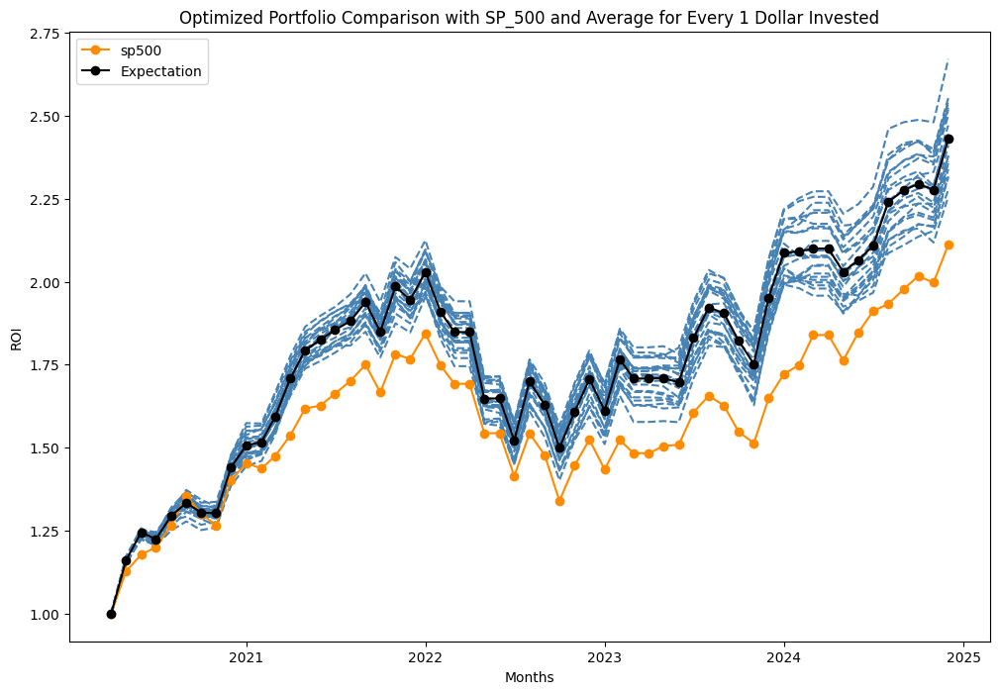

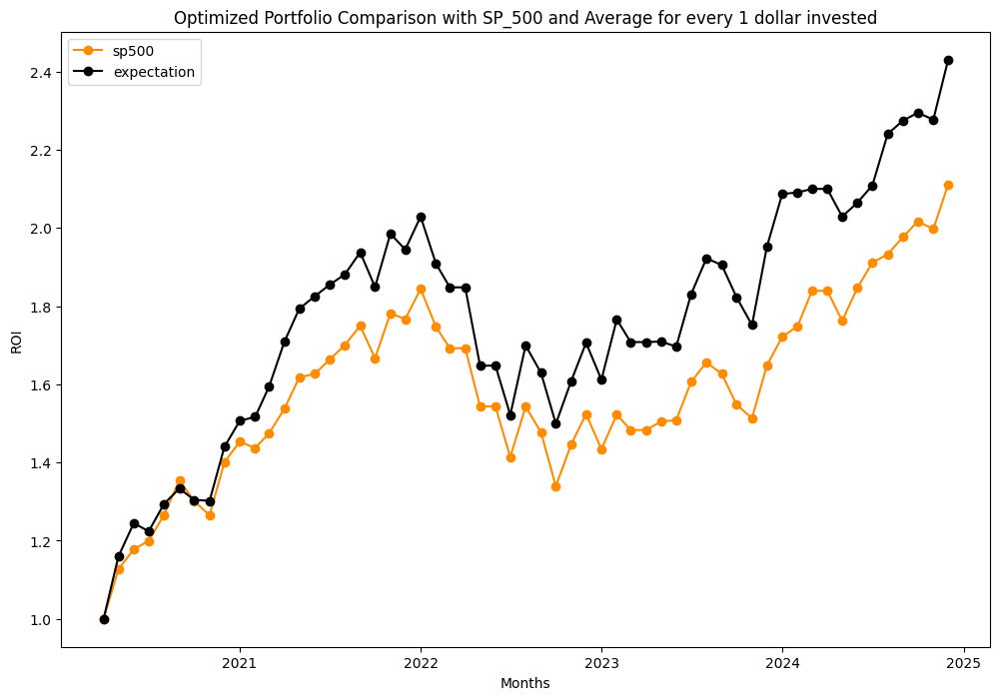

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


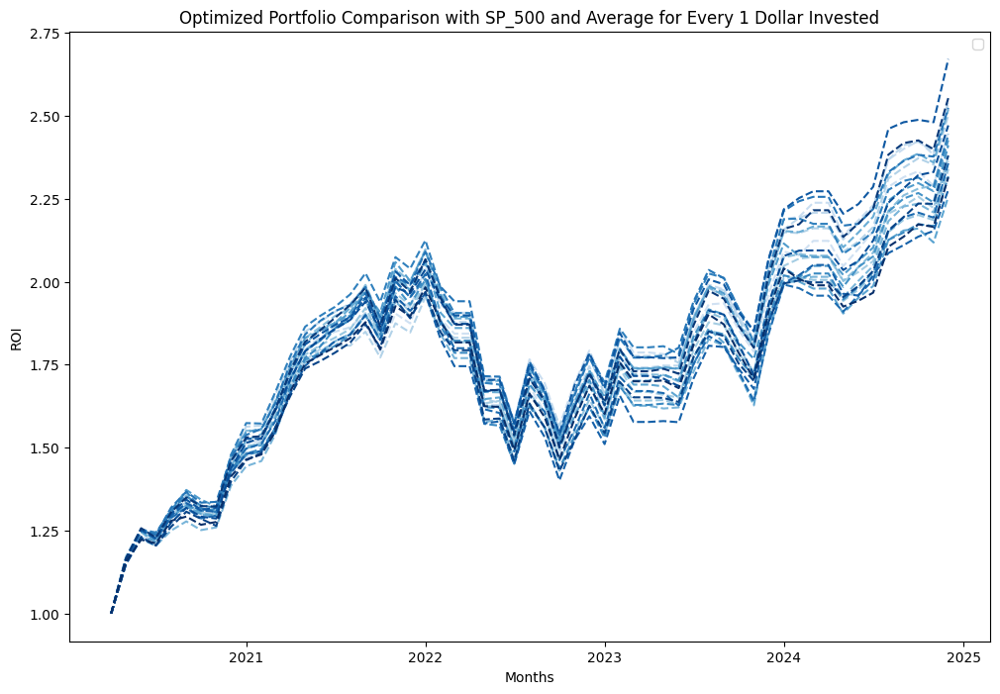

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.126844,1.159699
2020-06-01,1.177870,1.245022
2020-07-01,1.199528,1.223847
2020-08-01,1.265624,1.294198
2020-09-01,1.354300,1.333264
2020-10-01,1.301173,1.304339
2020-11-01,1.265175,1.301999
2020-12-01,1.401239,1.440310


In [70]:
avg_100=final_visual('sp500')#100
final_visual2('sp500')
final_visual1()
avg_100

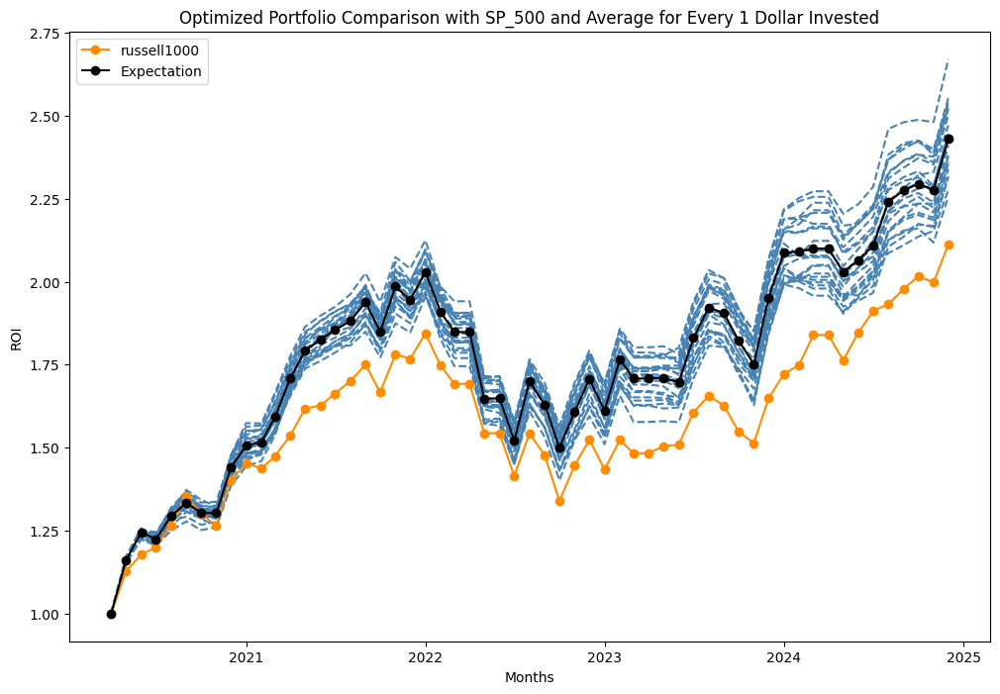

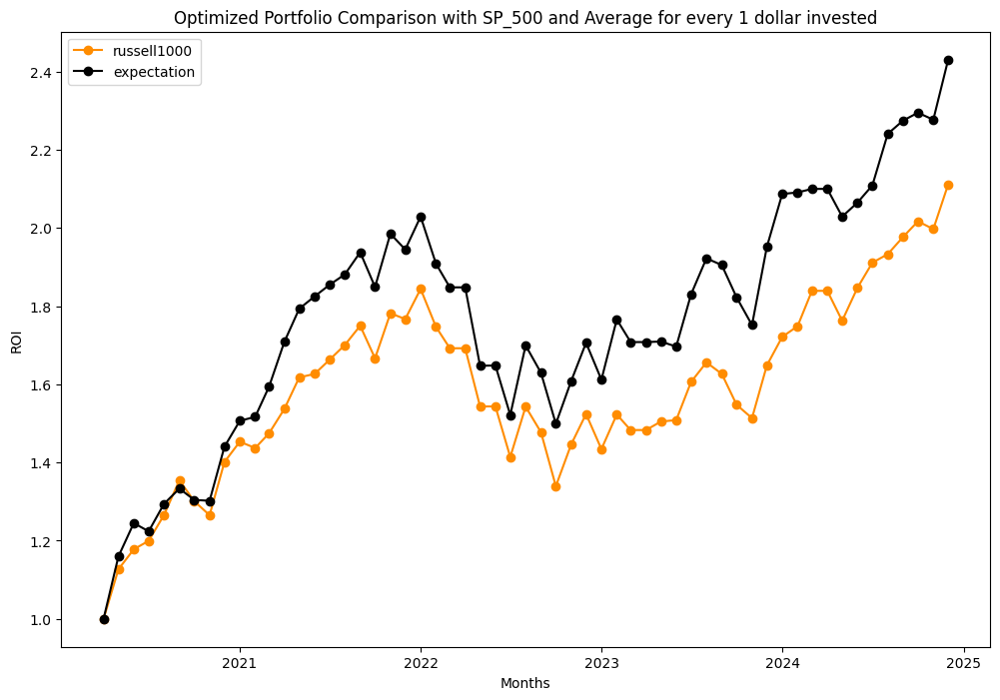

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


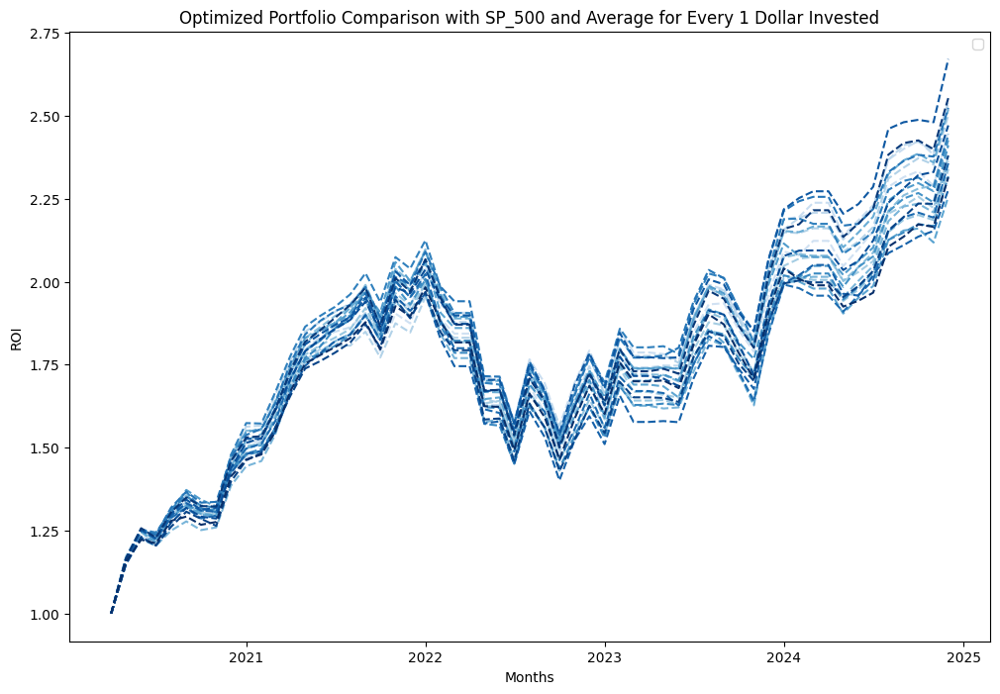

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.126844,1.159699
2020-06-01,1.177870,1.245022
2020-07-01,1.199528,1.223847
2020-08-01,1.265624,1.294198
2020-09-01,1.354300,1.333264
2020-10-01,1.301173,1.304339
2020-11-01,1.265175,1.301999
2020-12-01,1.401239,1.440310


In [254]:
Ravg_100=final_visual('russell1000')#100
final_visual2('russell1000')
final_visual1()
Ravg_100

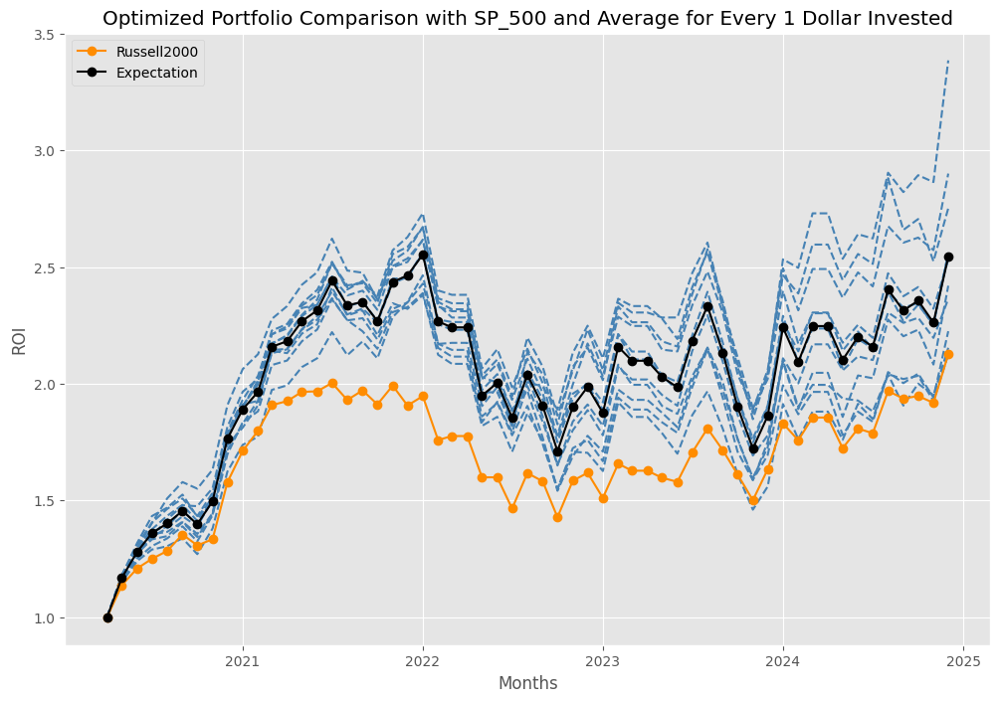

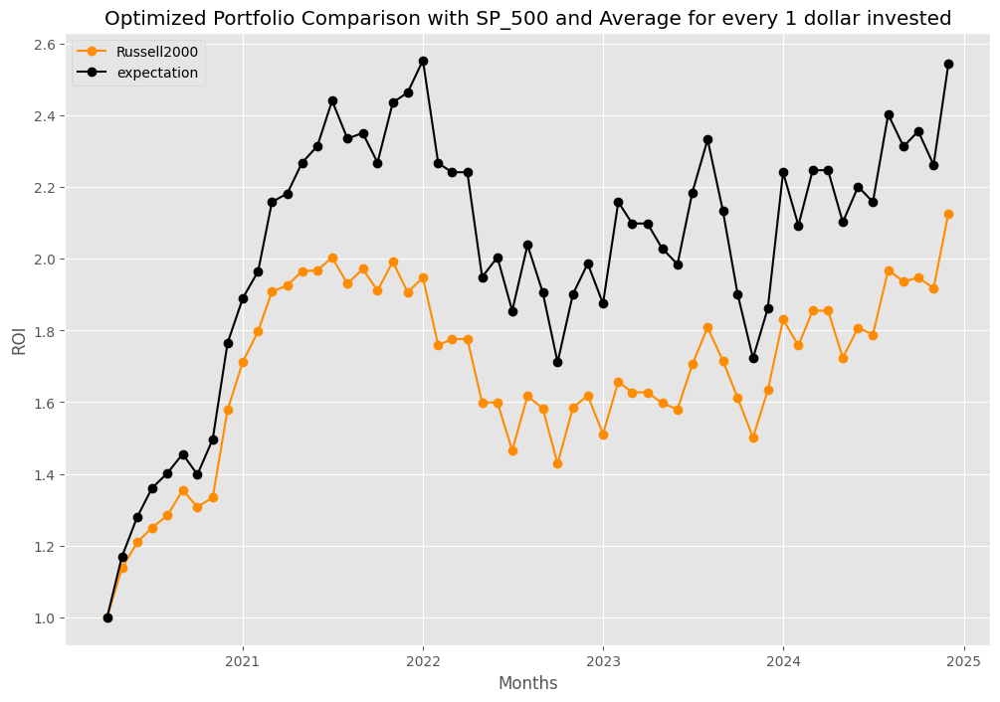

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


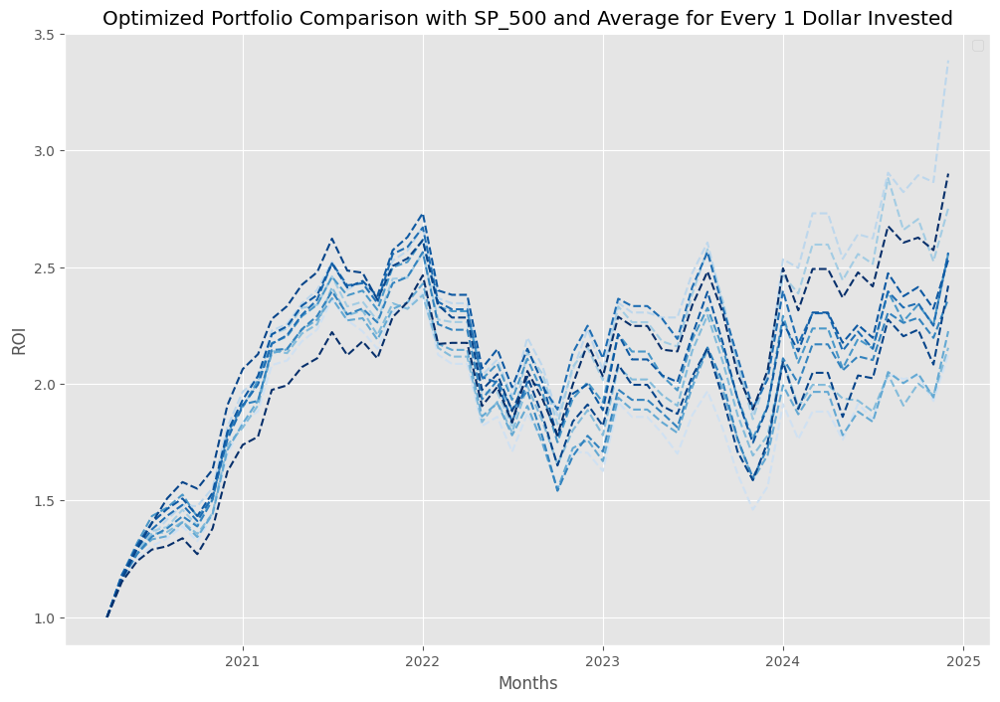

In [ ]:
avg_100=final_visual('Russell2000')#100
final_visual2('Russell2000')
final_visual1()
avg_100

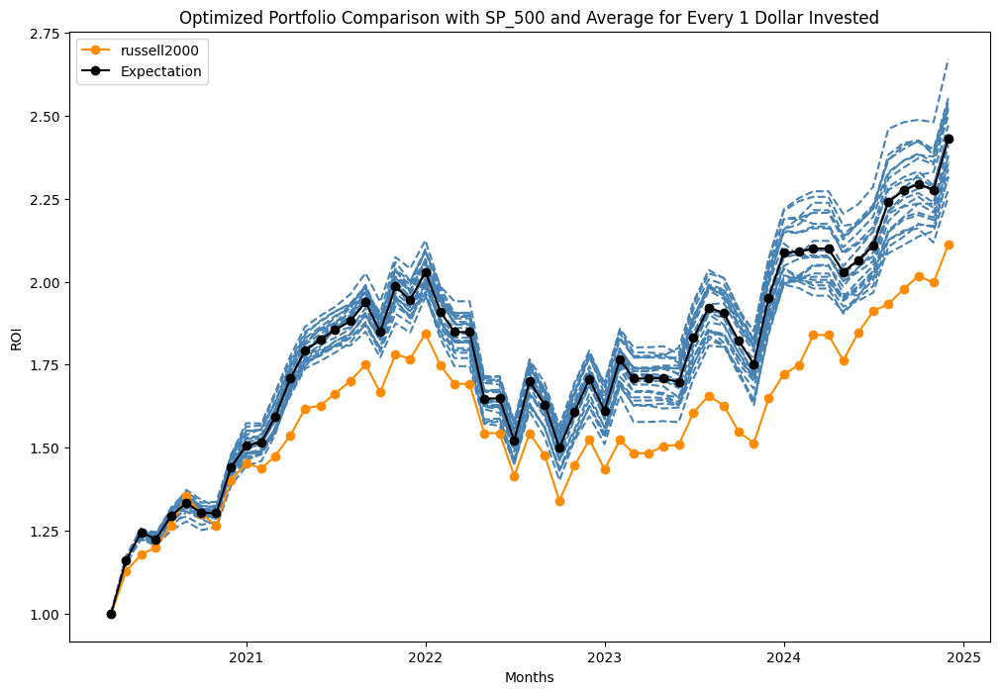

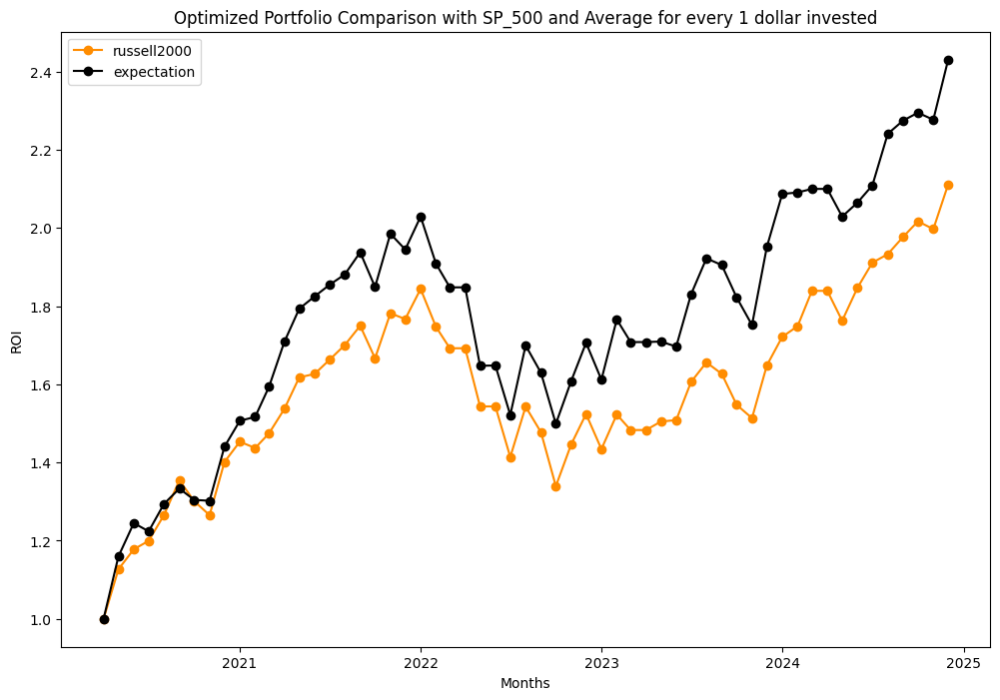

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


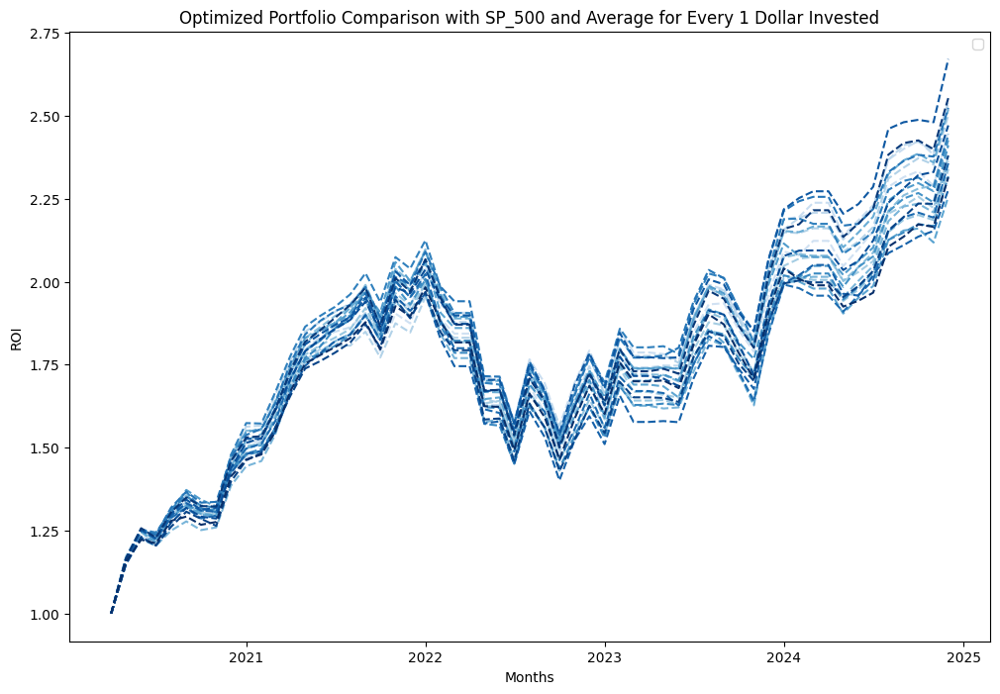

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.126844,1.159699
2020-06-01,1.177870,1.245022
2020-07-01,1.199528,1.223847
2020-08-01,1.265624,1.294198
2020-09-01,1.354300,1.333264
2020-10-01,1.301173,1.304339
2020-11-01,1.265175,1.301999
2020-12-01,1.401239,1.440310


In [74]:
ravg_100=final_visual('russell2000')#100
final_visual2('russell2000')
final_visual1()
ravg_100

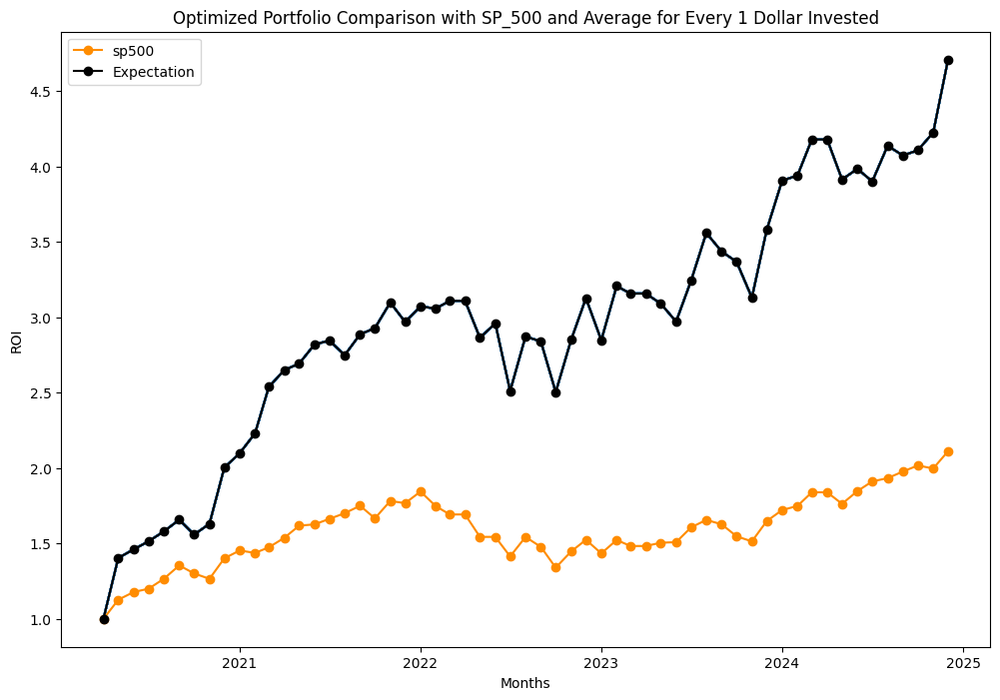

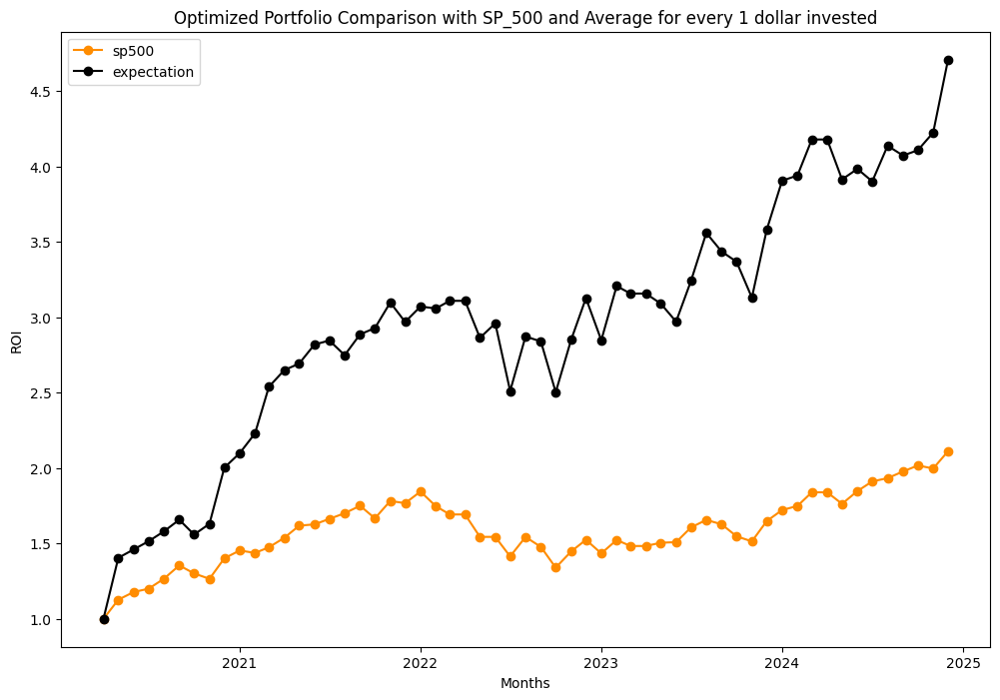

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


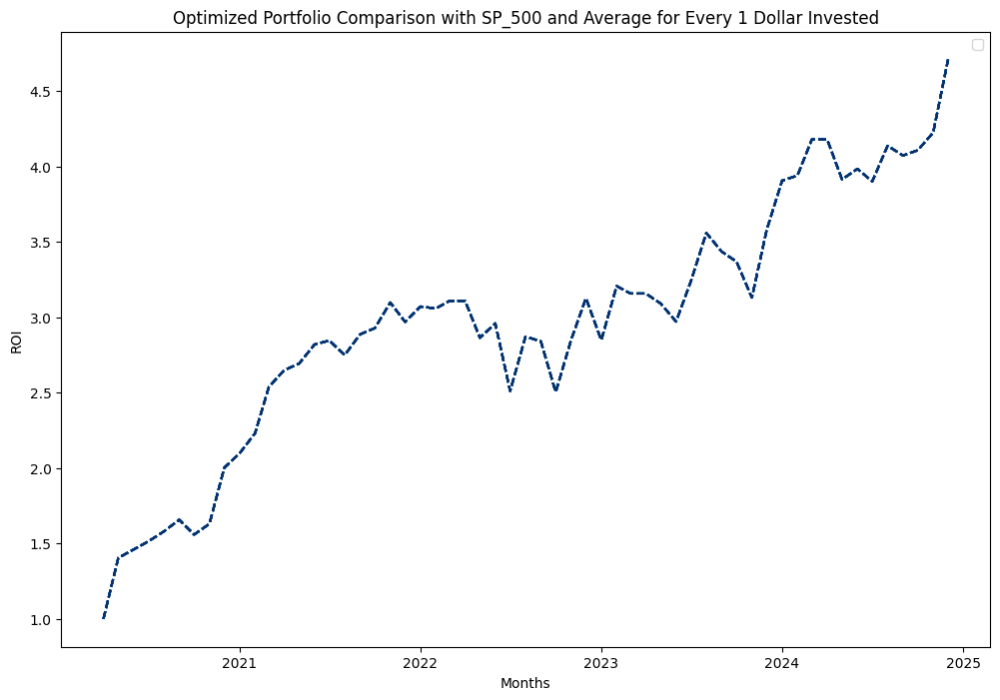

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.126844,1.404360
2020-06-01,1.177870,1.460172
2020-07-01,1.199528,1.514194
2020-08-01,1.265624,1.579733
2020-09-01,1.354300,1.657150
2020-10-01,1.301173,1.558757
2020-11-01,1.265175,1.630044
2020-12-01,1.401239,2.002492


In [508]:
avg_128=final_visual('sp500',oos1_list2)#100
final_visual2('sp500',oos1_list2)
final_visual1(oos1_list2)
avg_128

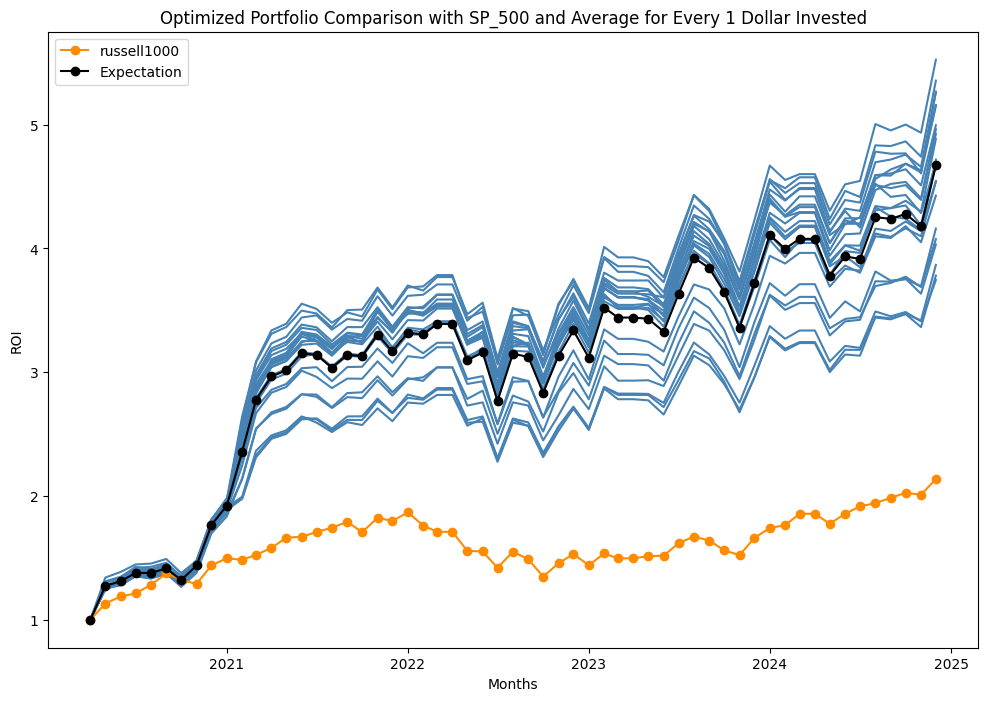

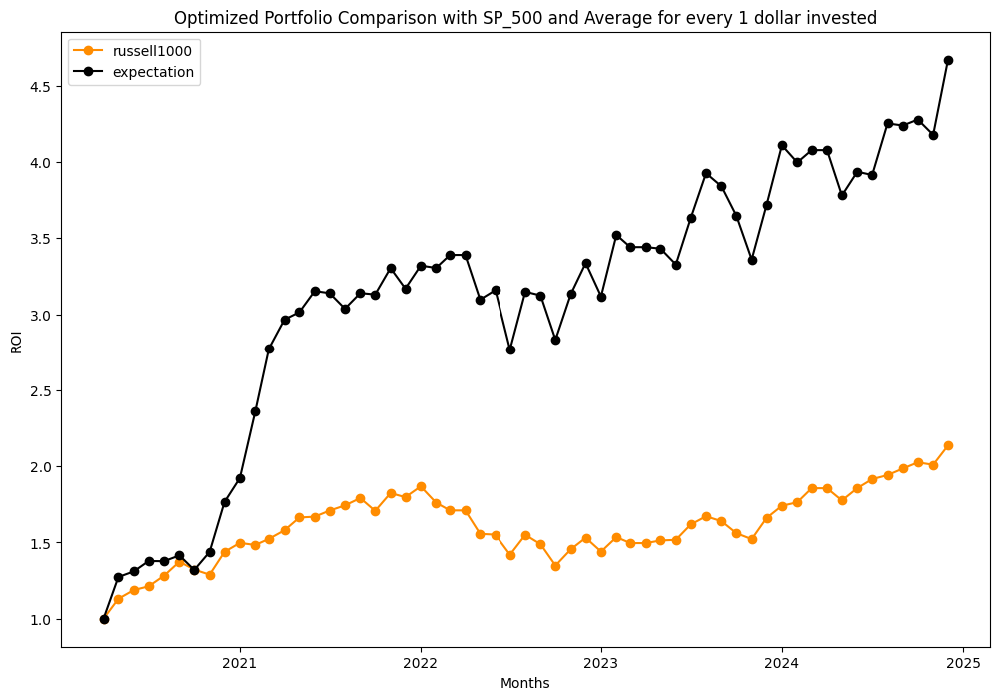

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


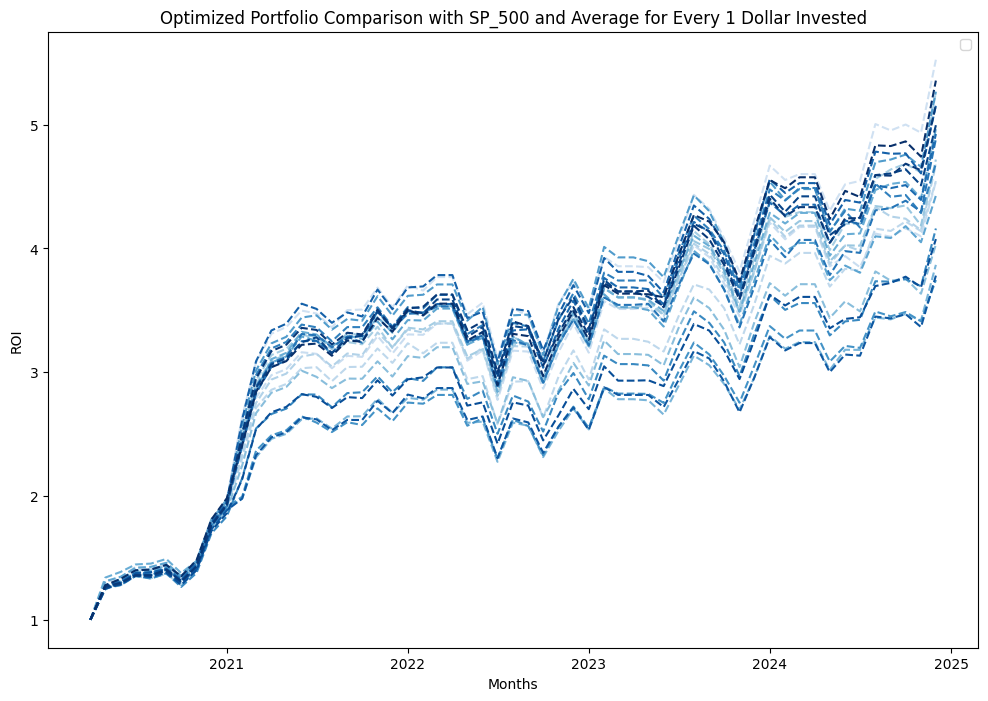

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.130837,1.273559
2020-06-01,1.187972,1.310242
2020-07-01,1.212483,1.378462
2020-08-01,1.282035,1.377284
2020-09-01,1.373924,1.415249
2020-10-01,1.322071,1.319856
2020-11-01,1.288869,1.438376
2020-12-01,1.438316,1.765463


In [505]:
Ravg_128=final_visual('russell1000',R2oos1_list)#100
final_visual2('russell1000',R2oos1_list)
final_visual1(R2oos1_list)
Ravg_128

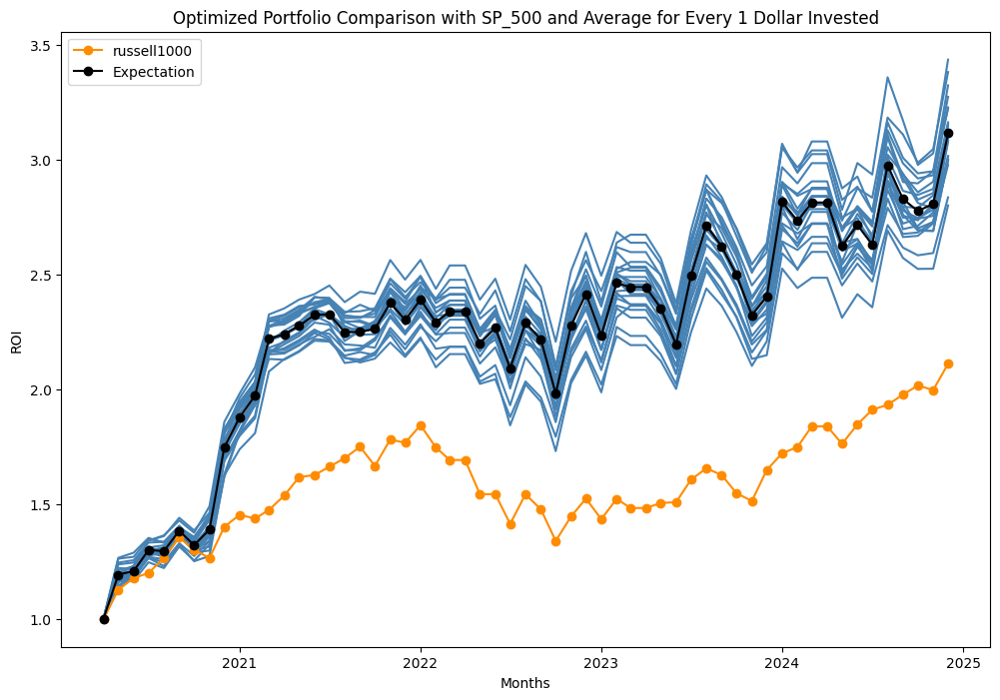

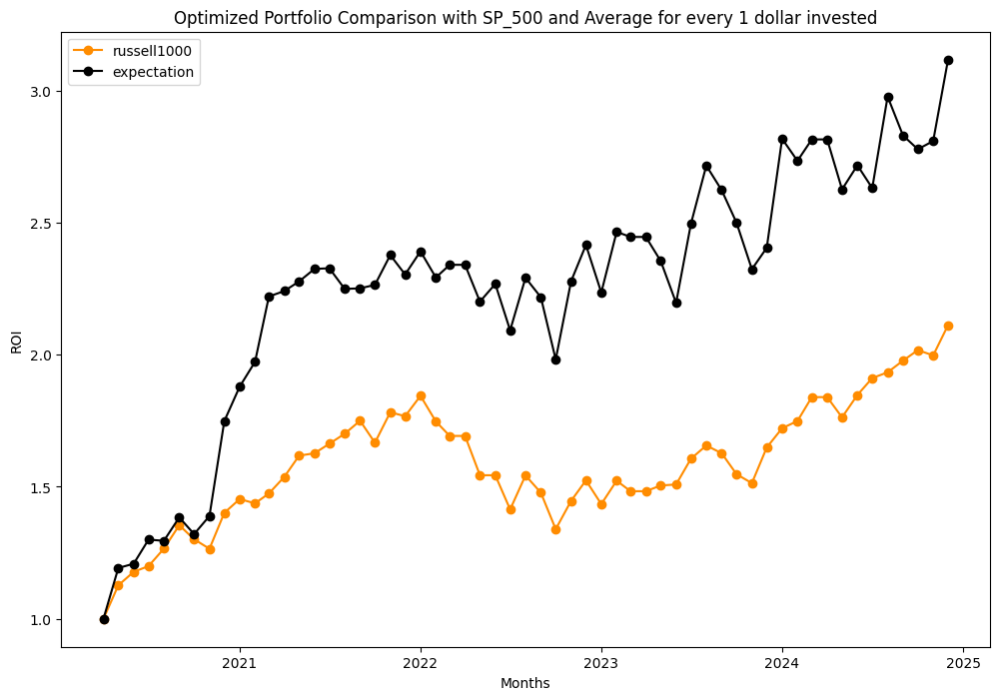

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


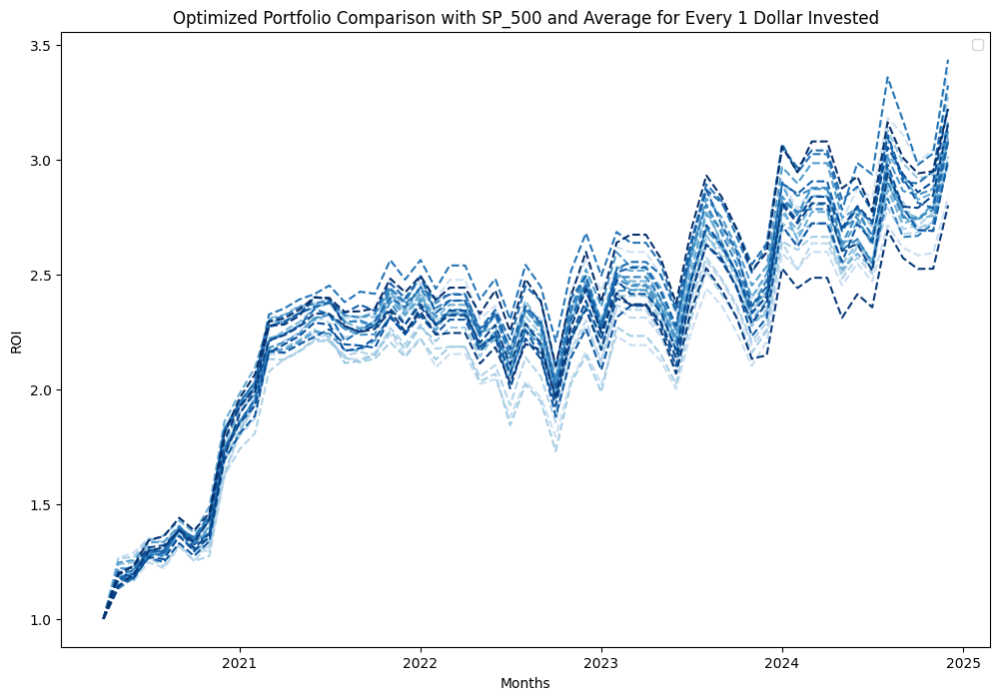

,SP_500,Optimized Portfolio
Date,,
2020-04-01,1.000000,1.000000
2020-05-01,1.126844,1.192435
2020-06-01,1.177870,1.208524
2020-07-01,1.199528,1.299836
2020-08-01,1.265624,1.295304
2020-09-01,1.354300,1.383962
2020-10-01,1.301173,1.320793
2020-11-01,1.265175,1.389254
2020-12-01,1.401239,1.748643


In [516]:
ravg_128=final_visual('russell2000',r2oos1_list)#100
final_visual2('russell2000',r2oos1_list)
final_visual1(r2oos1_list)
ravg_128

# 2 Portfolio visual

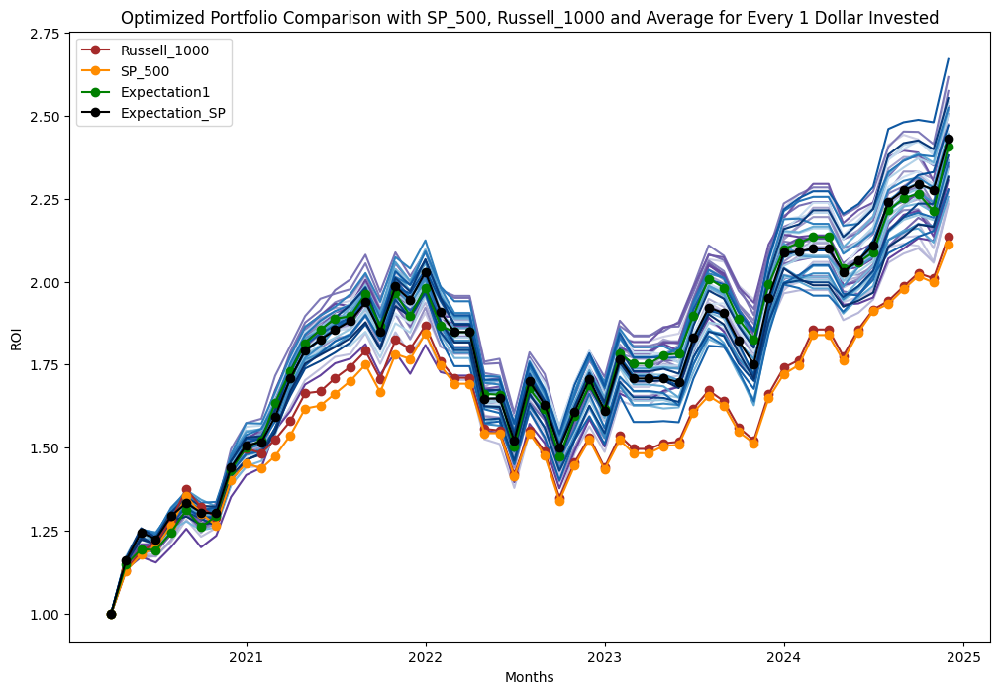

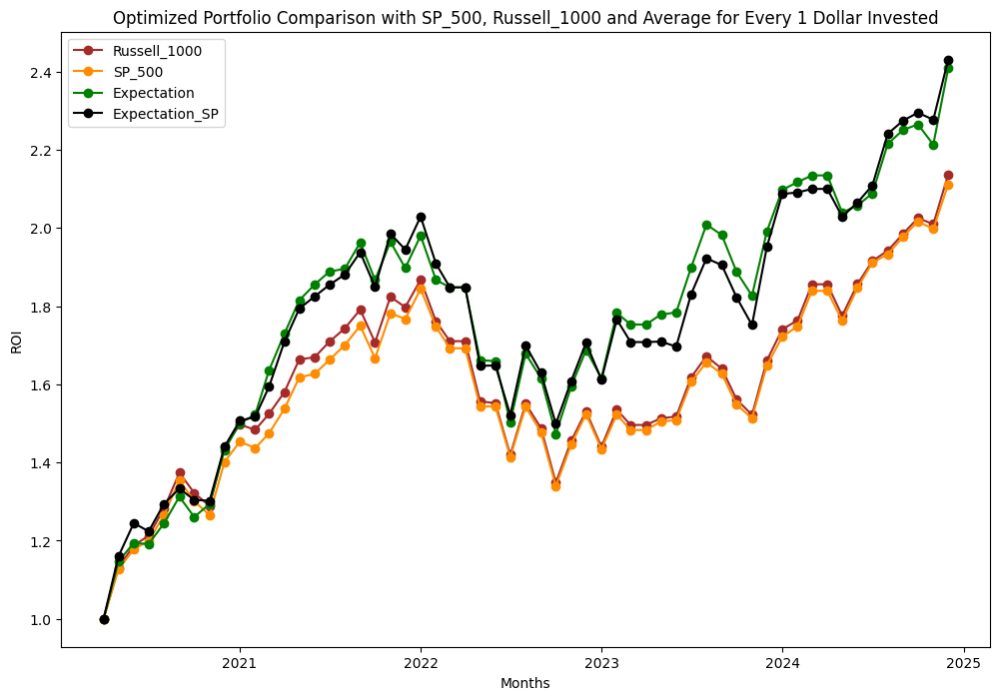

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


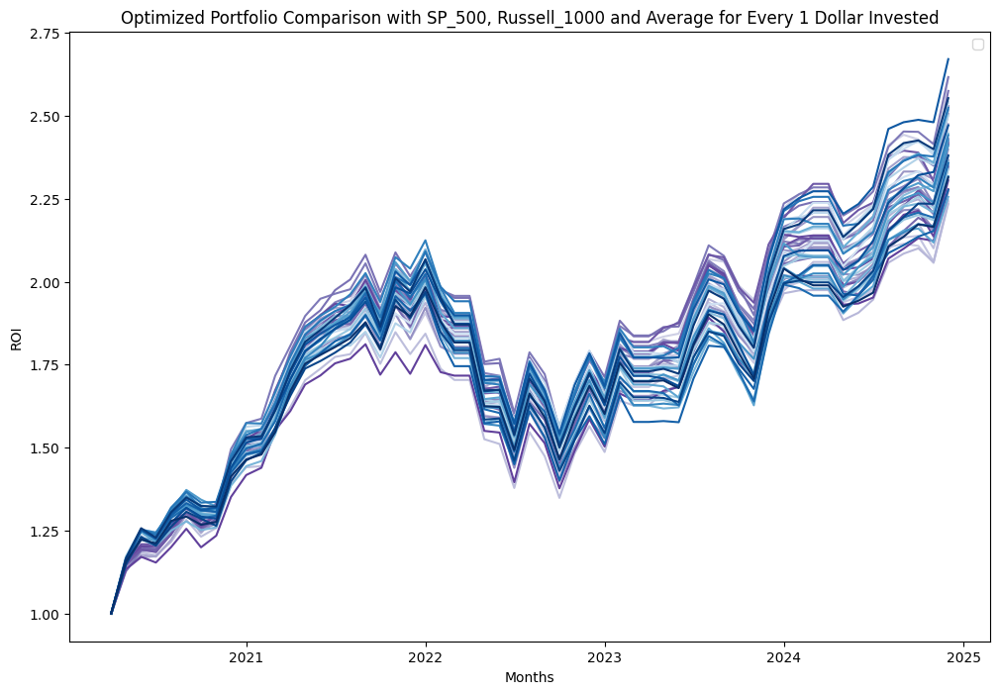

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


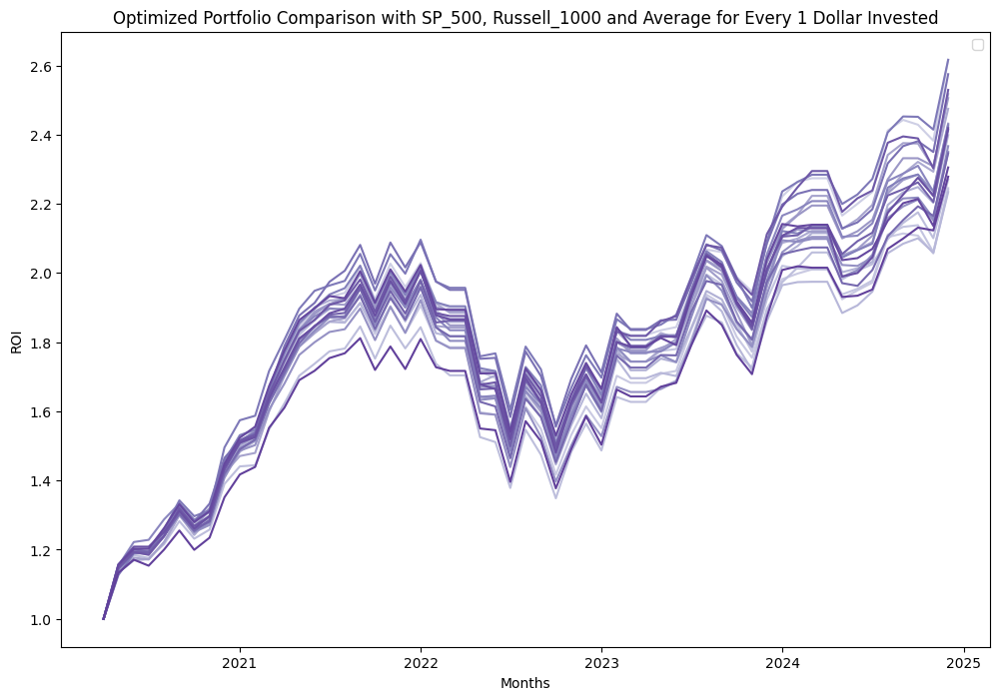

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


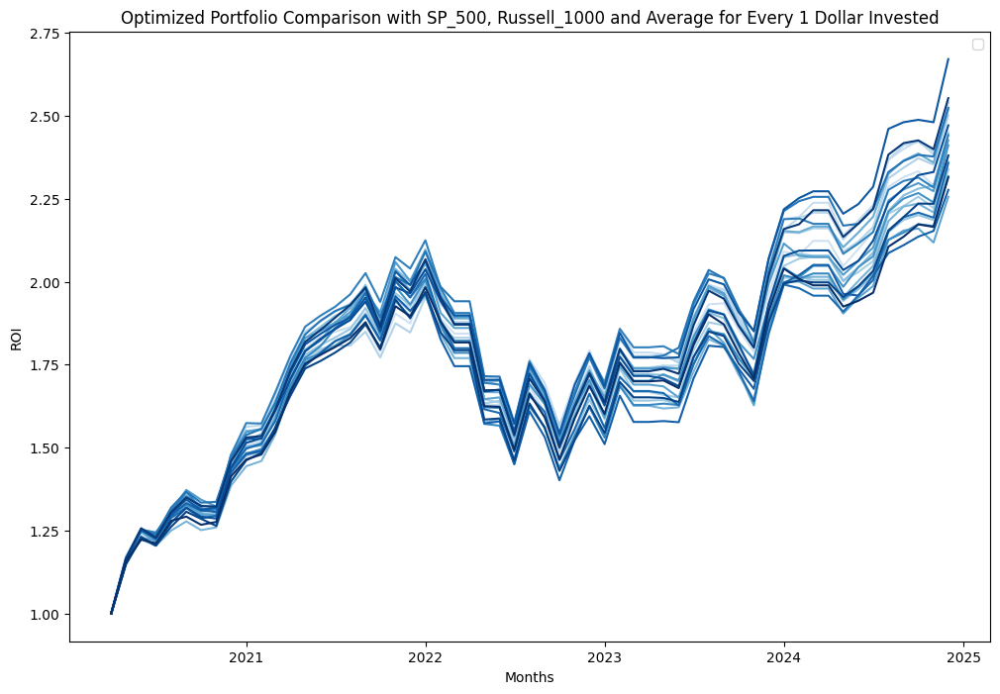

In [450]:
avg_r,avg_s=cfinal_visual('Russell_1000',Roos1_list,oos1_list)
cfinal_visual1('Russell_1000',Roos1_list,oos1_list)
cfinal_visual2('Russell_1000',Roos1_list,oos1_list)
cfinal_visual3('Russell_1000',Roos1_list,oos1_list)
cfinal_visual4('Russell_1000',Roos1_list,oos1_list)

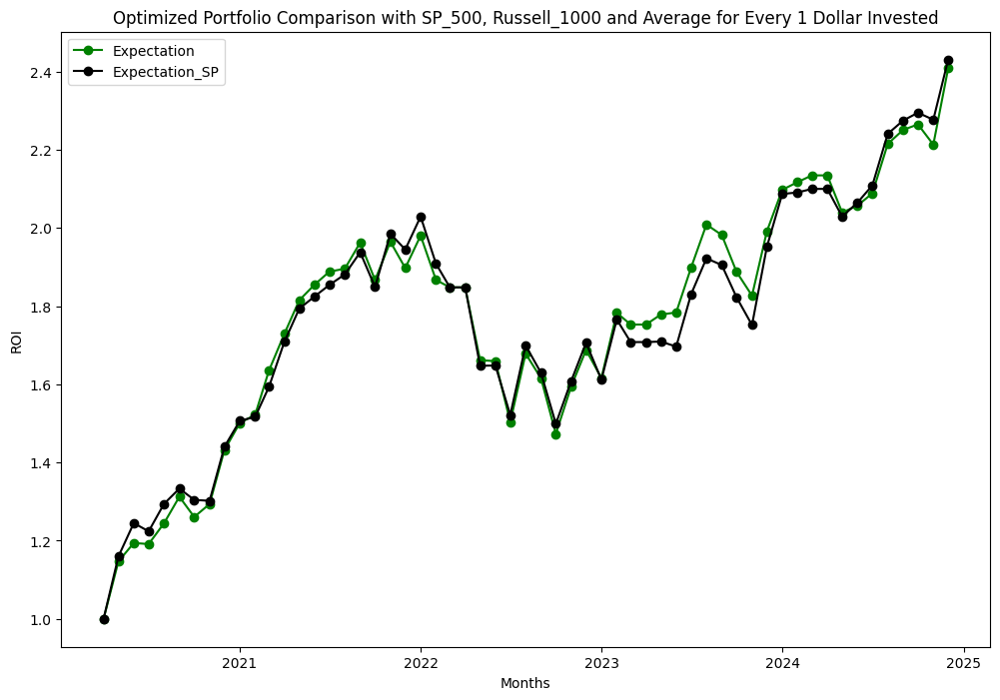

In [451]:
cfinal_visual1a('Russell_1000',Roos1_list,oos1_list)

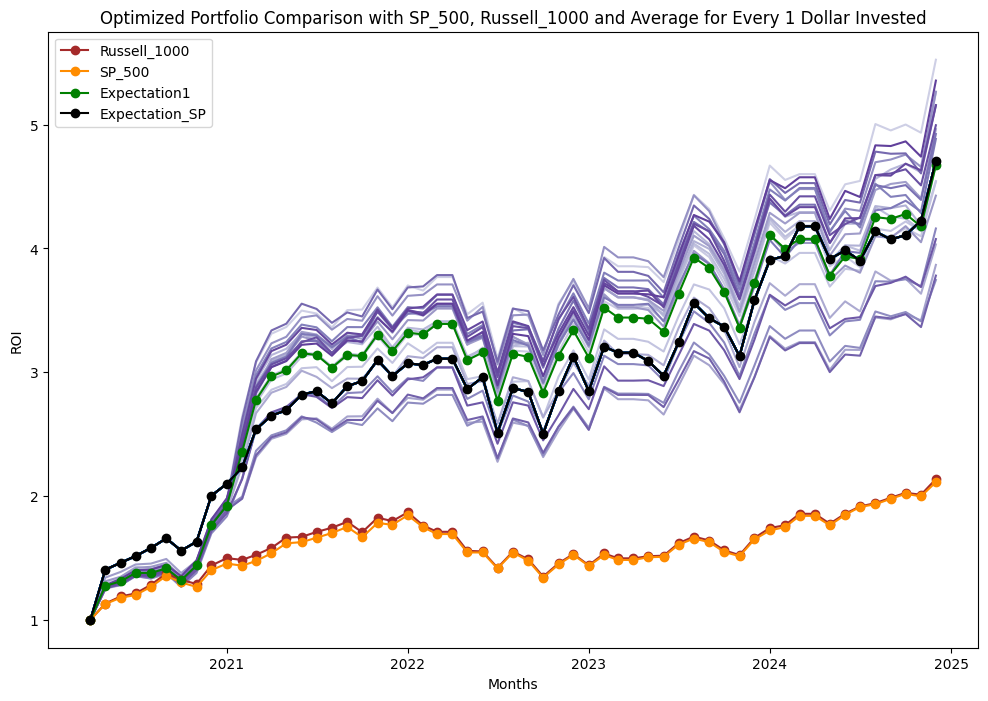

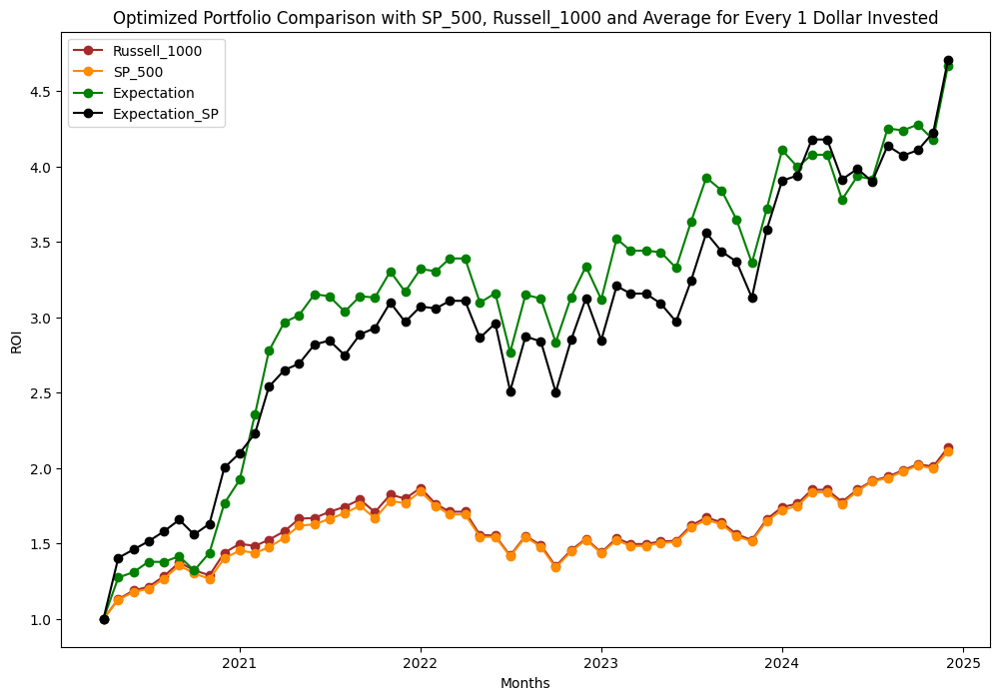

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


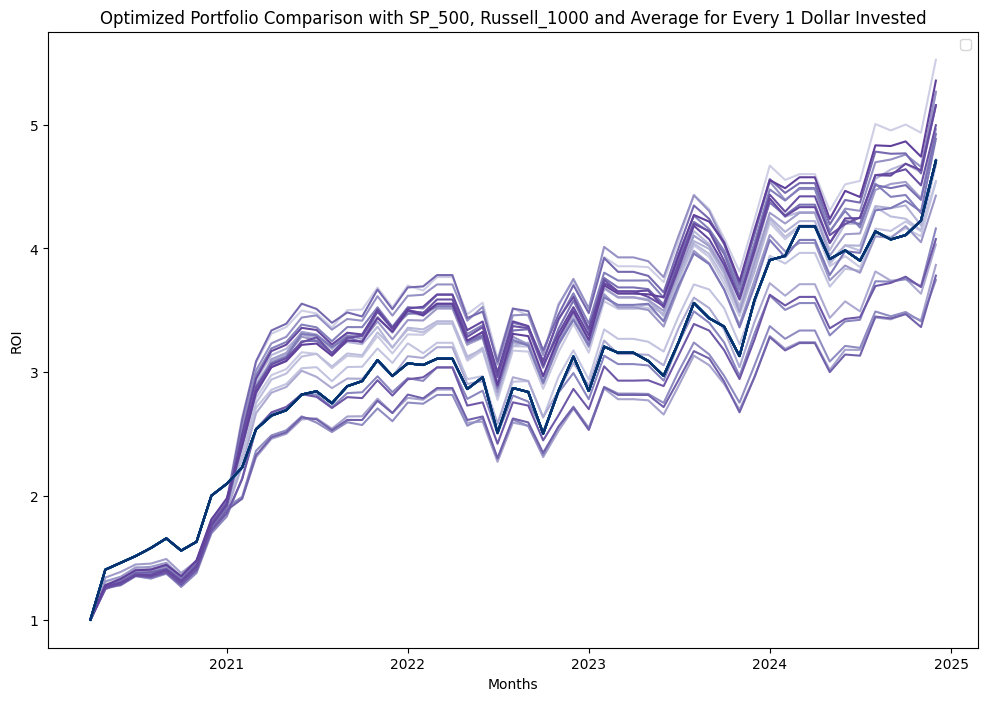

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


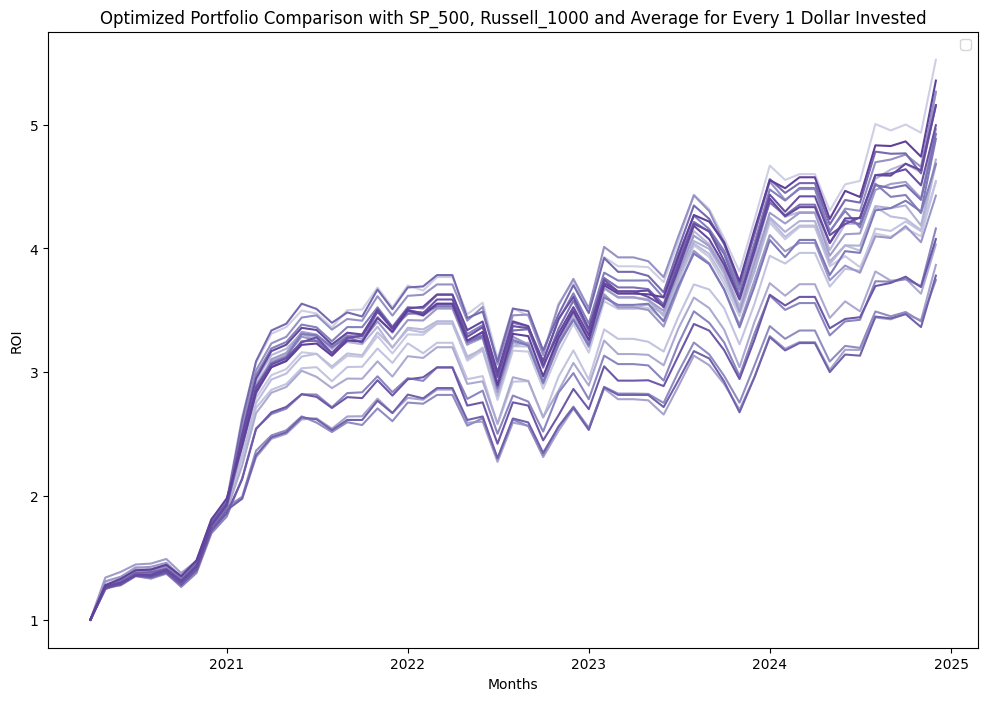

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


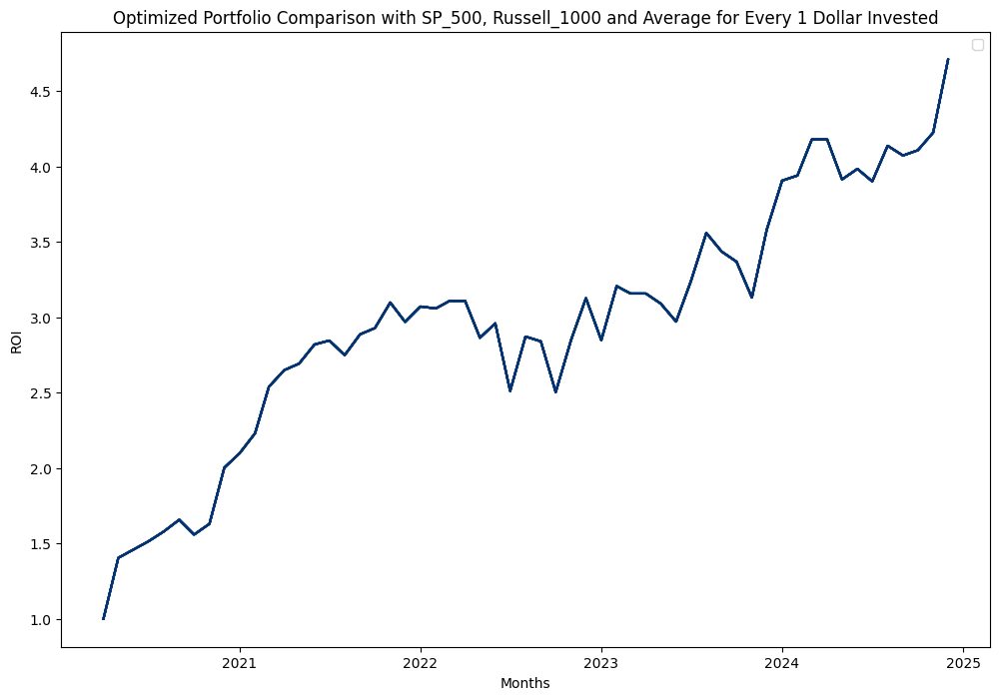

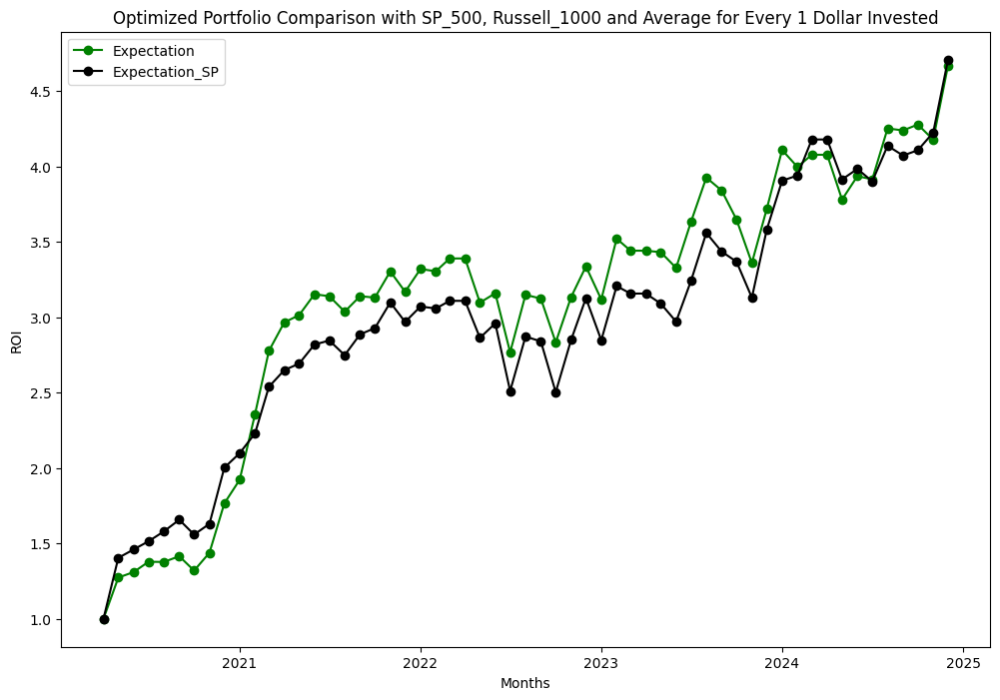

In [509]:
R2avg_r,R2avg_s=cfinal_visual('Russell_1000',R2oos1_list,oos1_list2)
cfinal_visual1('Russell_1000',R2oos1_list,oos1_list2)
cfinal_visual2('Russell_1000',R2oos1_list,oos1_list2)
cfinal_visual3('Russell_1000',R2oos1_list,oos1_list2)
cfinal_visual4('Russell_1000',R2oos1_list,oos1_list2)
cfinal_visual1a('Russell_1000',R2oos1_list,oos1_list2)

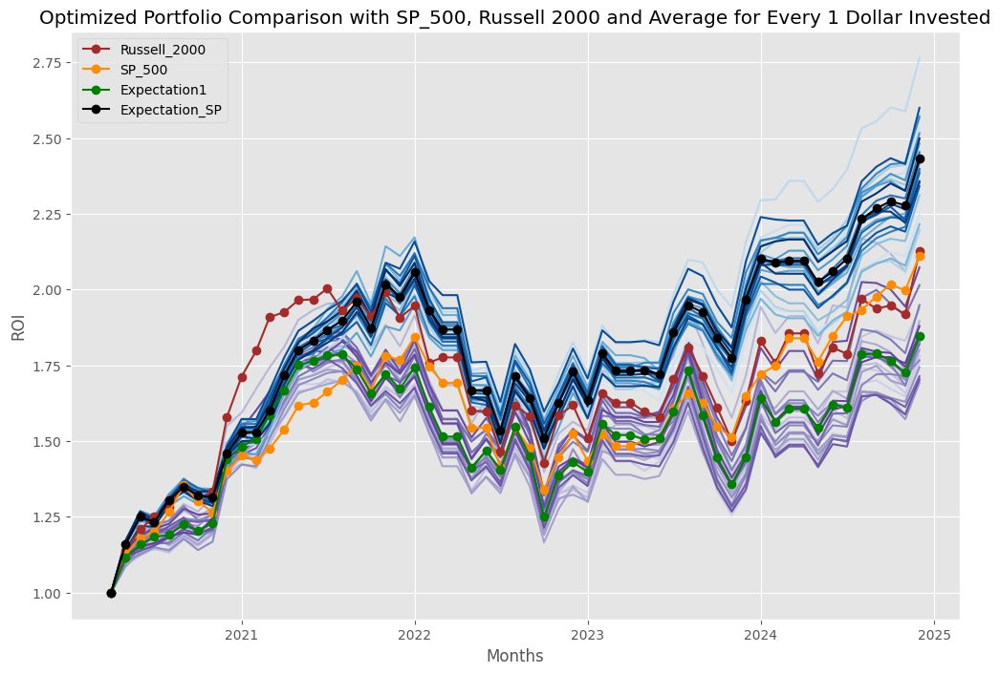

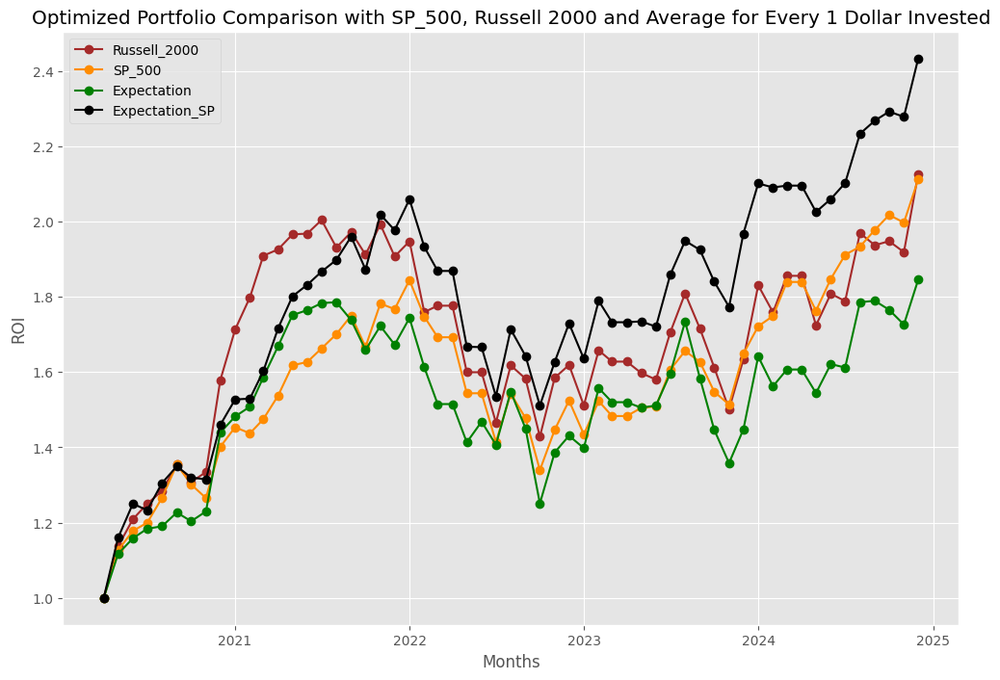

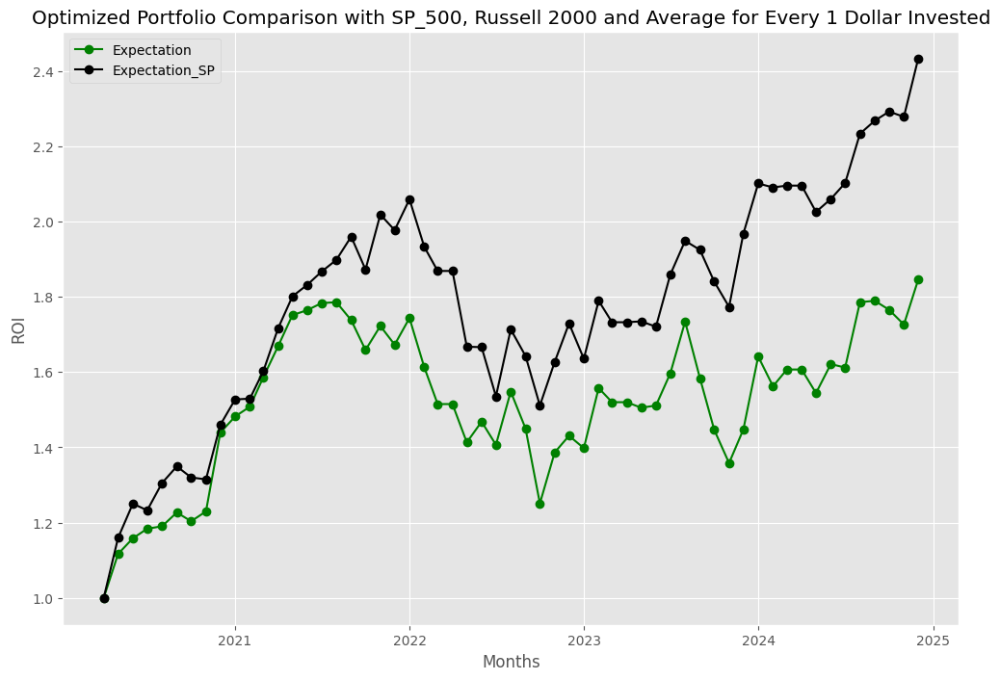

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


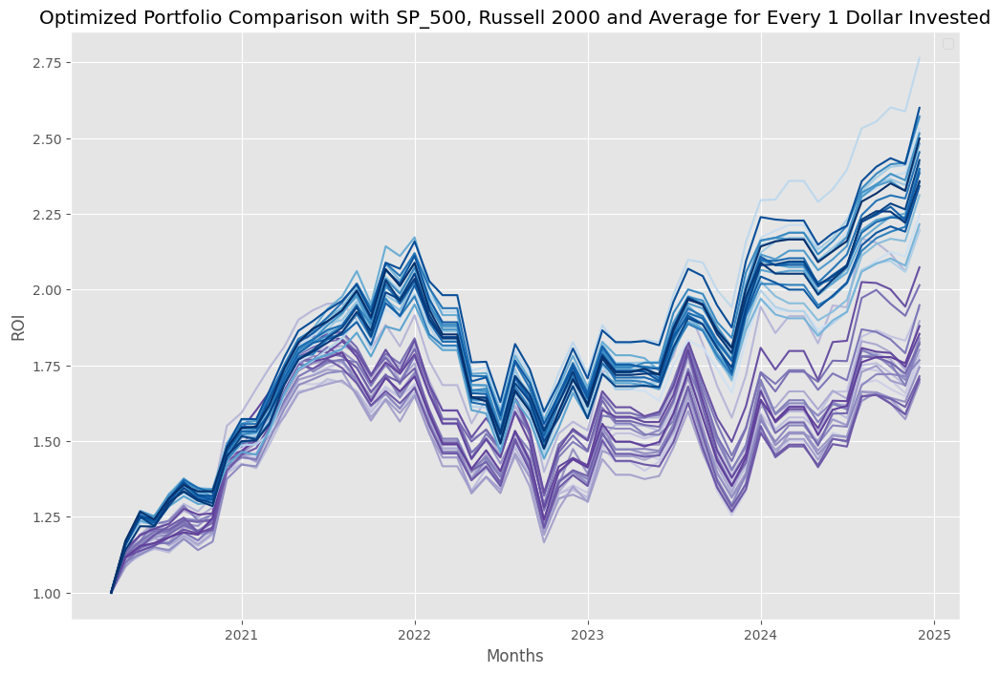

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


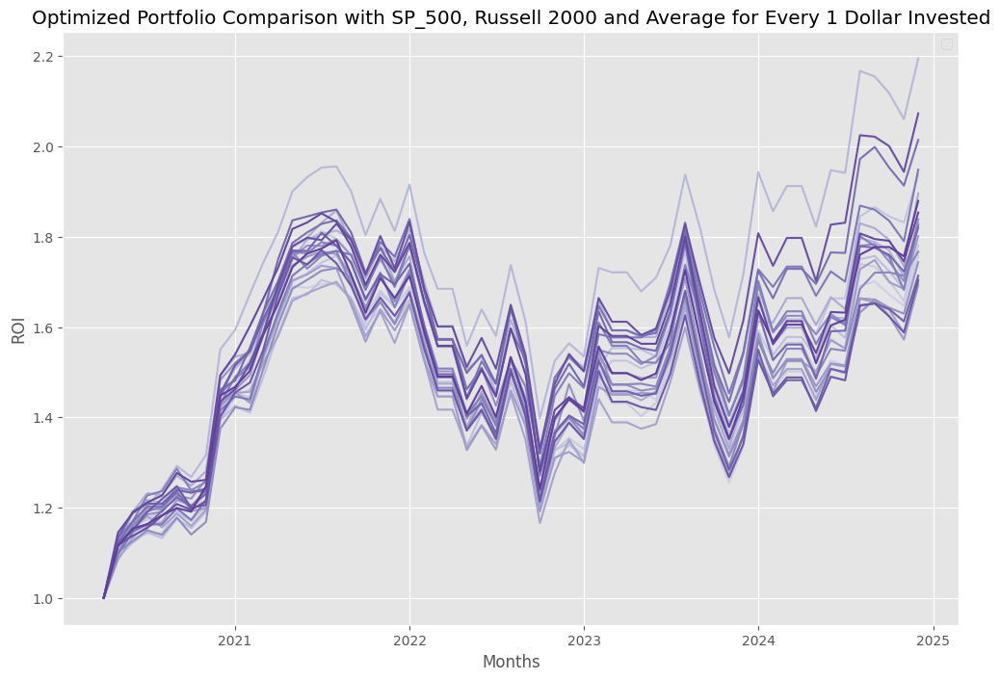

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


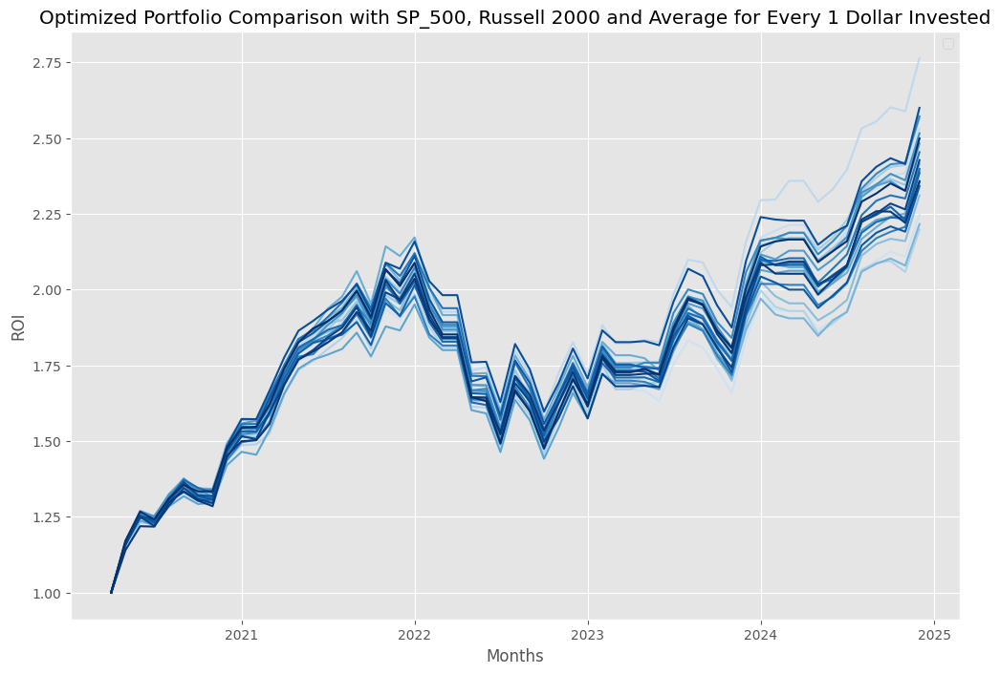

In [218]:
avg_rr,avg_ss=cfinal_visual('Russell_2000',roos1_list,oos1_list)
cfinal_visual1('Russell_2000',roos1_list,oos1_list)
cfinal_visual1a('Russell_2000',roos1_list,oos1_list)
cfinal_visual2('Russell_2000',roos1_list,oos1_list)
cfinal_visual3('Russell_2000',roos1_list,oos1_list)
cfinal_visual4('Russell_2000',roos1_list,oos1_list)

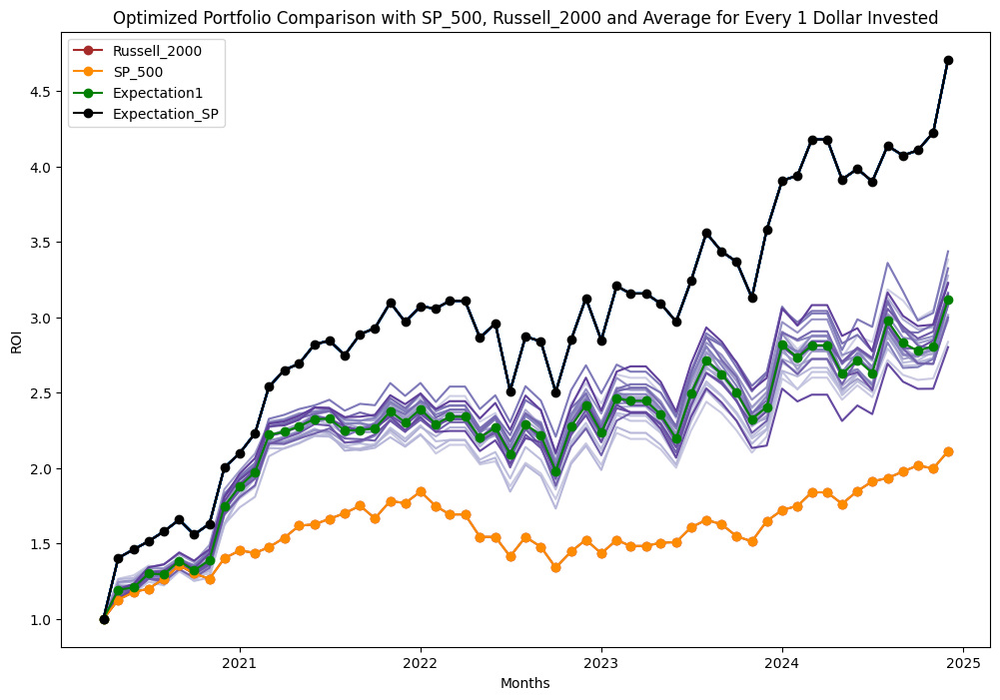

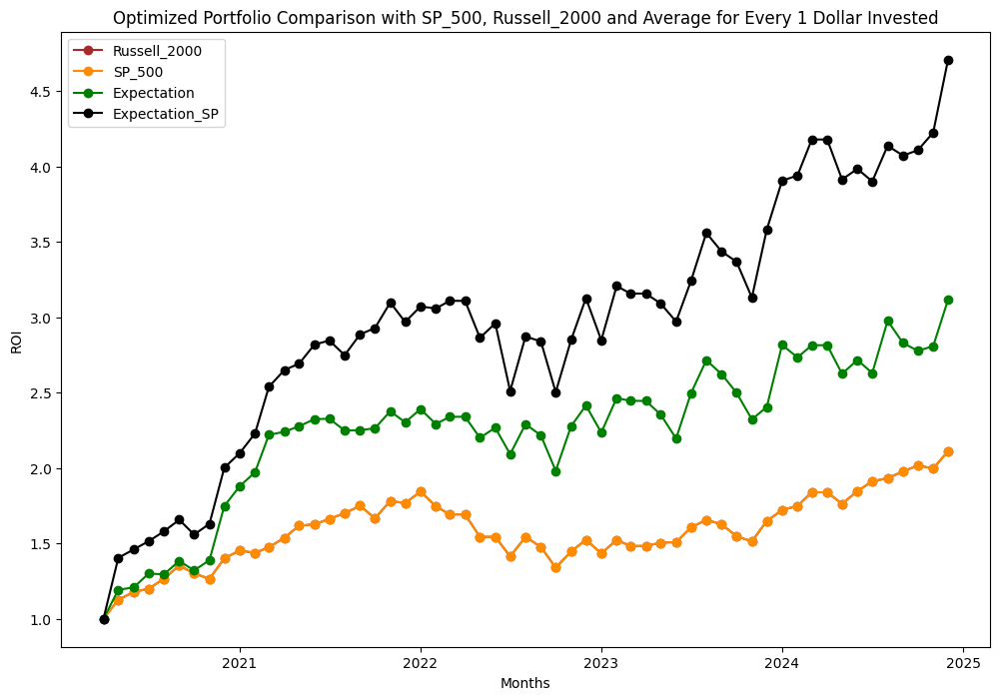

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


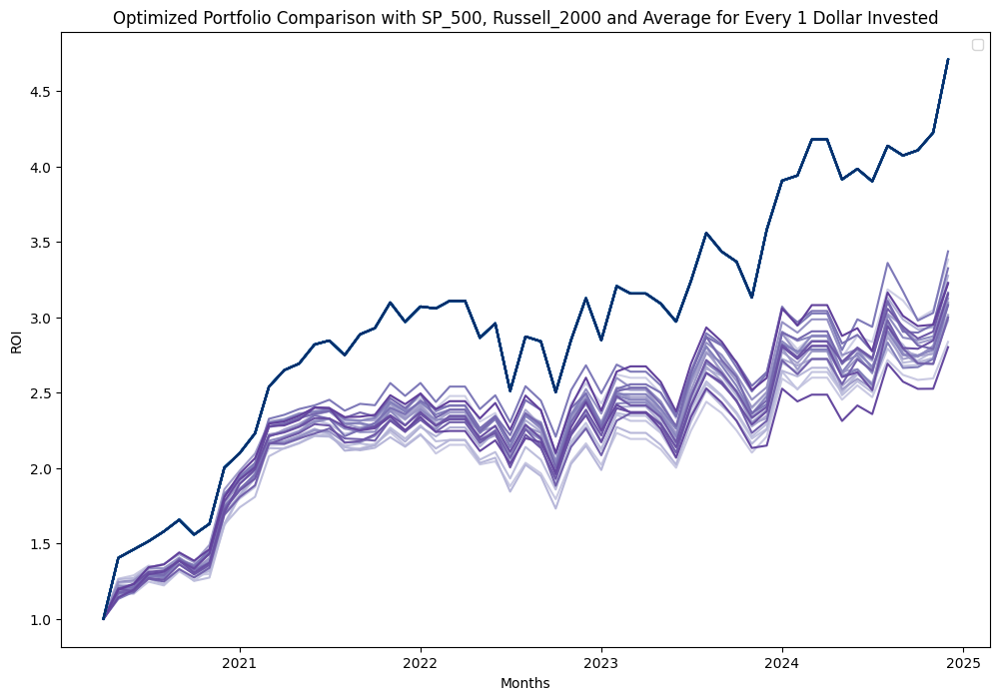

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


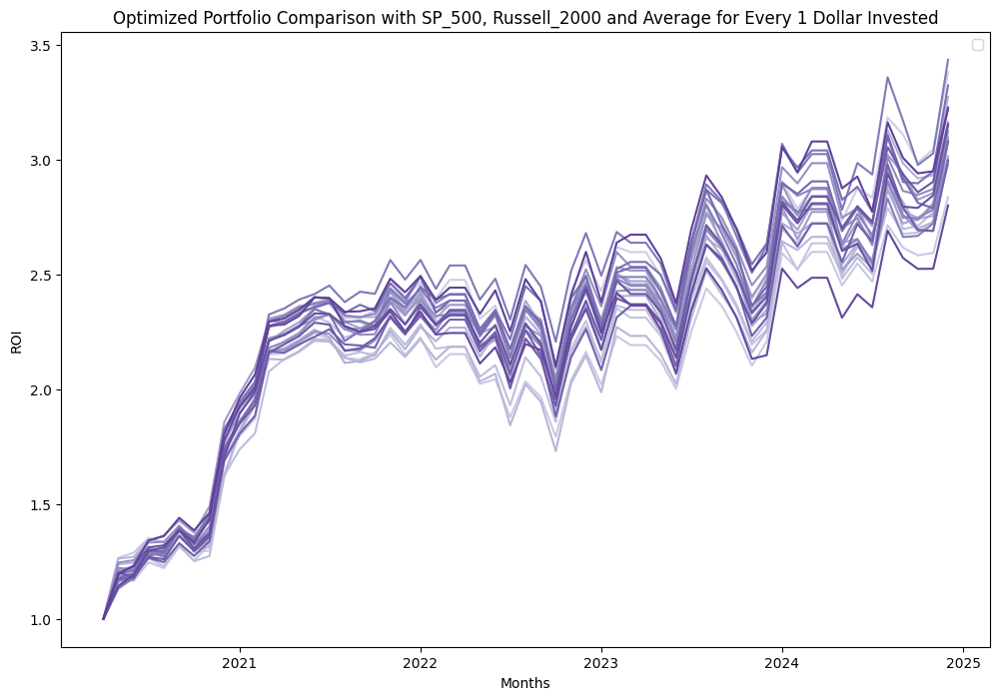

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


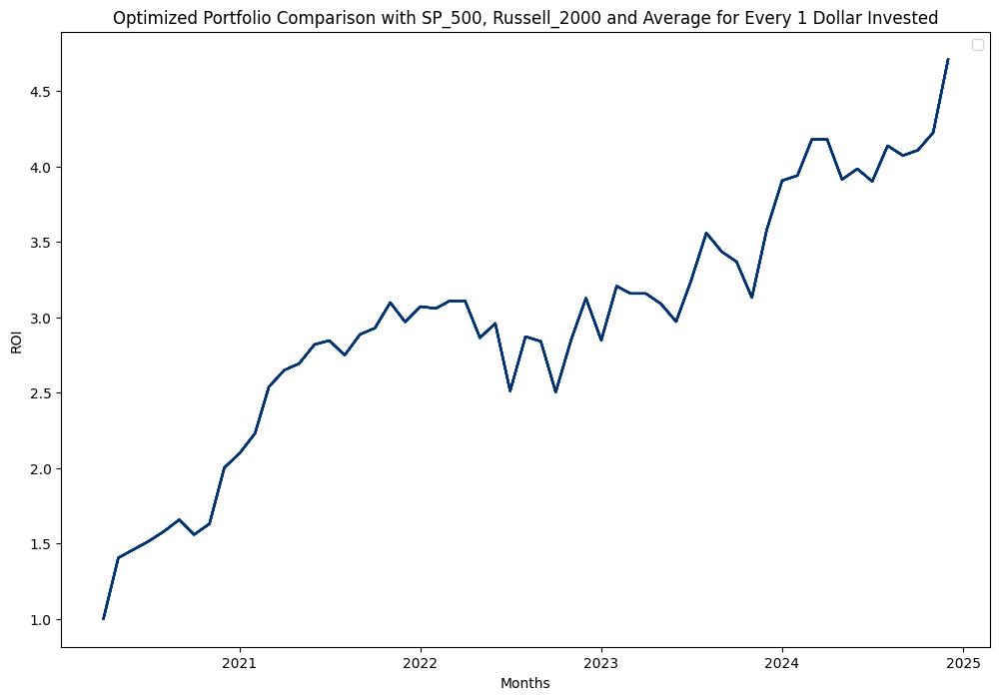

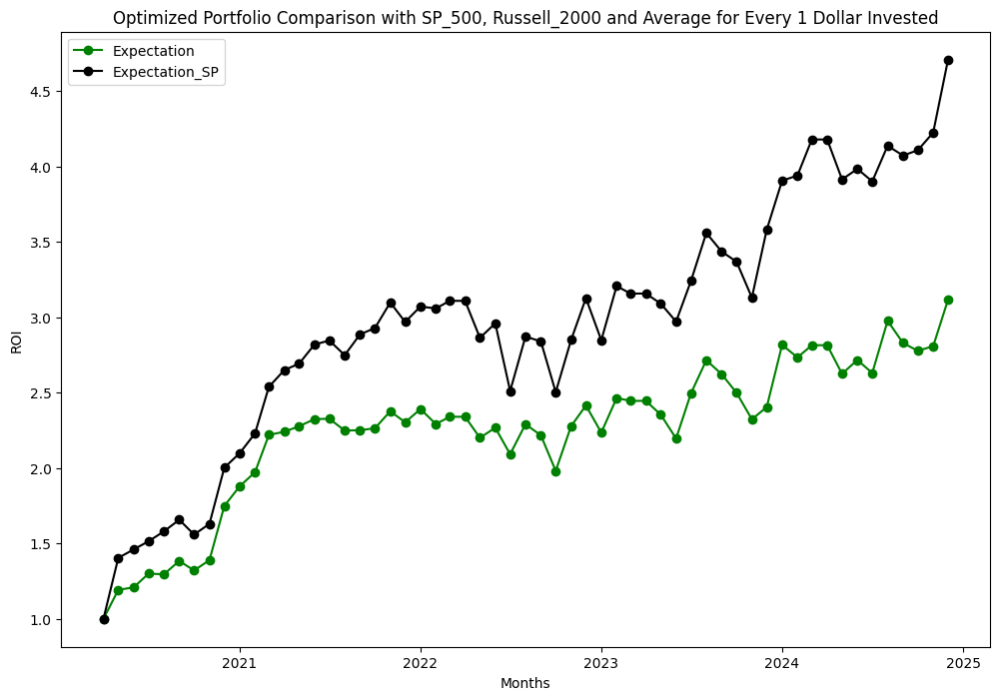

In [517]:
r2avg_r,r2avg_s=cfinal_visual('Russell_2000',r2oos1_list,oos1_list2)
cfinal_visual1('Russell_2000',r2oos1_list,oos1_list2)
cfinal_visual2('Russell_2000',r2oos1_list,oos1_list2)
cfinal_visual3('Russell_2000',r2oos1_list,oos1_list2)
cfinal_visual4('Russell_2000',r2oos1_list,oos1_list2)
cfinal_visual1a('Russell_2000',r2oos1_list,oos1_list2)

# All portfolio visual

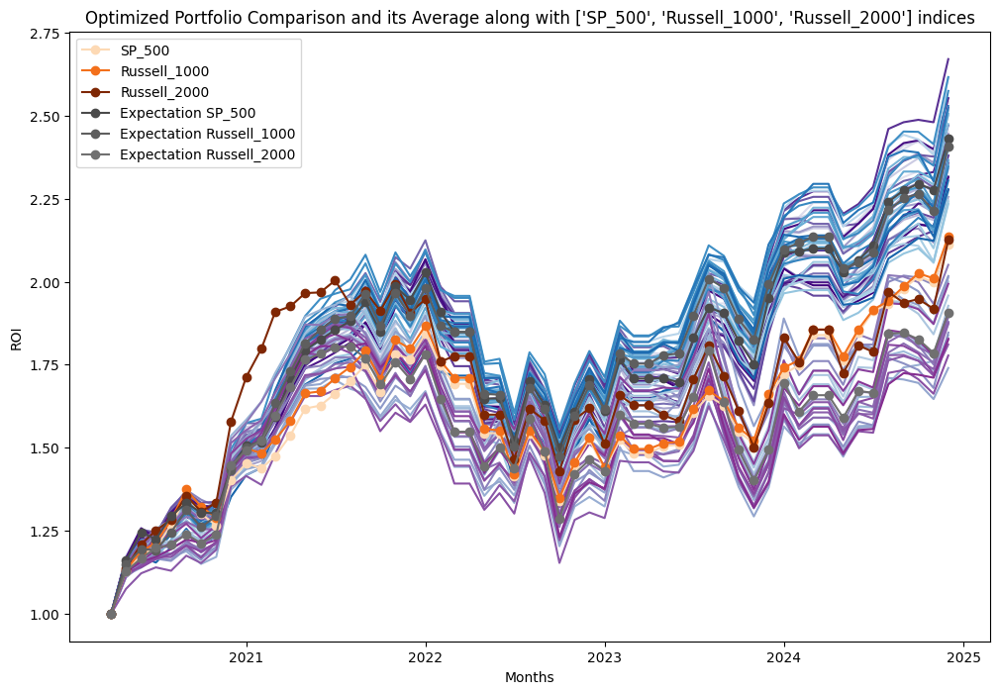

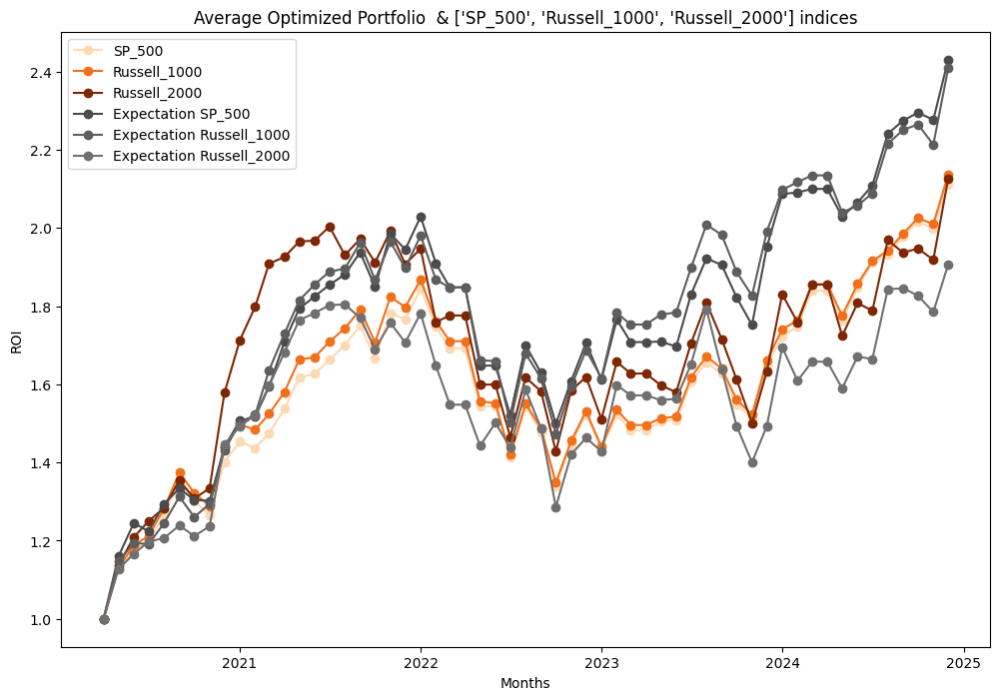

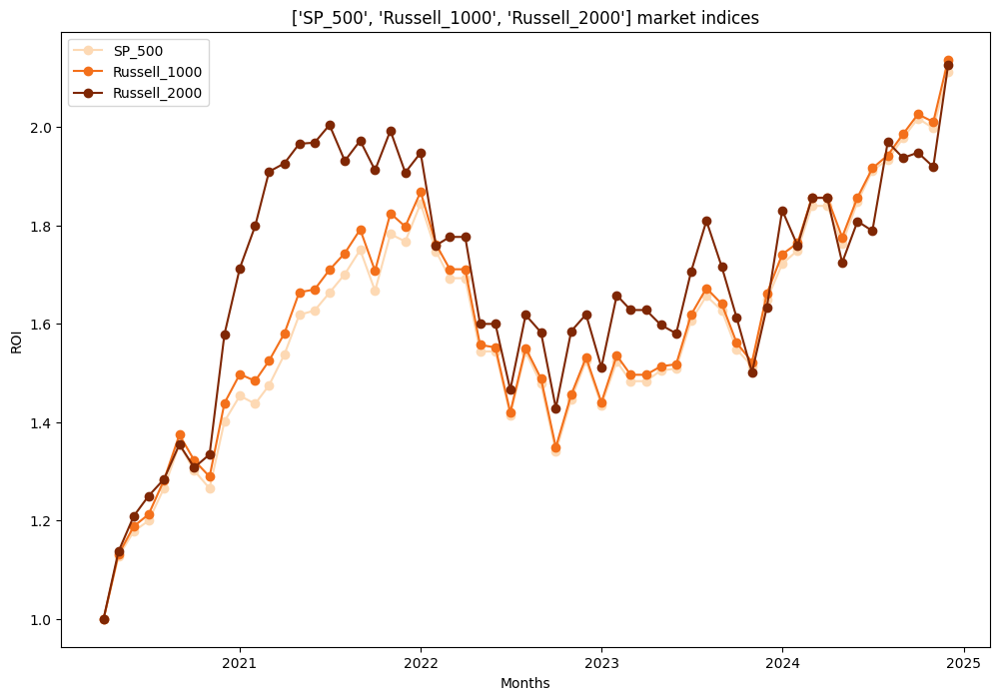

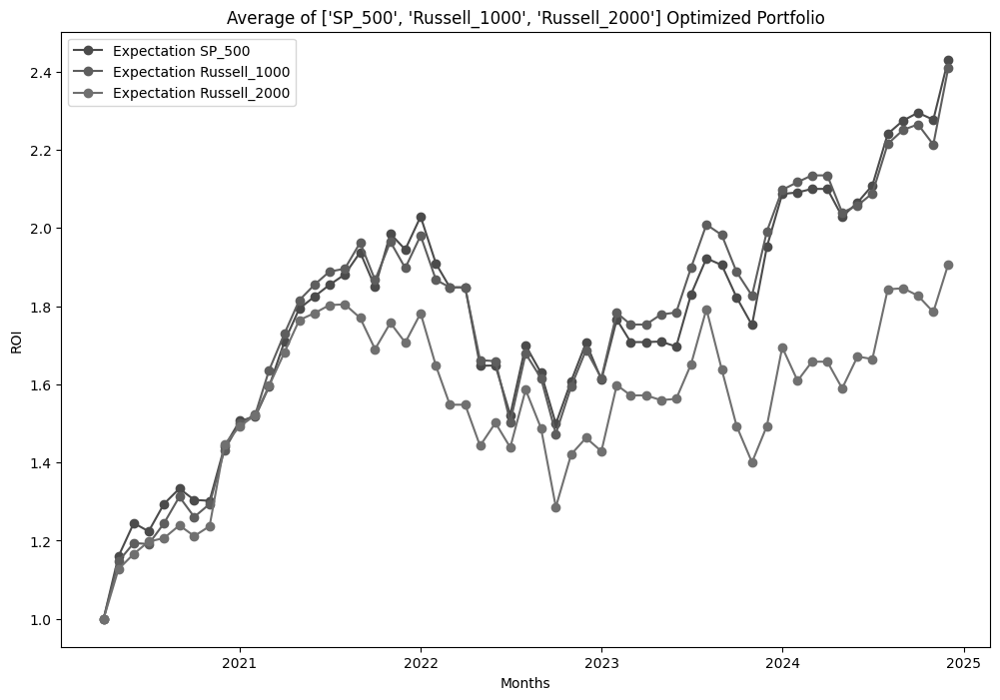

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


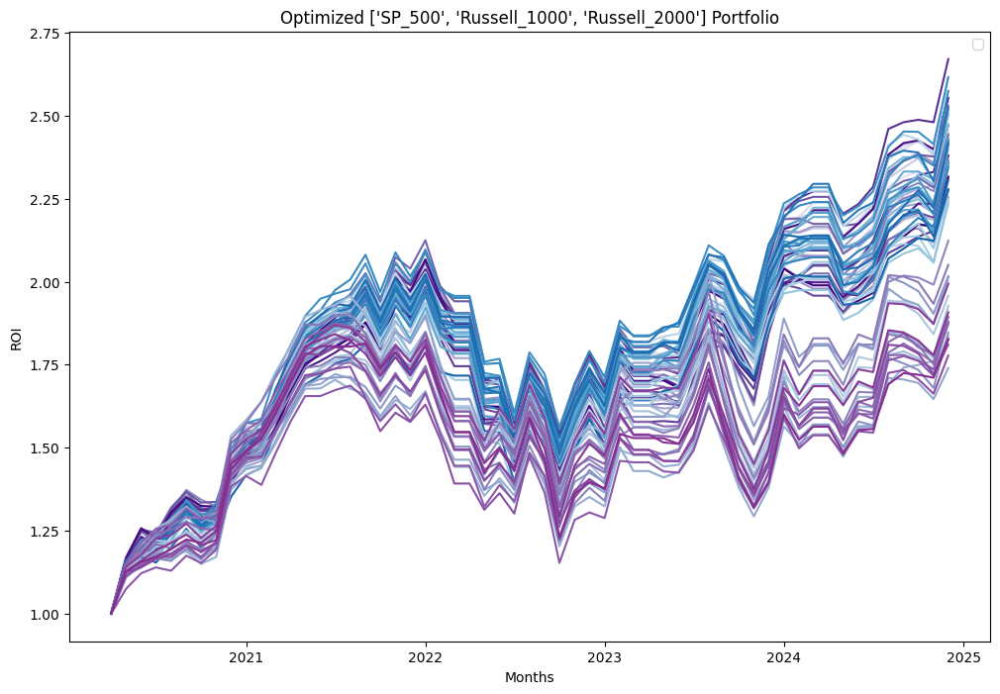

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


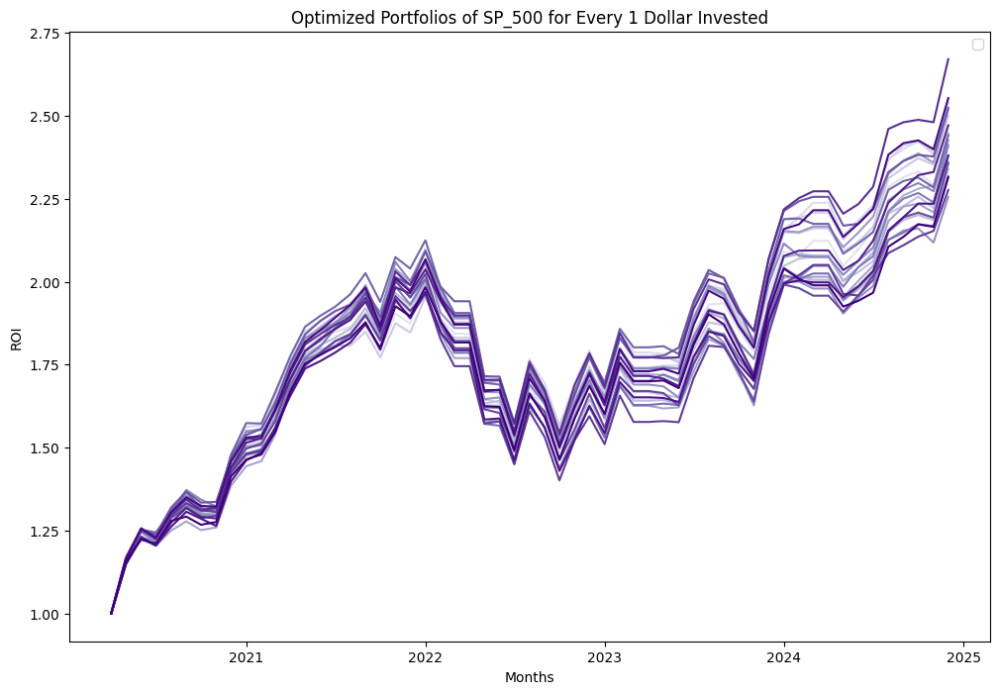

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


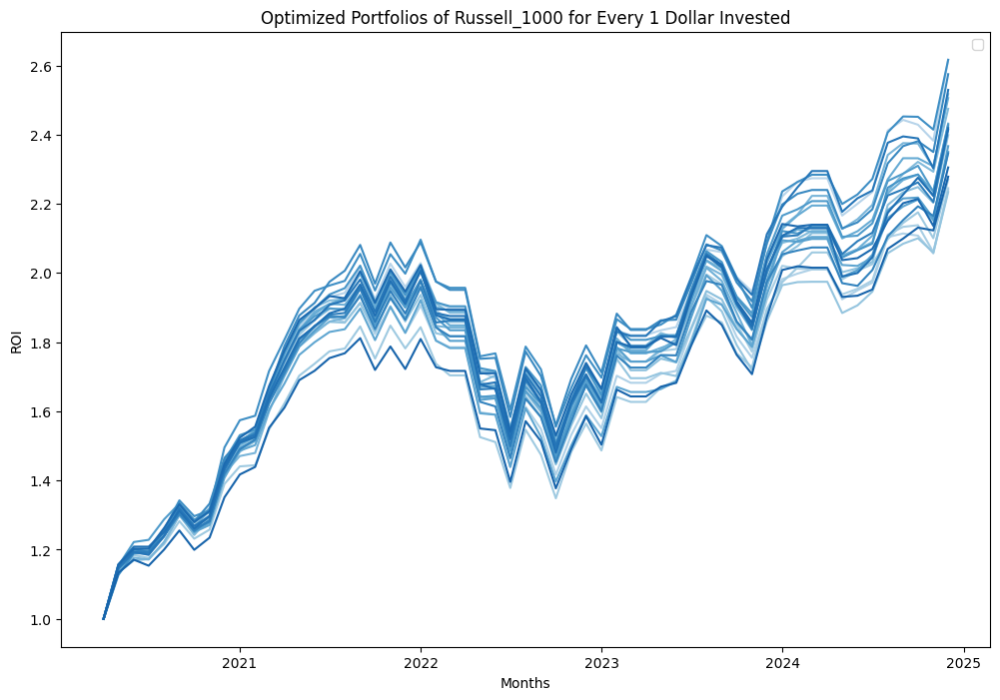

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


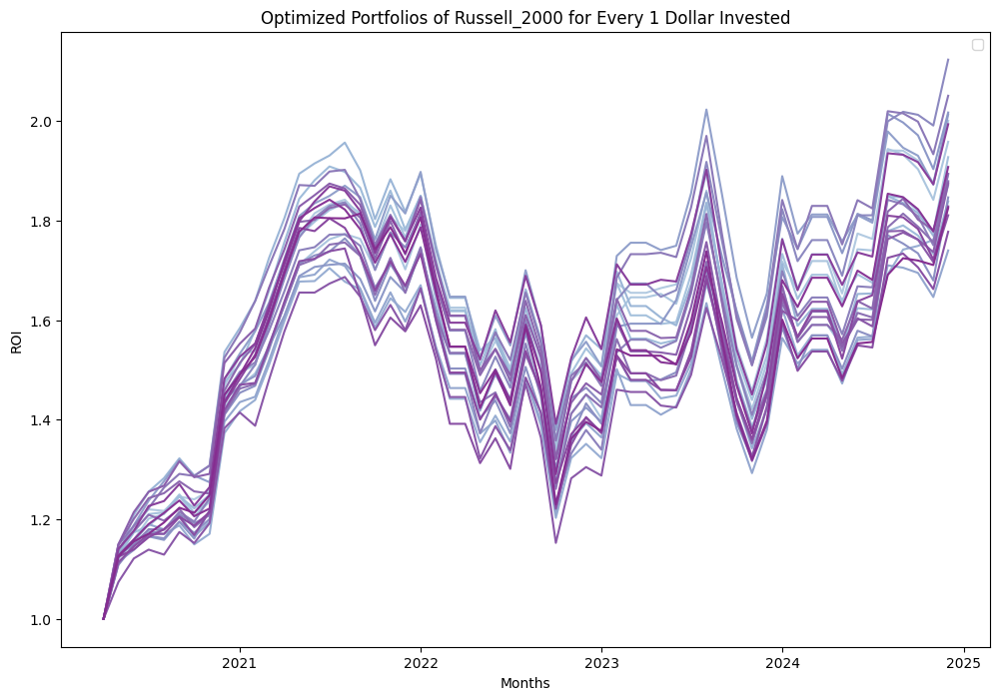

In [697]:
avglist1=ffinal_visual(['SP_500','Russell_1000','Russell_2000'],[oos1_list,Roos1_list,roos1_list])
ffinal_visual1(['SP_500','Russell_1000','Russell_2000'],[oos1_list,Roos1_list,roos1_list])
ffinal_visual2(['SP_500','Russell_1000','Russell_2000'],[oos1_list,Roos1_list,roos1_list])
ffinal_visual3(['SP_500','Russell_1000','Russell_2000'],[oos1_list,Roos1_list,roos1_list])
ffinal_visual4(['SP_500','Russell_1000','Russell_2000'],[oos1_list,Roos1_list,roos1_list])
ffinal_visual5(['SP_500','Russell_1000','Russell_2000'],[oos1_list,Roos1_list,roos1_list])


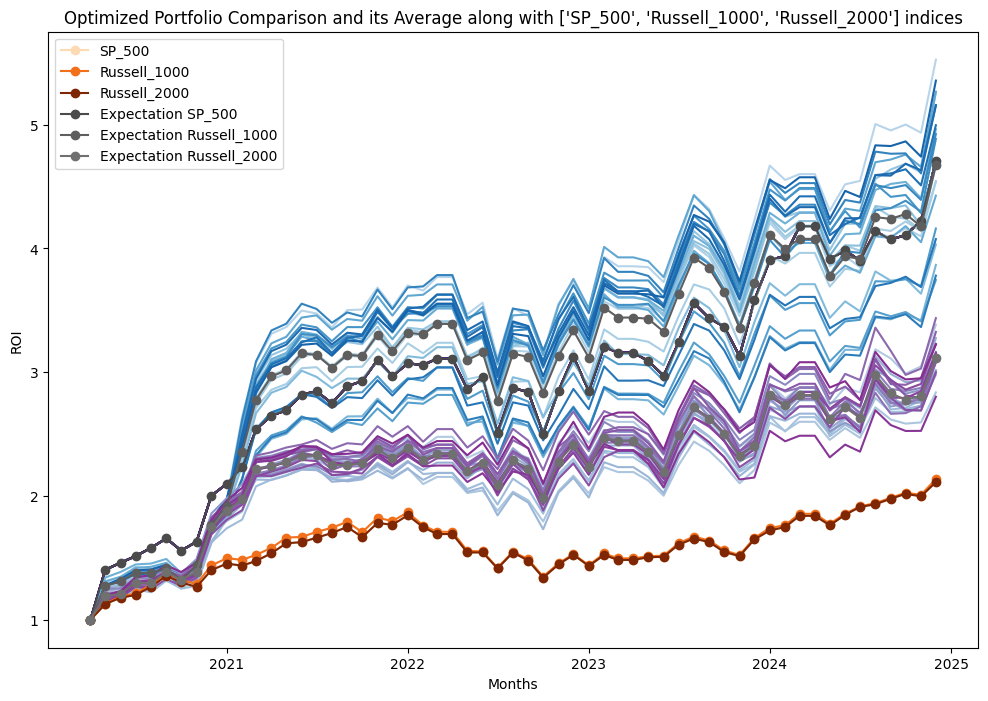

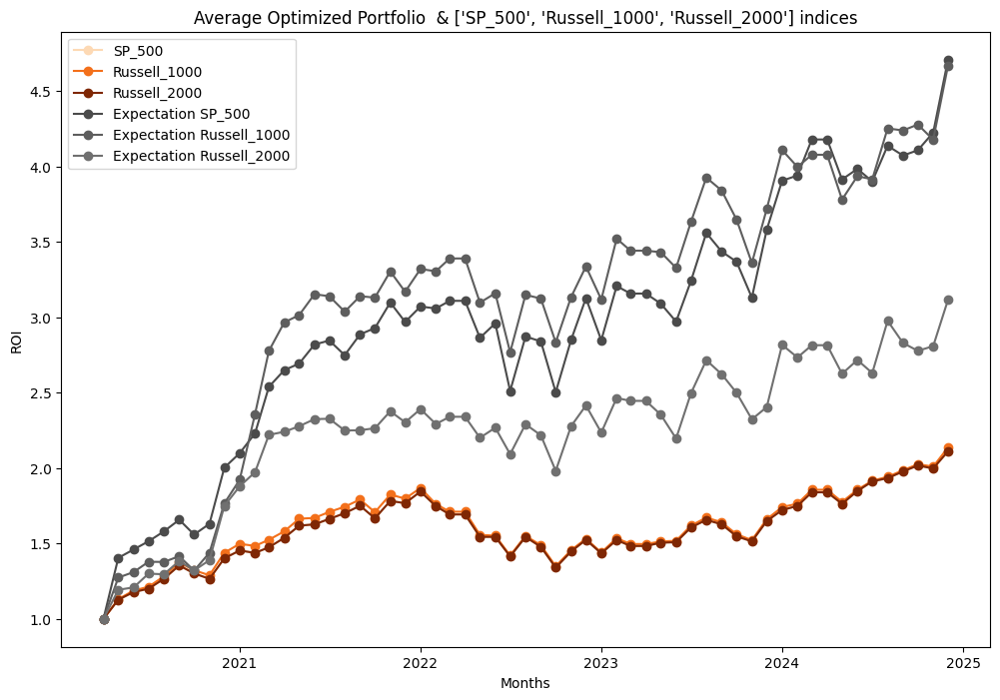

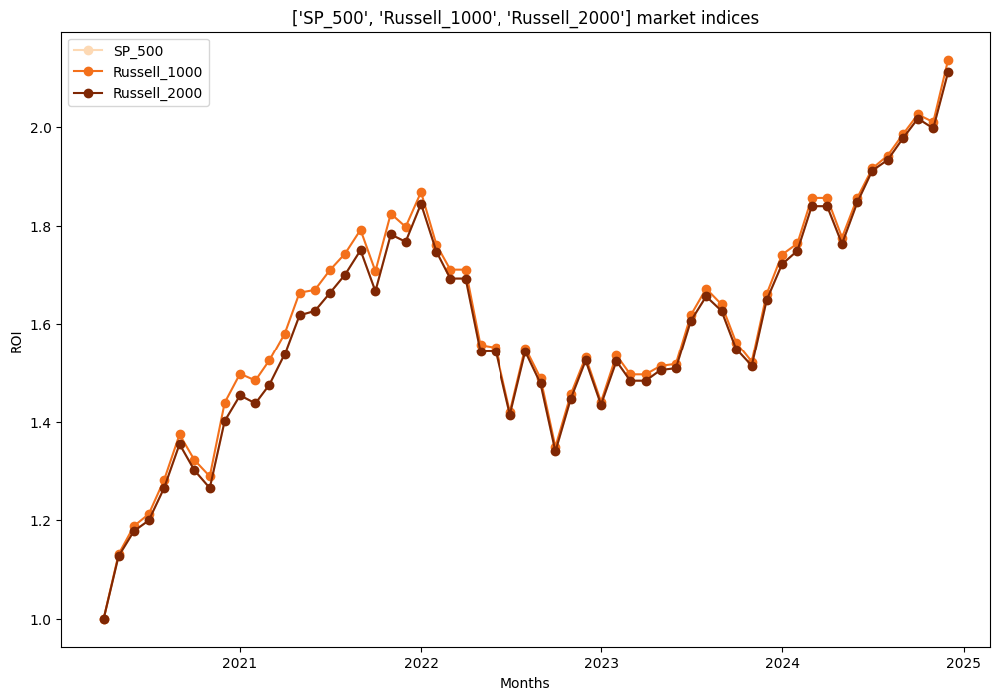

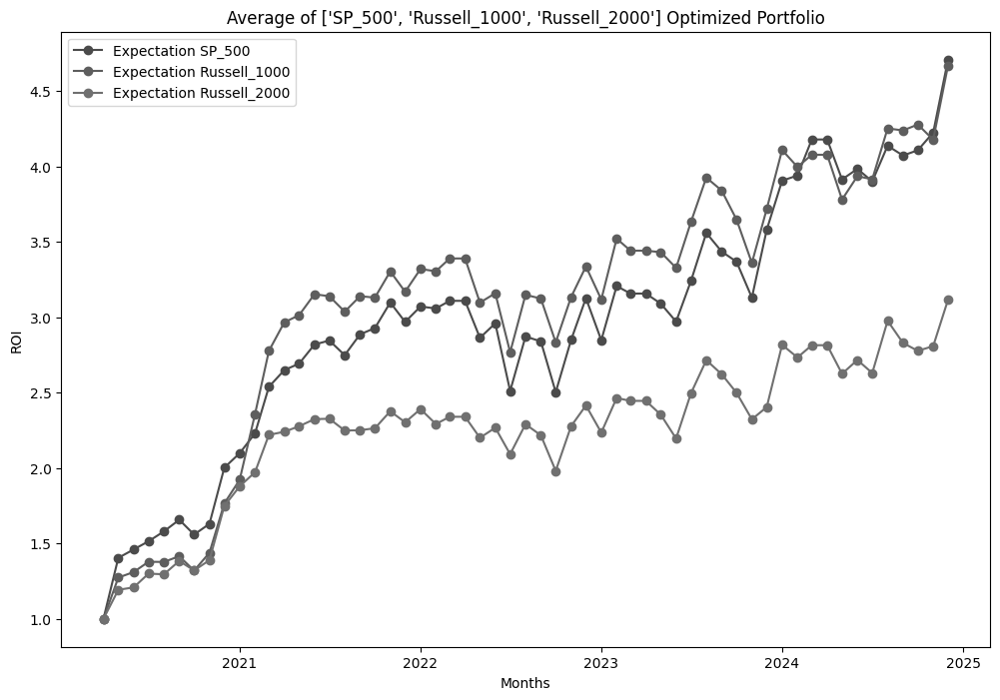

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


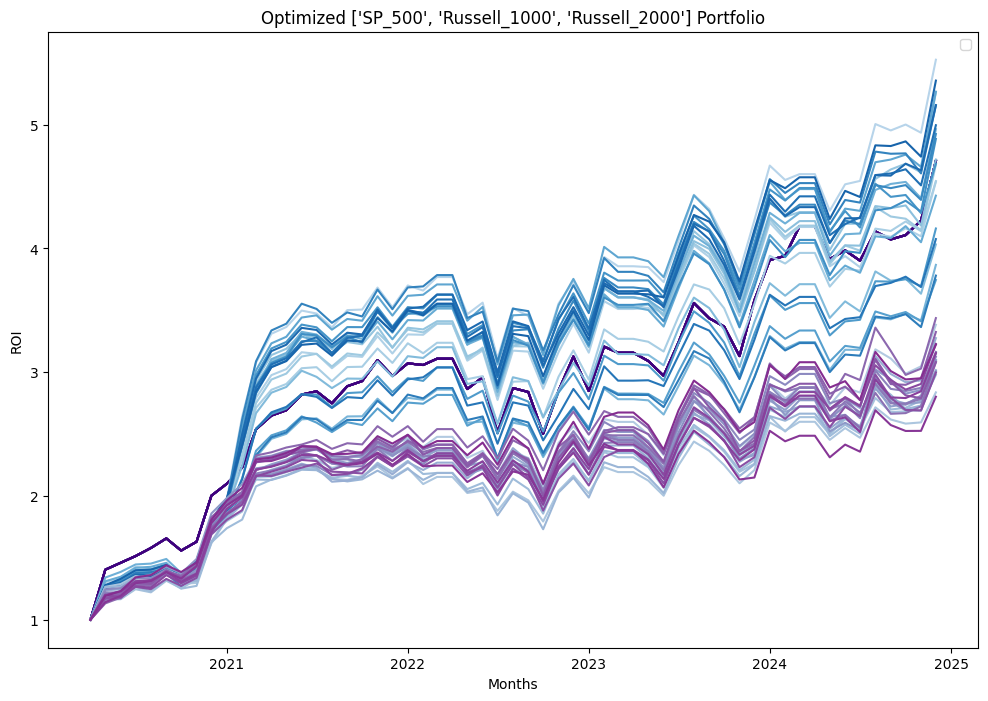

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


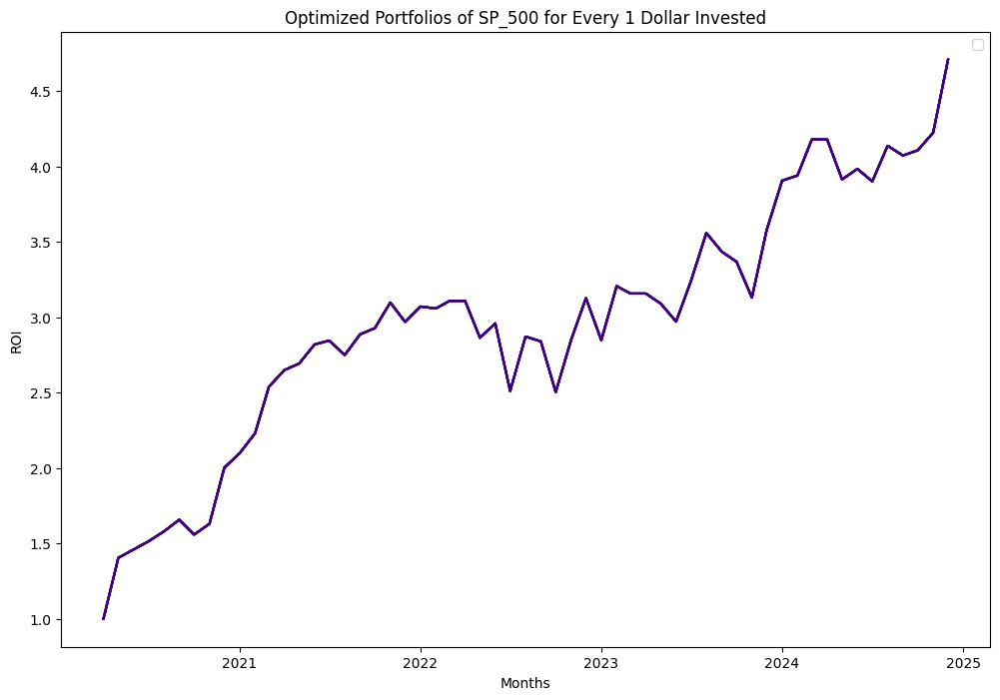

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


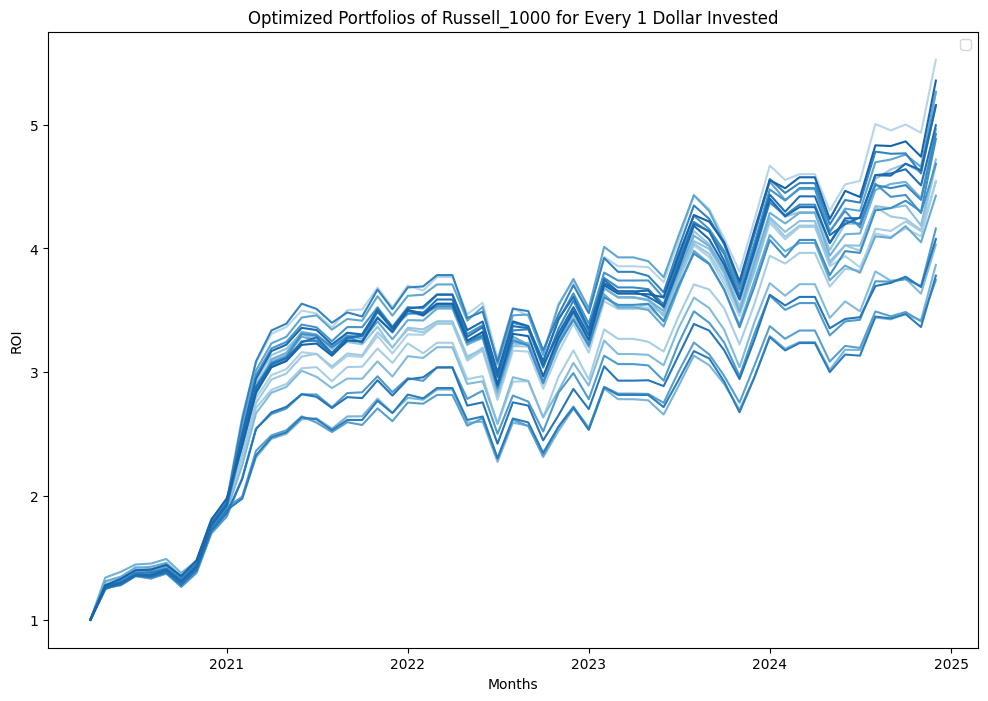

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


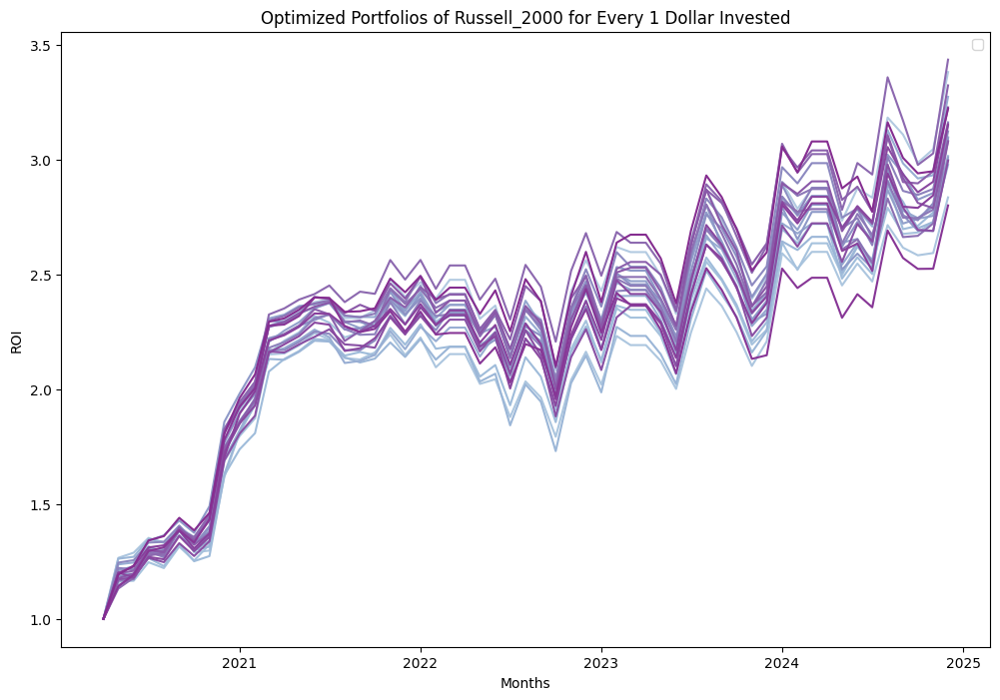

In [696]:
avglist2=ffinal_visual(['SP_500','Russell_1000','Russell_2000'],[oos1_list2,R2oos1_list,r2oos1_list])
ffinal_visual1(['SP_500','Russell_1000','Russell_2000'],[oos1_list2,R2oos1_list,r2oos1_list])
ffinal_visual2(['SP_500','Russell_1000','Russell_2000'],[oos1_list2,R2oos1_list,r2oos1_list])
ffinal_visual3(['SP_500','Russell_1000','Russell_2000'],[oos1_list2,R2oos1_list,r2oos1_list])
ffinal_visual4(['SP_500','Russell_1000','Russell_2000'],[oos1_list2,R2oos1_list,r2oos1_list])
ffinal_visual5(['SP_500','Russell_1000','Russell_2000'],[oos1_list2,R2oos1_list,r2oos1_list])

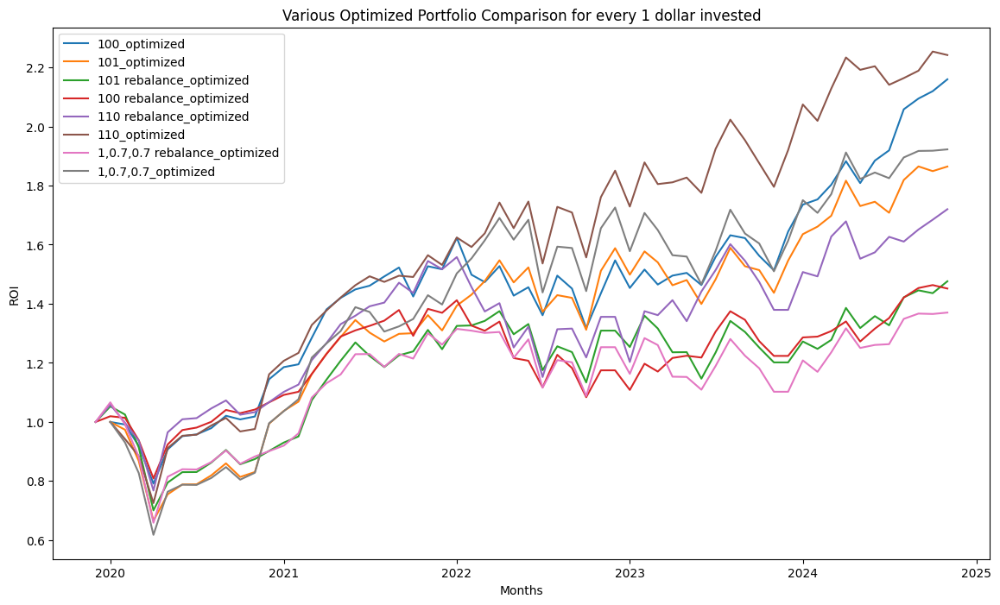

00 nodes, 40833 on tree, 0.016092726 best solution, best possible 0 (247968.58 seconds)
Cbc0010I After 1286000 nodes, 40711 on tree, 0.016092726 best solution, best possible 0 (248035.37 seconds)
Cbc0010I After 1287000 nodes, 40713 on tree, 0.016092726 best solution, best possible 0 (248093.65 seconds)
Cbc0010I After 1288000 nodes, 40717 on tree, 0.016092726 best solution, best possible 0 (248140.83 seconds)
Cbc0010I After 1289000 nodes, 40724 on tree, 0.016092726 best solution, best possible 0 (248190.63 seconds)
Cbc0010I After 1290000 nodes, 40718 on tree, 0.016092726 best solution, best possible 0 (248234.01 seconds)
Cbc0010I After 1291000 nodes, 40716 on tree, 0.016092726 best solution, best possible 0 (248303.79 seconds)
Cbc0010I After 1292000 nodes, 40707 on tree, 0.016092726 best solution, best possible 0 (248437.21 seconds)
Cbc0010I After 1293000 nodes, 40707 on tree, 0.016092726 best solution, best possible 0 (248517.17 seconds)
Cbc0010I After 1294000 nodes, 40723 on tree, 0.0

In [265]:
finale_visual(flist) #optimized

# Sharpe

In [518]:

sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list2)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(R2oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(r2oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')

The sharpe ratio of the portfolio on average:0    1.151591
dtype: float64
The sharpe ratio of the sp500 : 0.8721383856585606
The sharpe ratio of the portfolio on average:0    1.189543
dtype: float64
The sharpe ratio of the sp500 : 0.8720605506617098
The sharpe ratio of the portfolio on average:0    0.945735
dtype: float64
The sharpe ratio of the sp500 : 0.8721383856585606


In [512]:

sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(Roos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(roos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')

The sharpe ratio of the portfolio on average:0    0.956944
dtype: float64
The sharpe ratio of the sp500 : 0.8721383856585606
The sharpe ratio of the portfolio on average:0    0.963225
dtype: float64
The sharpe ratio of the sp500 : 0.8720605506617098
The sharpe ratio of the portfolio on average:0    0.621454
dtype: float64
The sharpe ratio of the sp500 : 0.7191361255746382


In [535]:
row_names = ['sp500', 'RTY1000', 'RTY2000']
col_names = ['Index', '100_MF_Portfolio', '128_MF_Portfolio']

# Values for the DataFrame
values = [
    [0.8721383856585606, 0.956944, 1.151591],
    [0.8720605506617098, 0.963225, 1.189543],
    [0.7191361255746382, 0.621454, 0.945735]
]

# Create DataFrame with the values, row names, and column names
sharpe_df = pd.DataFrame(values, index=row_names, columns=col_names)
print("   Sharpe Ratio of Index and Optimized Portfolios")
round(sharpe_df,2).T

   Sharpe Ratio of Index and Optimized Portfolios


,sp500,RTY1000,RTY2000
Index,0.87,0.87,0.72
100_MF_Portfolio,0.96,0.96,0.62
128_MF_Portfolio,1.15,1.19,0.95


# YOY 

In [455]:
print(oos1_average)
print(Roos1_average)
print(roos1_average)

{1: 1.7089267186124018, 2: 1.8481443751978974, 3: 1.7081267232279833, 4: 2.1000320801499934, 5: 2.4307353995342993}
{1: 1.729359968217016, 2: 1.848121984768197, 3: 1.7529988701154027, 4: 2.134631422654667, 5: 2.4086085908017916}
{1: 1.6812244587942593, 2: 1.5478416993625588, 3: 1.5717623750355039, 4: 1.6579320161116484, 5: 1.9066163792739133}


In [536]:
print(oos1_average2)
print(R2oos1_average)
print(r2oos1_average)

{1: 2.649415399667822, 2: 3.109056514962342, 3: 3.1573352791754554, 4: 4.179170051914407, 5: 4.708634992158152}
{1: 2.965877177141455, 2: 3.3901122351294104, 3: 3.441640953555671, 4: 4.077799330161278, 5: 4.670314035994683}
{1: 2.2406009257228447, 2: 2.3400358287319225, 3: 2.445513474811735, 4: 2.8146866178684427, 5: 3.116603458510326}


In [537]:

fund1 = [1,2.649415399667822, 3.109056514962342, 3.1573352791754554, 4.179170051914407, 4.708634992158152]
fund2 = [1,2.965877177141455, 3.3901122351294104,3.441640953555671, 4.077799330161278, 4.670314035994683]
fund3 = [1,2.2406009257228447, 2.3400358287319225, 2.445513474811735, 2.8146866178684427,3.116603458510326]


# Calculate YoY returns for each fund
yoy_fund1 = yoy_return(fund1)
yoy_fund2 = yoy_return(fund2)
yoy_fund3 = yoy_return(fund3)

# Creating a DataFrame
data = {
    'Year': [1,2, 3, 4, 5],
    'MF_SP500_128': yoy_fund1,
    'MF_RTY1000_128': yoy_fund2,
    'MF_RTY2000_128': yoy_fund3
}

df = pd.DataFrame(data)
df=df.set_index('Year')
print("          Year-on-Year Performance - Total Return")
round(df,2)

          Year-on-Year Performance - Total Return


,MF_SP500_128,MF_RTY1000_128,MF_RTY2000_128
Year,,,
1,164.94,196.59,124.06
2,17.35,14.30,4.44
3,1.55,1.52,4.51
4,32.36,18.48,15.10
5,12.67,14.53,10.73


In [577]:

fund1 = [1,1.5371434656068665, 1.6923121544530415, 1.483029403508162, 1.8392192472498572, 2.111558026230524]
fund2 = [1,1.580081751371348, 1.710418005068867, 1.4960148525718393, 1.8559836338870523, 2.1364313900795775]
fund3 = [1,1.9256896359802385, 1.7761543134766427, 1.627606283587066, 1.8554811041432275, 2.1263767383034353]


# Calculate YoY returns for each fund
yoy_fund1 = yoy_return(fund1)
yoy_fund2 = yoy_return(fund2)
yoy_fund3 = yoy_return(fund3)

# Creating a DataFrame
data = {
    'Year': [1,2, 3, 4, 5],
    'SPY_500 Index': yoy_fund1,
    'RTY1000 Index': yoy_fund2,
    'RTY2000 Index': yoy_fund3
}

df = pd.DataFrame(data)
df=df.set_index('Year')
print("       Year-on-Year Performance - Total Return")
round(df,2)

       Year-on-Year Performance - Total Return


,SPY_500 Index,RTY1000 Index,RTY2000 Index
Year,,,
1,53.71,58.01,92.57
2,10.09,8.25,-7.77
3,-12.37,-12.54,-8.36
4,24.02,24.06,14.00
5,14.81,15.11,14.60


In [485]:

fund1 = [1,1.7089, 1.8481, 1.7081, 2.1000, 2.4307]
fund2 = [1,1.7294, 1.8481, 1.7530, 2.1346, 2.4086]
fund3 = [1,1.6812, 1.5478, 1.5718, 1.6579, 1.9066]



# Calculate YoY returns for each fund
yoy_fund1 = yoy_return(fund1)
yoy_fund2 = yoy_return(fund2)
yoy_fund3 = yoy_return(fund3)

# Creating a DataFrame
data = {
    'Year': [1,2, 3, 4, 5],
    'MF_SP500_100': yoy_fund1,
    'MF_RTY1000_100': yoy_fund2,
    'MF_RTY2000_100': yoy_fund3
}

df = pd.DataFrame(data)
df=df.set_index('Year')
print("          Year-on-Year Performance - Total Return")
round(df,2)



          Year-on-Year Performance - Total Return


,MF_SP500_100,MF_RTY1000_100,MF_RTY2000_100
Year,,,
1,70.89,72.94,68.12
2,8.15,6.86,-7.93
3,-7.58,-5.15,1.55
4,22.94,21.77,5.48
5,15.75,12.84,15.00


# % Monthly Visual

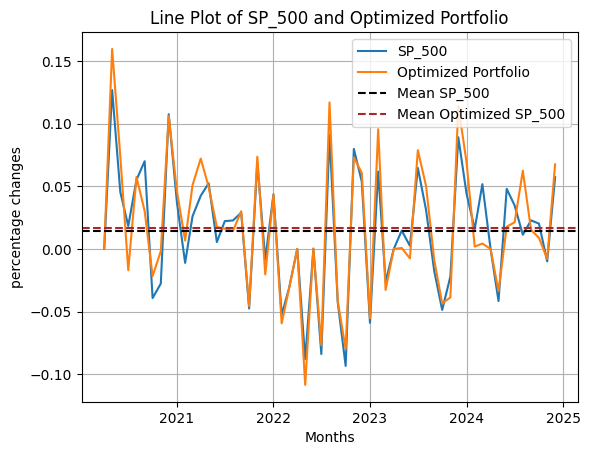

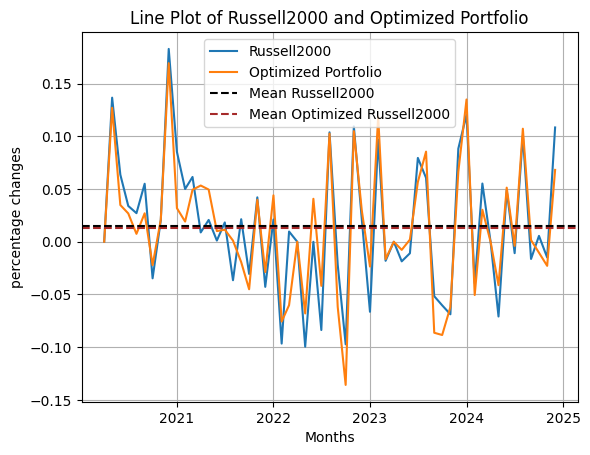

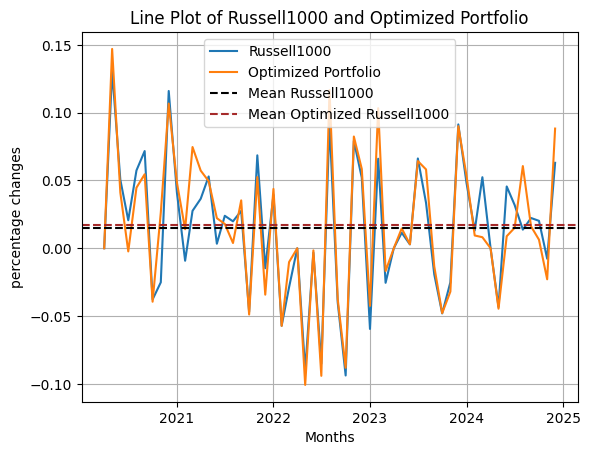

,SP_500,Optimized Portfolio,Russell_1000,Optimized Russell_1000,Russell_2000,Optimized Russell_2000
SP_500,1.000000,0.939167,0.998510,0.930158,0.850306,0.823724
Optimized Portfolio,0.939167,1.000000,0.943686,0.972104,0.879518,0.862643
Russell_1000,0.998510,0.943686,1.000000,0.936625,0.870468,0.833858
Optimized Russell_1000,0.930158,0.972104,0.936625,1.000000,0.902780,0.870885
Russell_2000,0.850306,0.879518,0.870468,0.902780,1.000000,0.915882
Optimized Russell_2000,0.823724,0.862643,0.833858,0.870885,0.915882,1.000000


In [369]:
Paveraged_df=converter_cumulative(averaged_df,'SP_500')
Praveraged_df=converter_cumulative(raveraged_df,'Russell2000')
PRaveraged_df=converter_cumulative(Raveraged_df,'Russell1000')
Praveraged_df.rename(columns={'SP_500':'Russell_2000','Optimized Portfolio':'Optimized Russell_2000'},inplace=True)
PRaveraged_df.rename(columns={'SP_500':'Russell_1000','Optimized Portfolio':'Optimized Russell_1000'},inplace=True)
correlation_of_all_returns(Paveraged_df,PRaveraged_df,Praveraged_df)

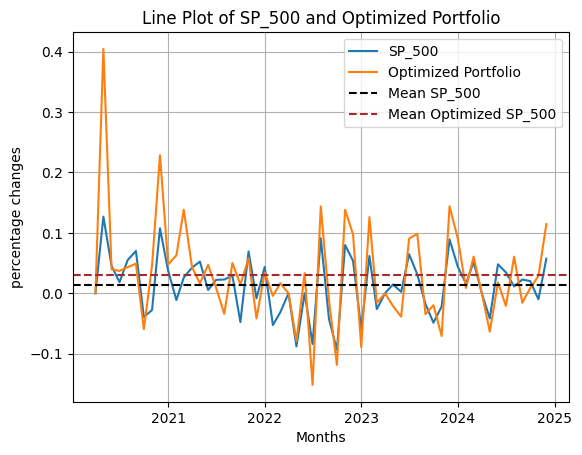

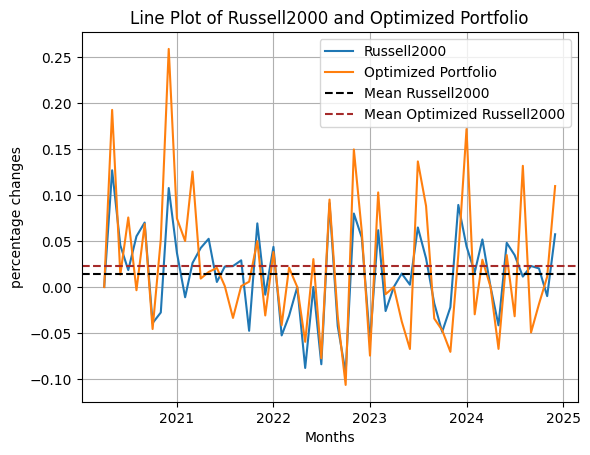

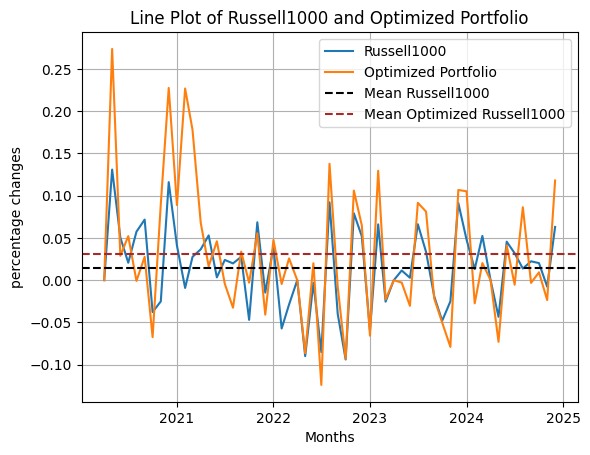

,SP_500,Optimized Portfolio,Russell_1000,Optimized Russell_1000,Russell_2000,Optimized Russell_2000
SP_500,1.000000,0.807720,0.998510,0.723369,1.000000,0.732378
Optimized Portfolio,0.807720,1.000000,0.820560,0.913493,0.807720,0.874114
Russell_1000,0.998510,0.820560,1.000000,0.738402,0.998510,0.751349
Optimized Russell_1000,0.723369,0.913493,0.738402,1.000000,0.723369,0.884636
Russell_2000,1.000000,0.807720,0.998510,0.723369,1.000000,0.732378
Optimized Russell_2000,0.732378,0.874114,0.751349,0.884636,0.732378,1.000000


In [583]:
P2averaged_df=converter_cumulative(averaged_df2,'SP_500')
P2raveraged_df=converter_cumulative(r2averaged_df,'Russell2000')
P2Raveraged_df=converter_cumulative(R2averaged_df,'Russell1000')
P2raveraged_df.rename(columns={'SP_500':'Russell_2000','Optimized Portfolio':'Optimized Russell_2000'},inplace=True)
P2Raveraged_df.rename(columns={'SP_500':'Russell_1000','Optimized Portfolio':'Optimized Russell_1000'},inplace=True)
correlation_of_all_returns(P2averaged_df,P2Raveraged_df,P2raveraged_df)

In [387]:
raveraged_df.rename(columns={'SP_500':'Russell_2000','Optimized Portfolio':'Optimized Russell_2000'},inplace=True)
Raveraged_df.rename(columns={'SP_500':'Russell_1000','Optimized Portfolio':'Optimized Russell_1000'},inplace=True)

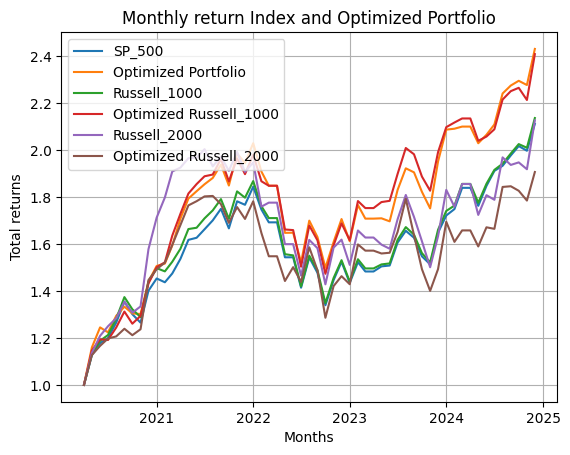

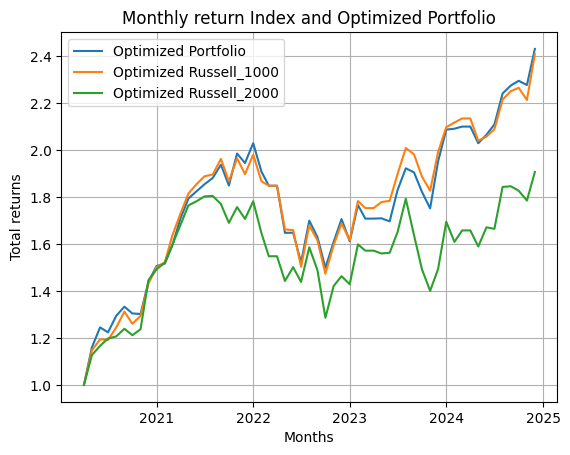

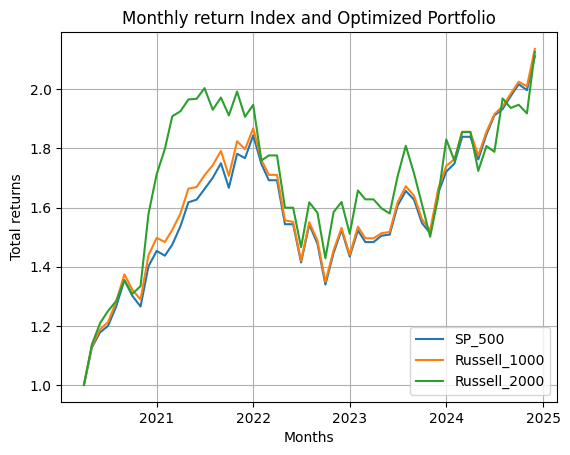

In [389]:
fig, ax = plt.subplots()
for df in [averaged_df,Raveraged_df,raveraged_df]:
    ax.plot(df.index, df.iloc[:,0], label=df.columns[0])
    ax.plot(df.index, df.iloc[:,1], label=df.columns[1])
ax.set_xlabel('Months')
ax.set_ylabel('Total returns')
ax.set_title(f'Monthly return Index and Optimized Portfolio')
ax.legend()
ax.grid(True)
plt.show()
fig, ax = plt.subplots()
for df in [averaged_df,Raveraged_df,raveraged_df]:
    # ax.plot(df.index, df.iloc[:,0], label=df.columns[0])
    ax.plot(df.index, df.iloc[:,1], label=df.columns[1])
ax.set_xlabel('Months')
ax.set_ylabel('Total returns')
ax.set_title(f'Monthly return Index and Optimized Portfolio')
ax.legend()
ax.grid(True)
plt.show()
fig, ax = plt.subplots()
for df in [averaged_df,Raveraged_df,raveraged_df]:
    ax.plot(df.index, df.iloc[:,0], label=df.columns[0])
    # ax.plot(df.index, df.iloc[:,1], label=df.columns[1])
ax.set_xlabel('Months')
ax.set_ylabel('Total returns')
ax.set_title(f'Monthly return Index and Optimized Portfolio')
ax.legend()
ax.grid(True)
plt.show()

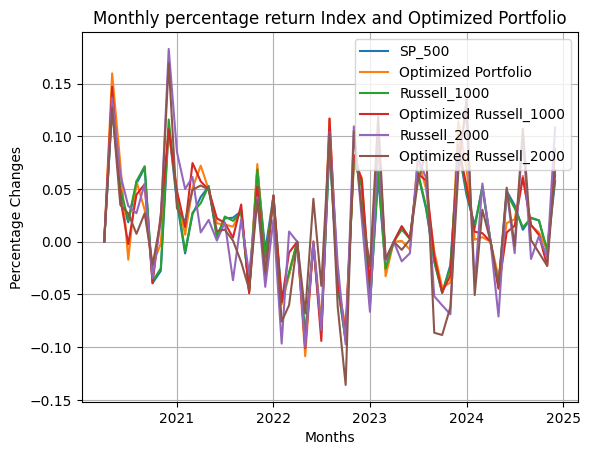

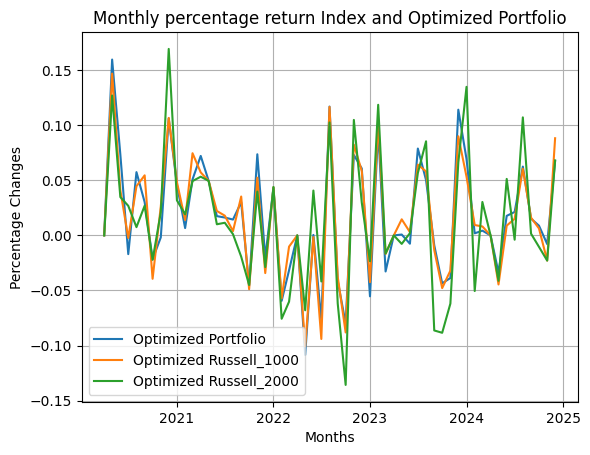

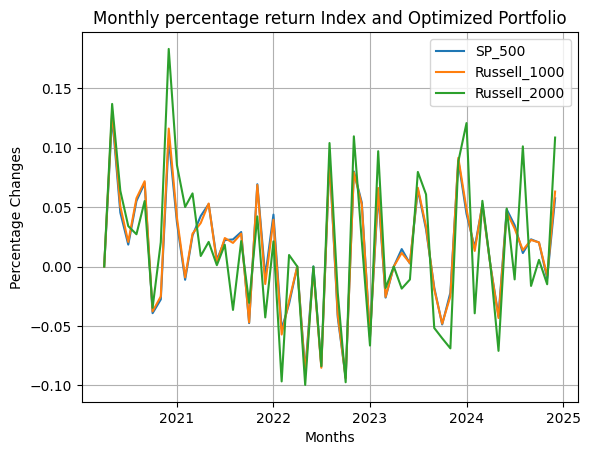

In [384]:
fig, ax = plt.subplots()
for df in [Paveraged_df,PRaveraged_df,Praveraged_df]:
    ax.plot(df.index, df.iloc[:,0], label=df.columns[0])
    ax.plot(df.index, df.iloc[:,1], label=df.columns[1])
ax.set_xlabel('Months')
ax.set_ylabel('Percentage Changes')
ax.set_title(f'Monthly percentage return Index and Optimized Portfolio')
ax.legend()
ax.grid(True)
plt.show()
fig, ax = plt.subplots()
for df in [Paveraged_df,PRaveraged_df,Praveraged_df]:
    # ax.plot(df.index, df.iloc[:,0], label=df.columns[0])
    ax.plot(df.index, df.iloc[:,1], label=df.columns[1])
ax.set_xlabel('Months')
ax.set_ylabel('Percentage Changes')
ax.set_title(f'Monthly percentage return Index and Optimized Portfolio')
ax.legend()
ax.grid(True)
plt.show()
fig, ax = plt.subplots()
for df in [Paveraged_df,PRaveraged_df,Praveraged_df]:
    ax.plot(df.index, df.iloc[:,0], label=df.columns[0])
    # ax.plot(df.index, df.iloc[:,1], label=df.columns[1])
ax.set_xlabel('Months')
ax.set_ylabel('Percentage Changes')
ax.set_title(f'Monthly percentage return Index and Optimized Portfolio')
ax.legend()
ax.grid(True)
plt.show()

# Heatmap & Correlation

In [395]:
round(correlation_of_all_returns(Paveraged_df,PRaveraged_df,Praveraged_df),2)

,SP_500,Optimized Portfolio,Russell_1000,Optimized Russell_1000,Russell_2000,Optimized Russell_2000
SP_500,1.00,0.94,1.00,0.93,0.85,0.82
Optimized Portfolio,0.94,1.00,0.94,0.97,0.88,0.86
Russell_1000,1.00,0.94,1.00,0.94,0.87,0.83
Optimized Russell_1000,0.93,0.97,0.94,1.00,0.90,0.87
Russell_2000,0.85,0.88,0.87,0.90,1.00,0.92
Optimized Russell_2000,0.82,0.86,0.83,0.87,0.92,1.00


In [ ]:
round(correlation_of_all_returns(P2averaged_df,P2Raveraged_df,P2raveraged_df),2)

,SP_500,Optimized Portfolio,Russell_1000,Optimized Russell_1000,Russell_2000,Optimized Russell_2000
SP_500,1.00,0.94,1.00,0.93,0.85,0.82
Optimized Portfolio,0.94,1.00,0.94,0.97,0.88,0.86
Russell_1000,1.00,0.94,1.00,0.94,0.87,0.83
Optimized Russell_1000,0.93,0.97,0.94,1.00,0.90,0.87
Russell_2000,0.85,0.88,0.87,0.90,1.00,0.92
Optimized Russell_2000,0.82,0.86,0.83,0.87,0.92,1.00


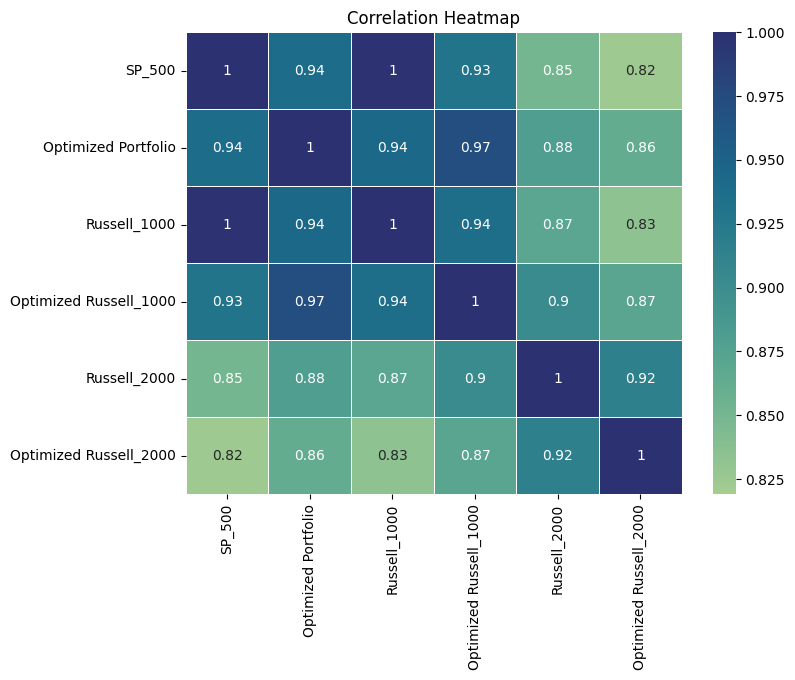

In [393]:
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_of_all_returns(Paveraged_df,PRaveraged_df,Praveraged_df), annot=True, cmap='crest', vmin=0.819, vmax=1, linewidths=0.5)

# Title for the heatmap
plt.title('Correlation Heatmap')

# Show plot
plt.show()


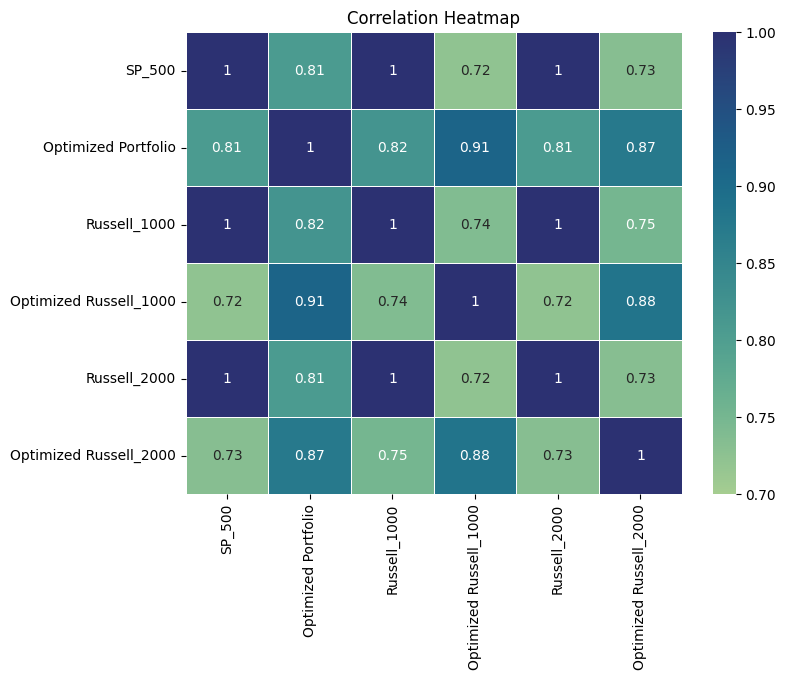

In [699]:
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_of_all_returns(P2averaged_df,P2Raveraged_df,P2raveraged_df), annot=True, cmap='crest', vmin=0.7, vmax=1, linewidths=0.5)

# Title for the heatmap
plt.title('Correlation Heatmap')

# Show plot
plt.show()

# Mean & STD

In [489]:
meanstd=mean_and_std_of_returns(Paveraged_df,PRaveraged_df,Praveraged_df)
meanstd=round(meanstd.set_index('Asset'),4)*100
meanstd.iloc[0,1]=round(meanstd.iloc[0,1],2)
meanstd.iloc[4,1]=round(meanstd.iloc[4,1],2)
meanstd = meanstd.applymap(lambda x: f"{x}%")
print("      Month-on-Month Performance")
meanstd

      Month-on-Month Performance


,Mean,Std
Asset,,
SP_500,1.43%,4.85%
Optimized Portfolio,1.71%,5.37%
Russell_1000,1.46%,4.95%
Optimized Russell_1000,1.69%,5.26%
Russell_2000,1.52%,6.31%
Optimized Russell_2000,1.32%,6.1%


# Drawdown

In [ ]:
lowest_5_values(df,1)

In [702]:
row_names = ['sp500', 'RTY1000', 'RTY2000']
col_names = ['Index (%)', '100_MF_Portfolio (%)', '128_MF_Portfolio (%)']

# Values for the DataFrame
values = [
    [-0.093396, -0.10856353, -0.15160398],
    [-0.09380413,-0.10075823, -0.12391716],
    [-0.09952161, -0.13578551, -0.1063708]
]

# Create DataFrame with the values, row names, and column names
drawdown_df = pd.DataFrame(values, index=row_names, columns=col_names)
print("             Index and Optimized Portfolios Drawdown")
round(drawdown_df,4)*100

             Index and Optimized Portfolios Drawdown


,Index (%),100_MF_Portfolio (%),128_MF_Portfolio (%)
sp500,-9.34,-10.86,-15.16
RTY1000,-9.38,-10.08,-12.39
RTY2000,-9.95,-13.58,-10.64


# Metrics

In [187]:
flist={}
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[1,0,0],2,0,0)
flist['100 rebalance']=avg_100
yoy_exp_return

KeyError: Timestamp('2020-12-01 00:00:00')

In [192]:

cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[1,0,0],11,0,0)
flist['100']=avg_100
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.62092
dtype: float64
The sharpe ratio of the sp500 : 0.5962031559179566
Year                2021       2022       2023       2024
Percentile                                               
99 percentile  26.717420  76.104624  47.090267  94.542316
Average        23.053826  63.232326  34.682695  64.897202
1 percentile   19.386646  53.410509  21.004755  49.332261
sp500          16.258962  47.524096  18.841064  47.636981
      1 percentile return in %
Year                          
1                        17.10
2                        27.20
3                       -22.75
4                        18.51
5                        14.51


,1,2,3,4,5
99th Percentile,26.71,38.79,-11.98,31.78,21.81
Median,23.29,33.02,-17.90,21.98,18.69
1st Percentile,17.10,27.20,-22.75,18.51,14.51
SP500,16.26,26.89,-19.44,24.23,19.62


In [199]:

cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[1,0,0],11,0,0)
flist['100']=avg_100
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.538057
dtype: float64
The sharpe ratio of the sp500 : 0.5962031559179566
Year                2021       2022       2023       2024
Percentile                                               
99 percentile   3.640912  50.285393  57.784932  75.054975
Average         3.640912  50.285393  57.784932  75.054975
1 percentile    3.640912  50.285393  57.784932  75.054975
sp500          16.258962  47.524096  18.841064  47.636981
      1 percentile return in %
Year                          
1                         3.64
2                        45.01
3                         4.99
4                        10.95
5                         9.82


,1,2,3,4,5
99th Percentile,3.64,45.01,4.99,10.95,9.82
Median,3.64,45.01,4.99,10.95,9.82
1st Percentile,3.64,45.01,4.99,10.95,9.82
SP500,16.26,26.89,-19.44,24.23,19.62


# Saving analysis to excel sheet

In [ ]:
from openpyxl import Workbook
workbook_filename = 'outputs/combination_data.xlsx'
wb = Workbook()
wb.save(workbook_filename)


In [ ]:
save_df_with_combination_to_excel(sim_one_percentile,workbook_filename,'downside_protection',[1,0.75,0.5],0,0,0)

(1,)

In [ ]:
save_df_with_combination_to_excel(gdsk,workbook_filename,'downside_protection',['SP500','SP500','SP500'],1,0,0)

(2,)

In [ ]:
save_df_with_combination_to_excel(sim_one_percentile,workbook_filename,'downside_protection',[1,0.5,0.5],2,0,0)

(3,)

# Error checking area

In [ ]:
simulator(1,0,0,n_year_before,out_of_sample_year_end[2],upatebudget,50)
sjijas=out_of_sampless(out_of_sample_year_start[3],out_of_sample_year_end[3])
tostorelist.append(sjijas)
upatebudget=sjijas['Optimized Portfolio'][-1]*1000000




Column 'FOX' could not be converted to float.
Column 'FOXA' could not be converted to float.
Column 'TPL' could not be converted to float.
True


KeyboardInterrupt: 

In [ ]:
upatebudget=sjijas['Optimized Portfolio'][-1]*1000000

In [ ]:
simulator(1,0,0,n_year_before,n_year_after,1000000,50)
sjijas=out_of_sampless(out_of_sample_year_start[1],out_of_sample_year_end[1])
tostorelist.append(sjijas)
upatebudget=sjijas['Optimized Portfolio'][-1]*1000000




Column 'FOX' could not be converted to float.
Column 'FOXA' could not be converted to float.
True
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/d158aa235171444682b203a5a0404b18-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/d158aa235171444682b203a5a0404b18-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2316 COLUMNS
At line 41761 RHS
At line 44073 BOUNDS
At line 44521 ENDATA
Problem MODEL has 2311 rows, 2271 columns and 38514 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.07 seconds
Cgl0004I processed model has 968 rows, 1374 columns (446 integer (446 of which binary)) and 35752 elements
Cbc0038I Initial

In [ ]:
upatebudget

1272053.7273467889

In [ ]:
out_of_sample_year_end[2]

'2021-12-01'